# Deep learning based flood segmentation: evaluating EfficientNet and ResNet for UNet, SegNet and DeepLabV3+

### 1. Install and import libraries

In [ ]:
!pip -q install segmentation-models-pytorch albumentations opencv-python-headless scikit-learn pandas tqdm matplotlib timm

from google.colab  import drive

import os
import re
import gc
import cv2
import time
import timm
import shutil
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from glob import glob
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import KFold

import albumentations as A
from albumentations.pytorch import ToTensorV2

import segmentation_models_pytorch as smp

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 13.4 MB/s eta 0:00:00


### 2. Mount drive and check gpu

In [ ]:
drive.mount("/content/drive")

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
GPU: NVIDIA A100-SXM4-40GB


### 3. Unzip datatset

In [ ]:
ZIP_PATH = "/content/drive/MyDrive/DL_Project/dataset.zip"
UNZIP_DIR = "/content/flood_dataset_unzipped"

if os.path.exists(UNZIP_DIR):
    shutil.rmtree(UNZIP_DIR)

os.makedirs(UNZIP_DIR, exist_ok=True)

!unzip -q "$ZIP_PATH" -d "$UNZIP_DIR"

print("Dataset unzipped to:", UNZIP_DIR)

Dataset unzipped to: /content/flood_dataset_unzipped


### 4. Detect dataset folders

In [ ]:
def find_dataset_root(unzip_dir):
    for current_root, subdirs, files in os.walk(unzip_dir):
        train_images = os.path.join(current_root, "train", "images")
        train_labels = os.path.join(current_root, "train", "labels")
        val_images = os.path.join(current_root, "val", "images")
        val_labels = os.path.join(current_root, "val", "labels")

        if (
            os.path.isdir(train_images)
            and os.path.isdir(train_labels)
            and os.path.isdir(val_images)
            and os.path.isdir(val_labels)
        ):
            return current_root

    raise ValueError(
        "Could not find dataset root with train/images, train/labels, "
        "val/images, and val/labels."
    )


DATA_ROOT = find_dataset_root(UNZIP_DIR)

TRAIN_IMAGE_DIR = os.path.join(DATA_ROOT, "train", "images")
TRAIN_MASK_DIR = os.path.join(DATA_ROOT, "train", "labels")

VAL_IMAGE_DIR = os.path.join(DATA_ROOT, "val", "images")
VAL_MASK_DIR = os.path.join(DATA_ROOT, "val", "labels")

VALID_EXTS = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")


def get_all_image_files(folder):
    return [
        p for p in glob(os.path.join(folder, "*"))
        if p.lower().endswith(VALID_EXTS)
    ]


print("DATA_ROOT:", DATA_ROOT)

print("\nTraining image folder:", TRAIN_IMAGE_DIR)
print("Training label/mask folder:", TRAIN_MASK_DIR)

print("\nValidation image folder:", VAL_IMAGE_DIR)
print("Validation label/mask folder:", VAL_MASK_DIR)

print("\nTrain images:", len(get_all_image_files(TRAIN_IMAGE_DIR)))
print("Train labels:", len(get_all_image_files(TRAIN_MASK_DIR)))
print("Val images:", len(get_all_image_files(VAL_IMAGE_DIR)))
print("Val labels:", len(get_all_image_files(VAL_MASK_DIR)))

DATA_ROOT: /content/flood_dataset_unzipped/dataset

Training image folder: /content/flood_dataset_unzipped/dataset/train/images
Training label/mask folder: /content/flood_dataset_unzipped/dataset/train/labels

Validation image folder: /content/flood_dataset_unzipped/dataset/val/images
Validation label/mask folder: /content/flood_dataset_unzipped/dataset/val/labels

Train images: 600
Train labels: 600
Val images: 63
Val labels: 63


### 5. Experiment configuration

In [ ]:
SEED = 42

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


seed_everything(SEED)

torch.backends.cudnn.benchmark = True


# -----------------------------
# Change this to False for final training
# -----------------------------
QUICK_TEST = False

if QUICK_TEST:
    EPOCHS = 2
    N_SPLITS = 2
    RUN_NAME = "quick_test"
    print("Running QUICK TEST mode.")
else:
    EPOCHS = 25
    N_SPLITS = 4
    RUN_NAME = "final_4fold_25epochs"
    print("Running FINAL EXPERIMENT mode.")


# -----------------------------
# Paper-aligned settings
# -----------------------------
IMG_SIZE = 256
BATCH_SIZE = 8
LR = 1e-4
THRESHOLD = 0.5

OUTPUT_DIR = f"/content/drive/MyDrive/DL_Project/outputs/{RUN_NAME}"
CHECKPOINT_DIR = os.path.join(OUTPUT_DIR, "checkpoints")
PLOT_DIR = os.path.join(OUTPUT_DIR, "plots")

os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

print("Device:", DEVICE)
print("Epochs:", EPOCHS)
print("Folds:", N_SPLITS)
print("Batch size:", BATCH_SIZE)
print("Learning rate:", LR)
print("Output directory:", OUTPUT_DIR)

Running FINAL EXPERIMENT mode.
Device: cuda
Epochs: 25
Folds: 4
Batch size: 8
Learning rate: 0.0001
Output directory: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs


### 6. Match image and mask files

In [ ]:
def natural_key_text(text):
    return [int(t) if t.isdigit() else t.lower() for t in re.split(r"(\d+)", text)]


def file_stem(path):
    return os.path.splitext(os.path.basename(path))[0]


def get_image_mask_pairs(image_dir, mask_dir):
    image_files = get_all_image_files(image_dir)
    mask_files = get_all_image_files(mask_dir)

    image_map = {file_stem(p): p for p in image_files}
    mask_map = {file_stem(p): p for p in mask_files}

    common_names = sorted(
        list(set(image_map.keys()) & set(mask_map.keys())),
        key=natural_key_text
    )

    missing_masks = sorted(
        list(set(image_map.keys()) - set(mask_map.keys())),
        key=natural_key_text
    )

    missing_images = sorted(
        list(set(mask_map.keys()) - set(image_map.keys())),
        key=natural_key_text
    )

    if missing_masks:
        print("Images without labels/masks:", missing_masks[:10])

    if missing_images:
        print("Labels/masks without images:", missing_images[:10])

    paired_images = [image_map[name] for name in common_names]
    paired_masks = [mask_map[name] for name in common_names]

    return paired_images, paired_masks


train_image_paths, train_mask_paths = get_image_mask_pairs(
    TRAIN_IMAGE_DIR,
    TRAIN_MASK_DIR
)

val_image_paths, val_mask_paths = get_image_mask_pairs(
    VAL_IMAGE_DIR,
    VAL_MASK_DIR
)

print("Matched train pairs:", len(train_image_paths))
print("Matched val pairs:", len(val_image_paths))

image_paths = train_image_paths + val_image_paths
mask_paths = train_mask_paths + val_mask_paths

print("\nTotal paired samples:", len(image_paths))

if len(image_paths) == 0:
    raise ValueError("No image-mask pairs found.")

if len(image_paths) != len(mask_paths):
    raise ValueError("Number of images and masks does not match.")

print("\nFirst image:", image_paths[0])
print("First mask:", mask_paths[0])

Matched train pairs: 600
Matched val pairs: 63

Total paired samples: 663

First image: /content/flood_dataset_unzipped/dataset/train/images/HS1.png
First mask: /content/flood_dataset_unzipped/dataset/train/labels/HS1.png


### 7. Visual dataset check

Image path: /content/flood_dataset_unzipped/dataset/train/images/HS1.png
Mask path: /content/flood_dataset_unzipped/dataset/train/labels/HS1.png
Image shape: (512, 512, 3)
Mask shape: (512, 512)
Unique mask values: [  0 255]


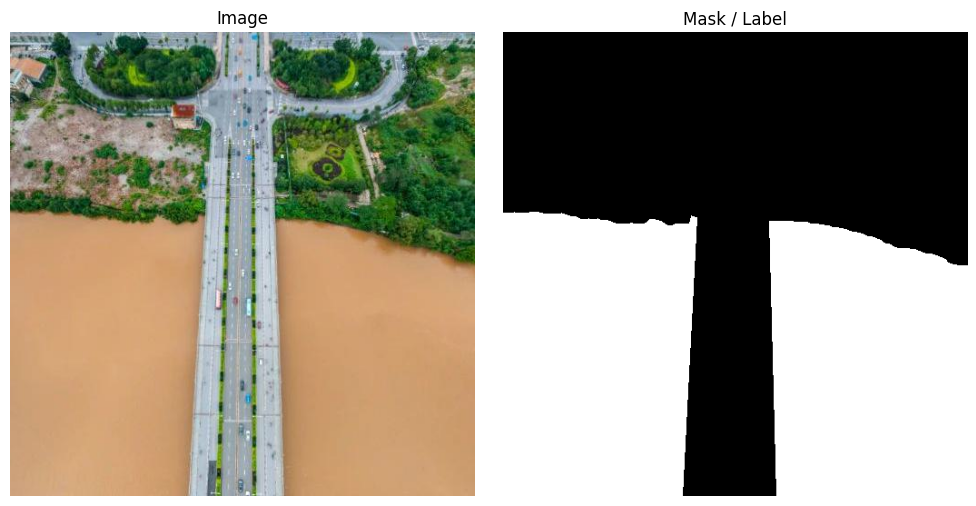

Image path: /content/flood_dataset_unzipped/dataset/train/images/HS6.png
Mask path: /content/flood_dataset_unzipped/dataset/train/labels/HS6.png
Image shape: (512, 512, 3)
Mask shape: (512, 512)
Unique mask values: [  0 255]


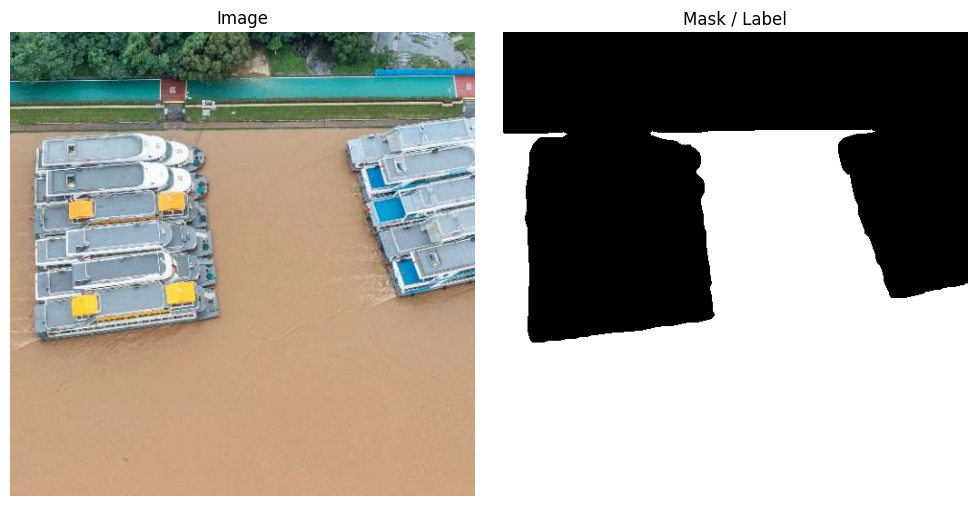

In [ ]:
def show_sample(index=0):
    image = cv2.imread(image_paths[index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_paths[index], cv2.IMREAD_GRAYSCALE)

    print("Image path:", image_paths[index])
    print("Mask path:", mask_paths[index])
    print("Image shape:", image.shape)
    print("Mask shape:", mask.shape)
    print("Unique mask values:", np.unique(mask)[:20])

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title("Image")
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Mask / Label")
    plt.imshow(mask, cmap="gray")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


show_sample(0)
show_sample(min(5, len(image_paths) - 1))

### 8. Dataset class and preprocessong

In [ ]:
class FloodDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Could not read image: {image_path}")

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise ValueError(f"Could not read mask: {mask_path}")

        mask = (mask > 127).astype(np.float32)

        if self.transform is not None:
            augmented = self.transform(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"]

        mask = mask.unsqueeze(0).float()

        return image.float(), mask


train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.10,
        rotate_limit=20,
        border_mode=cv2.BORDER_CONSTANT,
        p=0.5
    ),
    A.RandomBrightnessContrast(p=0.3),
    A.Normalize(
        mean=(0.0, 0.0, 0.0),
        std=(1.0, 1.0, 1.0),
        max_pixel_value=255.0
    ),
    ToTensorV2()
])


val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(
        mean=(0.0, 0.0, 0.0),
        std=(1.0, 1.0, 1.0),
        max_pixel_value=255.0
    ),
    ToTensorV2()
])


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


### 9. Segnet implementation

In [ ]:
class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size=2,
                stride=2
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)


class SegNetTimm(nn.Module):
    def __init__(self, encoder_name, pretrained=True, classes=1):
        super().__init__()

        self.encoder = timm.create_model(
            encoder_name,
            pretrained=pretrained,
            features_only=True,
            out_indices=(0, 1, 2, 3, 4)
        )

        encoder_channels = self.encoder.feature_info.channels()[-1]

        self.decoder = nn.Sequential(
            DecoderBlock(encoder_channels, 256),
            DecoderBlock(256, 128),
            DecoderBlock(128, 64),
            DecoderBlock(64, 32),
            DecoderBlock(32, 16)
        )

        self.segmentation_head = nn.Conv2d(16, classes, kernel_size=1)

    def forward(self, x):
        input_size = x.shape[-2:]

        features = self.encoder(x)
        x = features[-1]

        x = self.decoder(x)

        if x.shape[-2:] != input_size:
            x = F.interpolate(
                x,
                size=input_size,
                mode="bilinear",
                align_corners=False
            )

        x = self.segmentation_head(x)
        x = torch.sigmoid(x)

        return x

### 10. Build model combinations

In [ ]:
def build_model(model_name, backbone_name):
    if model_name == "UNet":
        model = smp.Unet(
            encoder_name=backbone_name,
            encoder_weights="imagenet",
            in_channels=3,
            classes=1,
            activation="sigmoid"
        )

    elif model_name == "DeepLabV3+":
        model = smp.DeepLabV3Plus(
            encoder_name=backbone_name,
            encoder_weights="imagenet",
            in_channels=3,
            classes=1,
            activation="sigmoid"
        )

    elif model_name == "SegNet":
        timm_name_map = {
            "efficientnet-b0": "efficientnet_b0",
            "resnet50": "resnet50"
        }

        model = SegNetTimm(
            encoder_name=timm_name_map[backbone_name],
            pretrained=True,
            classes=1
        )

    else:
        raise ValueError(f"Unknown model name: {model_name}")

    return model


MODEL_CONFIGS = [
    ("UNet", "efficientnet-b0"),
    ("UNet", "resnet50"),

    ("SegNet", "efficientnet-b0"),
    ("SegNet", "resnet50"),

    ("DeepLabV3+", "efficientnet-b0"),
    ("DeepLabV3+", "resnet50")
]


print("Models to train:")
for model_name, backbone_name in MODEL_CONFIGS:
    print(f"{model_name} + {backbone_name}")

Models to train:
UNet + efficientnet-b0
UNet + resnet50
SegNet + efficientnet-b0
SegNet + resnet50
DeepLabV3+ + efficientnet-b0
DeepLabV3+ + resnet50


### 11. Metrics and helper functions

In [ ]:
def update_confusion_counts(outputs, masks, threshold=0.5):
    preds = outputs > threshold
    masks = masks > 0.5

    tp = (preds & masks).sum().item()
    tn = ((~preds) & (~masks)).sum().item()
    fp = (preds & (~masks)).sum().item()
    fn = ((~preds) & masks).sum().item()

    return tp, tn, fp, fn


def compute_metrics(tp, tn, fp, fn):
    eps = 1e-7

    accuracy = (tp + tn) / (tp + tn + fp + fn + eps)
    precision = tp / (tp + fp + eps)
    recall = tp / (tp + fn + eps)
    f1 = 2 * precision * recall / (precision + recall + eps)
    iou = tp / (tp + fp + fn + eps)

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "iou": iou
    }


def clean_name(text):
    return (
        text.replace("+", "plus")
            .replace("-", "_")
            .replace("/", "_")
            .replace(" ", "_")
    )


def format_seconds(seconds):
    seconds = int(seconds)

    h = seconds // 3600
    m = (seconds % 3600) // 60
    s = seconds % 60

    if h > 0:
        return f"{h}h {m}m {s}s"
    if m > 0:
        return f"{m}m {s}s"
    return f"{s}s"

### 12. Training and validation functions

In [ ]:
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()

    running_loss = 0.0

    for images, masks in tqdm(loader, desc="Training", leave=False):
        images = images.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        outputs = model(images)
        loss = criterion(outputs, masks)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(loader)


def validate_one_epoch(model, loader, criterion):
    model.eval()

    running_loss = 0.0

    total_tp = 0
    total_tn = 0
    total_fp = 0
    total_fn = 0

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Validation", leave=False):
            images = images.to(DEVICE, non_blocking=True)
            masks = masks.to(DEVICE, non_blocking=True)

            outputs = model(images)
            loss = criterion(outputs, masks)

            running_loss += loss.item()

            tp, tn, fp, fn = update_confusion_counts(
                outputs,
                masks,
                threshold=THRESHOLD
            )

            total_tp += tp
            total_tn += tn
            total_fp += fp
            total_fn += fn

    metrics = compute_metrics(total_tp, total_tn, total_fp, total_fn)
    metrics["val_loss"] = running_loss / len(loader)

    return metrics

### 13. Main training loop

In [ ]:
history_rows = []
fold_best_rows = []

TOTAL_PLANNED_EPOCHS = len(MODEL_CONFIGS) * N_SPLITS * EPOCHS
completed_epochs = 0

criterion = nn.BCELoss()

kf = KFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=SEED
)

global_start_time = time.perf_counter()

for model_name, backbone_name in MODEL_CONFIGS:
    model_start_time = time.perf_counter()

    print("\n" + "=" * 90)
    print(f"STARTING MODEL: {model_name} + {backbone_name}")
    print("=" * 90)

    for fold, (train_idx, val_idx) in enumerate(kf.split(image_paths), start=1):
        fold_start_time = time.perf_counter()

        print("\n" + "-" * 90)
        print(f"{model_name} + {backbone_name} | Fold {fold}/{N_SPLITS}")
        print("-" * 90)

        train_images = [image_paths[i] for i in train_idx]
        train_masks = [mask_paths[i] for i in train_idx]

        val_images = [image_paths[i] for i in val_idx]
        val_masks = [mask_paths[i] for i in val_idx]

        train_dataset = FloodDataset(
            train_images,
            train_masks,
            transform=train_transform
        )

        val_dataset = FloodDataset(
            val_images,
            val_masks,
            transform=val_transform
        )

        train_loader = DataLoader(
            train_dataset,
            batch_size=BATCH_SIZE,
            shuffle=True,
            num_workers=2,
            pin_memory=True,
            drop_last=True
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=BATCH_SIZE,
            shuffle=False,
            num_workers=2,
            pin_memory=True
        )

        model = build_model(model_name, backbone_name)
        model = model.to(DEVICE)

        optimizer = torch.optim.Adam(
            model.parameters(),
            lr=LR
        )

        best_iou = -1.0
        best_metrics = None

        checkpoint_name = (
            f"{clean_name(model_name)}_{clean_name(backbone_name)}"
            f"_fold_{fold}.pth"
        )

        checkpoint_path = os.path.join(CHECKPOINT_DIR, checkpoint_name)

        for epoch in range(1, EPOCHS + 1):
            epoch_start_time = time.perf_counter()

            train_loss = train_one_epoch(
                model,
                train_loader,
                criterion,
                optimizer
            )

            val_metrics = validate_one_epoch(
                model,
                val_loader,
                criterion
            )

            epoch_seconds = time.perf_counter() - epoch_start_time

            completed_epochs += 1
            elapsed_seconds = time.perf_counter() - global_start_time
            average_epoch_seconds = elapsed_seconds / completed_epochs
            remaining_epochs = TOTAL_PLANNED_EPOCHS - completed_epochs
            eta_seconds = remaining_epochs * average_epoch_seconds

            history_row = {
                "model": model_name,
                "backbone": backbone_name,
                "fold": fold,
                "epoch": epoch,
                "train_loss": train_loss,
                "val_loss": val_metrics["val_loss"],
                "accuracy": val_metrics["accuracy"],
                "precision": val_metrics["precision"],
                "recall": val_metrics["recall"],
                "f1": val_metrics["f1"],
                "iou": val_metrics["iou"],
                "epoch_seconds": epoch_seconds,
                "elapsed_seconds": elapsed_seconds,
                "eta_seconds": eta_seconds
            }

            history_rows.append(history_row)

            print(
                f"Epoch [{epoch:02d}/{EPOCHS}] "
                f"Train Loss: {train_loss:.4f} | "
                f"Val Loss: {val_metrics['val_loss']:.4f} | "
                f"Acc: {val_metrics['accuracy']:.4f} | "
                f"Prec: {val_metrics['precision']:.4f} | "
                f"Rec: {val_metrics['recall']:.4f} | "
                f"F1: {val_metrics['f1']:.4f} | "
                f"IoU: {val_metrics['iou']:.4f} | "
                f"Epoch Time: {format_seconds(epoch_seconds)} | "
                f"ETA: {format_seconds(eta_seconds)}"
            )

            if val_metrics["iou"] > best_iou:
                best_iou = val_metrics["iou"]

                best_metrics = val_metrics.copy()
                best_metrics["train_loss"] = train_loss
                best_metrics["best_epoch"] = epoch
                best_metrics["epoch_seconds"] = epoch_seconds

                torch.save(
                    {
                        "model_name": model_name,
                        "backbone_name": backbone_name,
                        "fold": fold,
                        "epoch": epoch,
                        "model_state_dict": model.state_dict(),
                        "optimizer_state_dict": optimizer.state_dict(),
                        "metrics": best_metrics
                    },
                    checkpoint_path
                )

            pd.DataFrame(history_rows).to_csv(
                os.path.join(OUTPUT_DIR, "training_history.csv"),
                index=False
            )

        fold_seconds = time.perf_counter() - fold_start_time

        fold_best_row = {
            "model": model_name,
            "backbone": backbone_name,
            "fold": fold,
            "best_epoch": best_metrics["best_epoch"],
            "train_loss": best_metrics["train_loss"],
            "val_loss": best_metrics["val_loss"],
            "accuracy": best_metrics["accuracy"],
            "precision": best_metrics["precision"],
            "recall": best_metrics["recall"],
            "f1": best_metrics["f1"],
            "iou": best_metrics["iou"],
            "fold_seconds": fold_seconds,
            "checkpoint": checkpoint_path
        }

        fold_best_rows.append(fold_best_row)

        pd.DataFrame(fold_best_rows).to_csv(
            os.path.join(OUTPUT_DIR, "fold_best_results.csv"),
            index=False
        )

        print("\nFold finished.")
        print(f"Best IoU in this fold: {best_metrics['iou']:.4f}")
        print(f"Best epoch: {best_metrics['best_epoch']}")
        print(f"Fold time: {format_seconds(fold_seconds)}")

        del model
        del optimizer
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    model_seconds = time.perf_counter() - model_start_time

    print("\n" + "=" * 90)
    print(f"FINISHED MODEL: {model_name} + {backbone_name}")
    print(f"Model total time: {format_seconds(model_seconds)}")
    print("=" * 90)

total_seconds = time.perf_counter() - global_start_time

print("\nALL TRAINING FINISHED.")
print(f"Total training time: {format_seconds(total_seconds)}")
print("Training history saved to:", os.path.join(OUTPUT_DIR, "training_history.csv"))
print("Best fold results saved to:", os.path.join(OUTPUT_DIR, "fold_best_results.csv"))


STARTING MODEL: UNet + efficientnet-b0

------------------------------------------------------------------------------------------
UNet + efficientnet-b0 | Fold 1/4
------------------------------------------------------------------------------------------


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Epoch [01/25] Train Loss: 0.5127 | Val Loss: 0.8100 | Acc: 0.4622 | Prec: 0.4071 | Rec: 0.9993 | F1: 0.5786 | IoU: 0.4070 | Epoch Time: 30s | ETA: 5h 55m 34s


Epoch [02/25] Train Loss: 0.3018 | Val Loss: 0.4282 | Acc: 0.8173 | Prec: 0.6717 | Rec: 0.9886 | F1: 0.7999 | IoU: 0.6666 | Epoch Time: 3s | ETA: 3h 41m 22s


Epoch [03/25] Train Loss: 0.2216 | Val Loss: 0.2843 | Acc: 0.9003 | Prec: 0.7950 | Rec: 0.9838 | F1: 0.8794 | IoU: 0.7847 | Epoch Time: 3s | ETA: 2h 39m 44s


Epoch [04/25] Train Loss: 0.1810 | Val Loss: 0.1634 | Acc: 0.9583 | Prec: 0.9277 | Rec: 0.9620 | F1: 0.9446 | IoU: 0.8949 | Epoch Time: 3s | ETA: 2h 8m 54s


Epoch [05/25] Train Loss: 0.1612 | Val Loss: 0.1396 | Acc: 0.9616 | Prec: 0.9361 | Rec: 0.9617 | F1: 0.9487 | IoU: 0.9025 | Epoch Time: 3s | ETA: 1h 50m 33s


Epoch [06/25] Train Loss: 0.1376 | Val Loss: 0.1239 | Acc: 0.9662 | Prec: 0.9514 | Rec: 0.9573 | F1: 0.9543 | IoU: 0.9126 | Epoch Time: 3s | ETA: 1h 38m 22s


Epoch [07/25] Train Loss: 0.1191 | Val Loss: 0.1126 | Acc: 0.9674 | Prec: 0.9582 | Rec: 0.9534 | F1: 0.9558 | IoU: 0.9153 | Epoch Time: 3s | ETA: 1h 29m 34s


Epoch [08/25] Train Loss: 0.1099 | Val Loss: 0.1044 | Acc: 0.9680 | Prec: 0.9548 | Rec: 0.9589 | F1: 0.9568 | IoU: 0.9172 | Epoch Time: 3s | ETA: 1h 23m 1s


Epoch [09/25] Train Loss: 0.1019 | Val Loss: 0.1006 | Acc: 0.9685 | Prec: 0.9632 | Rec: 0.9511 | F1: 0.9572 | IoU: 0.9178 | Epoch Time: 3s | ETA: 1h 17m 52s


Epoch [10/25] Train Loss: 0.0988 | Val Loss: 0.0947 | Acc: 0.9701 | Prec: 0.9702 | Rec: 0.9482 | F1: 0.9591 | IoU: 0.9214 | Epoch Time: 3s | ETA: 1h 13m 53s


Epoch [11/25] Train Loss: 0.0923 | Val Loss: 0.0940 | Acc: 0.9687 | Prec: 0.9581 | Rec: 0.9573 | F1: 0.9577 | IoU: 0.9188 | Epoch Time: 3s | ETA: 1h 10m 30s


Epoch [12/25] Train Loss: 0.0895 | Val Loss: 0.0915 | Acc: 0.9702 | Prec: 0.9639 | Rec: 0.9552 | F1: 0.9595 | IoU: 0.9221 | Epoch Time: 3s | ETA: 1h 7m 33s


Epoch [13/25] Train Loss: 0.0823 | Val Loss: 0.0873 | Acc: 0.9709 | Prec: 0.9578 | Rec: 0.9636 | F1: 0.9607 | IoU: 0.9244 | Epoch Time: 3s | ETA: 1h 5m 11s


Epoch [14/25] Train Loss: 0.0782 | Val Loss: 0.0870 | Acc: 0.9708 | Prec: 0.9574 | Rec: 0.9639 | F1: 0.9607 | IoU: 0.9243 | Epoch Time: 3s | ETA: 1h 3m 3s


Epoch [15/25] Train Loss: 0.0775 | Val Loss: 0.0876 | Acc: 0.9703 | Prec: 0.9622 | Rec: 0.9571 | F1: 0.9596 | IoU: 0.9224 | Epoch Time: 3s | ETA: 1h 1m 4s


Epoch [16/25] Train Loss: 0.0717 | Val Loss: 0.0845 | Acc: 0.9714 | Prec: 0.9716 | Rec: 0.9503 | F1: 0.9608 | IoU: 0.9246 | Epoch Time: 3s | ETA: 59m 19s


Epoch [17/25] Train Loss: 0.0715 | Val Loss: 0.0827 | Acc: 0.9716 | Prec: 0.9701 | Rec: 0.9524 | F1: 0.9612 | IoU: 0.9252 | Epoch Time: 3s | ETA: 58m 12s


Epoch [18/25] Train Loss: 0.0657 | Val Loss: 0.0811 | Acc: 0.9728 | Prec: 0.9673 | Rec: 0.9587 | F1: 0.9630 | IoU: 0.9286 | Epoch Time: 3s | ETA: 57m 4s


Epoch [19/25] Train Loss: 0.0644 | Val Loss: 0.0830 | Acc: 0.9719 | Prec: 0.9681 | Rec: 0.9553 | F1: 0.9617 | IoU: 0.9262 | Epoch Time: 3s | ETA: 55m 54s


Epoch [20/25] Train Loss: 0.0623 | Val Loss: 0.0832 | Acc: 0.9720 | Prec: 0.9742 | Rec: 0.9494 | F1: 0.9616 | IoU: 0.9261 | Epoch Time: 3s | ETA: 54m 49s


Epoch [21/25] Train Loss: 0.0621 | Val Loss: 0.0794 | Acc: 0.9729 | Prec: 0.9643 | Rec: 0.9624 | F1: 0.9633 | IoU: 0.9292 | Epoch Time: 3s | ETA: 53m 46s


Epoch [22/25] Train Loss: 0.0551 | Val Loss: 0.0786 | Acc: 0.9729 | Prec: 0.9609 | Rec: 0.9659 | F1: 0.9634 | IoU: 0.9293 | Epoch Time: 3s | ETA: 53m 10s


Epoch [23/25] Train Loss: 0.0582 | Val Loss: 0.0889 | Acc: 0.9705 | Prec: 0.9784 | Rec: 0.9411 | F1: 0.9593 | IoU: 0.9219 | Epoch Time: 3s | ETA: 52m 24s


Epoch [24/25] Train Loss: 0.0561 | Val Loss: 0.0817 | Acc: 0.9724 | Prec: 0.9579 | Rec: 0.9678 | F1: 0.9628 | IoU: 0.9283 | Epoch Time: 3s | ETA: 51m 32s


Epoch [25/25] Train Loss: 0.0531 | Val Loss: 0.0812 | Acc: 0.9724 | Prec: 0.9631 | Rec: 0.9623 | F1: 0.9627 | IoU: 0.9281 | Epoch Time: 3s | ETA: 50m 48s

Fold finished.
Best IoU in this fold: 0.9293
Best epoch: 22
Fold time: 2m 12s

------------------------------------------------------------------------------------------
UNet + efficientnet-b0 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4985 | Val Loss: 0.8037 | Acc: 0.4621 | Prec: 0.4108 | Rec: 0.9947 | F1: 0.5814 | IoU: 0.4098 | Epoch Time: 3s | ETA: 50m 36s


Epoch [02/25] Train Loss: 0.2966 | Val Loss: 0.4409 | Acc: 0.7976 | Prec: 0.6524 | Rec: 0.9871 | F1: 0.7856 | IoU: 0.6469 | Epoch Time: 3s | ETA: 50m 44s


Epoch [03/25] Train Loss: 0.2440 | Val Loss: 0.2532 | Acc: 0.9228 | Prec: 0.8455 | Rec: 0.9719 | F1: 0.9043 | IoU: 0.8253 | Epoch Time: 3s | ETA: 50m 9s


Epoch [04/25] Train Loss: 0.1908 | Val Loss: 0.2085 | Acc: 0.9382 | Prec: 0.8802 | Rec: 0.9670 | F1: 0.9216 | IoU: 0.8545 | Epoch Time: 3s | ETA: 49m 33s


Epoch [05/25] Train Loss: 0.1655 | Val Loss: 0.1709 | Acc: 0.9479 | Prec: 0.9108 | Rec: 0.9547 | F1: 0.9322 | IoU: 0.8731 | Epoch Time: 3s | ETA: 49m 1s


Epoch [06/25] Train Loss: 0.1450 | Val Loss: 0.1425 | Acc: 0.9576 | Prec: 0.9317 | Rec: 0.9571 | F1: 0.9442 | IoU: 0.8944 | Epoch Time: 3s | ETA: 48m 33s


Epoch [07/25] Train Loss: 0.1284 | Val Loss: 0.1303 | Acc: 0.9599 | Prec: 0.9391 | Rec: 0.9551 | F1: 0.9470 | IoU: 0.8994 | Epoch Time: 3s | ETA: 48m 4s


Epoch [08/25] Train Loss: 0.1297 | Val Loss: 0.1249 | Acc: 0.9622 | Prec: 0.9502 | Rec: 0.9490 | F1: 0.9496 | IoU: 0.9040 | Epoch Time: 3s | ETA: 47m 36s


Epoch [09/25] Train Loss: 0.1115 | Val Loss: 0.1136 | Acc: 0.9635 | Prec: 0.9626 | Rec: 0.9392 | F1: 0.9508 | IoU: 0.9061 | Epoch Time: 3s | ETA: 47m 13s


Epoch [10/25] Train Loss: 0.1033 | Val Loss: 0.1104 | Acc: 0.9653 | Prec: 0.9546 | Rec: 0.9530 | F1: 0.9538 | IoU: 0.9116 | Epoch Time: 3s | ETA: 46m 49s


Epoch [11/25] Train Loss: 0.0975 | Val Loss: 0.1037 | Acc: 0.9663 | Prec: 0.9585 | Rec: 0.9515 | F1: 0.9550 | IoU: 0.9138 | Epoch Time: 3s | ETA: 46m 28s


Epoch [12/25] Train Loss: 0.0901 | Val Loss: 0.1074 | Acc: 0.9644 | Prec: 0.9440 | Rec: 0.9624 | F1: 0.9531 | IoU: 0.9104 | Epoch Time: 3s | ETA: 46m 7s


Epoch [13/25] Train Loss: 0.0911 | Val Loss: 0.1008 | Acc: 0.9675 | Prec: 0.9564 | Rec: 0.9572 | F1: 0.9568 | IoU: 0.9172 | Epoch Time: 3s | ETA: 45m 42s


Epoch [14/25] Train Loss: 0.0796 | Val Loss: 0.1019 | Acc: 0.9679 | Prec: 0.9500 | Rec: 0.9652 | F1: 0.9575 | IoU: 0.9185 | Epoch Time: 3s | ETA: 45m 25s


Epoch [15/25] Train Loss: 0.0754 | Val Loss: 0.1234 | Acc: 0.9585 | Prec: 0.9839 | Rec: 0.9042 | F1: 0.9424 | IoU: 0.8910 | Epoch Time: 3s | ETA: 45m 7s


Epoch [16/25] Train Loss: 0.0759 | Val Loss: 0.1003 | Acc: 0.9661 | Prec: 0.9592 | Rec: 0.9501 | F1: 0.9546 | IoU: 0.9132 | Epoch Time: 3s | ETA: 44m 46s


Epoch [17/25] Train Loss: 0.0708 | Val Loss: 0.0982 | Acc: 0.9668 | Prec: 0.9664 | Rec: 0.9445 | F1: 0.9553 | IoU: 0.9145 | Epoch Time: 3s | ETA: 44m 25s


Epoch [18/25] Train Loss: 0.0670 | Val Loss: 0.0968 | Acc: 0.9670 | Prec: 0.9717 | Rec: 0.9395 | F1: 0.9553 | IoU: 0.9144 | Epoch Time: 3s | ETA: 44m 3s


Epoch [19/25] Train Loss: 0.0706 | Val Loss: 0.0962 | Acc: 0.9673 | Prec: 0.9743 | Rec: 0.9377 | F1: 0.9557 | IoU: 0.9151 | Epoch Time: 3s | ETA: 43m 46s


Epoch [20/25] Train Loss: 0.0648 | Val Loss: 0.0977 | Acc: 0.9665 | Prec: 0.9659 | Rec: 0.9442 | F1: 0.9549 | IoU: 0.9138 | Epoch Time: 3s | ETA: 43m 27s


Epoch [21/25] Train Loss: 0.0671 | Val Loss: 0.0989 | Acc: 0.9666 | Prec: 0.9543 | Rec: 0.9569 | F1: 0.9556 | IoU: 0.9150 | Epoch Time: 3s | ETA: 43m 7s


Epoch [22/25] Train Loss: 0.0578 | Val Loss: 0.0920 | Acc: 0.9685 | Prec: 0.9694 | Rec: 0.9461 | F1: 0.9576 | IoU: 0.9187 | Epoch Time: 3s | ETA: 42m 48s


Epoch [23/25] Train Loss: 0.0580 | Val Loss: 0.0940 | Acc: 0.9686 | Prec: 0.9717 | Rec: 0.9438 | F1: 0.9576 | IoU: 0.9186 | Epoch Time: 3s | ETA: 42m 34s


Epoch [24/25] Train Loss: 0.0561 | Val Loss: 0.0995 | Acc: 0.9671 | Prec: 0.9598 | Rec: 0.9525 | F1: 0.9561 | IoU: 0.9159 | Epoch Time: 3s | ETA: 42m 16s


Epoch [25/25] Train Loss: 0.0509 | Val Loss: 0.0904 | Acc: 0.9700 | Prec: 0.9645 | Rec: 0.9553 | F1: 0.9599 | IoU: 0.9228 | Epoch Time: 3s | ETA: 42m 2s

Fold finished.
Best IoU in this fold: 0.9228
Best epoch: 25
Fold time: 1m 35s

------------------------------------------------------------------------------------------
UNet + efficientnet-b0 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.6499 | Val Loss: 1.2481 | Acc: 0.3783 | Prec: 0.3722 | Rec: 0.9999 | F1: 0.5424 | IoU: 0.3721 | Epoch Time: 3s | ETA: 41m 55s


Epoch [02/25] Train Loss: 0.3594 | Val Loss: 0.5968 | Acc: 0.6776 | Prec: 0.5339 | Rec: 0.9853 | F1: 0.6925 | IoU: 0.5297 | Epoch Time: 3s | ETA: 42m 25s


Epoch [03/25] Train Loss: 0.2686 | Val Loss: 0.3466 | Acc: 0.8961 | Prec: 0.7949 | Rec: 0.9678 | F1: 0.8729 | IoU: 0.7745 | Epoch Time: 3s | ETA: 42m 14s


Epoch [04/25] Train Loss: 0.2152 | Val Loss: 0.2500 | Acc: 0.9326 | Prec: 0.8736 | Rec: 0.9552 | F1: 0.9126 | IoU: 0.8393 | Epoch Time: 3s | ETA: 42m 2s


Epoch [05/25] Train Loss: 0.1808 | Val Loss: 0.2217 | Acc: 0.9373 | Prec: 0.8750 | Rec: 0.9681 | F1: 0.9192 | IoU: 0.8504 | Epoch Time: 3s | ETA: 41m 49s


Epoch [06/25] Train Loss: 0.1561 | Val Loss: 0.1761 | Acc: 0.9504 | Prec: 0.9186 | Rec: 0.9497 | F1: 0.9338 | IoU: 0.8759 | Epoch Time: 3s | ETA: 41m 38s


Epoch [07/25] Train Loss: 0.1450 | Val Loss: 0.1598 | Acc: 0.9533 | Prec: 0.9267 | Rec: 0.9483 | F1: 0.9374 | IoU: 0.8821 | Epoch Time: 3s | ETA: 41m 29s


Epoch [08/25] Train Loss: 0.1321 | Val Loss: 0.1538 | Acc: 0.9567 | Prec: 0.9297 | Rec: 0.9547 | F1: 0.9420 | IoU: 0.8904 | Epoch Time: 3s | ETA: 41m 19s


Epoch [09/25] Train Loss: 0.1187 | Val Loss: 0.1364 | Acc: 0.9588 | Prec: 0.9400 | Rec: 0.9487 | F1: 0.9443 | IoU: 0.8945 | Epoch Time: 3s | ETA: 41m 8s


Epoch [10/25] Train Loss: 0.1043 | Val Loss: 0.1286 | Acc: 0.9602 | Prec: 0.9514 | Rec: 0.9400 | F1: 0.9457 | IoU: 0.8969 | Epoch Time: 3s | ETA: 40m 57s


Epoch [11/25] Train Loss: 0.0982 | Val Loss: 0.1337 | Acc: 0.9573 | Prec: 0.9363 | Rec: 0.9487 | F1: 0.9425 | IoU: 0.8912 | Epoch Time: 3s | ETA: 40m 48s


Epoch [12/25] Train Loss: 0.0887 | Val Loss: 0.1297 | Acc: 0.9602 | Prec: 0.9481 | Rec: 0.9435 | F1: 0.9458 | IoU: 0.8972 | Epoch Time: 3s | ETA: 40m 33s


Epoch [13/25] Train Loss: 0.0939 | Val Loss: 0.1319 | Acc: 0.9571 | Prec: 0.9271 | Rec: 0.9590 | F1: 0.9428 | IoU: 0.8918 | Epoch Time: 3s | ETA: 40m 25s


Epoch [14/25] Train Loss: 0.0857 | Val Loss: 0.1230 | Acc: 0.9609 | Prec: 0.9410 | Rec: 0.9536 | F1: 0.9473 | IoU: 0.8999 | Epoch Time: 3s | ETA: 40m 13s


Epoch [15/25] Train Loss: 0.0810 | Val Loss: 0.1370 | Acc: 0.9569 | Prec: 0.9263 | Rec: 0.9594 | F1: 0.9426 | IoU: 0.8913 | Epoch Time: 3s | ETA: 40m 2s


Epoch [16/25] Train Loss: 0.0797 | Val Loss: 0.1304 | Acc: 0.9579 | Prec: 0.9301 | Rec: 0.9578 | F1: 0.9437 | IoU: 0.8935 | Epoch Time: 3s | ETA: 39m 50s


Epoch [17/25] Train Loss: 0.0748 | Val Loss: 0.1214 | Acc: 0.9607 | Prec: 0.9401 | Rec: 0.9540 | F1: 0.9470 | IoU: 0.8993 | Epoch Time: 3s | ETA: 39m 43s


Epoch [18/25] Train Loss: 0.0675 | Val Loss: 0.1226 | Acc: 0.9597 | Prec: 0.9361 | Rec: 0.9561 | F1: 0.9460 | IoU: 0.8975 | Epoch Time: 3s | ETA: 39m 31s


Epoch [19/25] Train Loss: 0.0606 | Val Loss: 0.1137 | Acc: 0.9613 | Prec: 0.9533 | Rec: 0.9411 | F1: 0.9472 | IoU: 0.8996 | Epoch Time: 3s | ETA: 39m 21s


Epoch [20/25] Train Loss: 0.0602 | Val Loss: 0.1192 | Acc: 0.9600 | Prec: 0.9489 | Rec: 0.9421 | F1: 0.9455 | IoU: 0.8966 | Epoch Time: 3s | ETA: 39m 10s


Epoch [21/25] Train Loss: 0.0603 | Val Loss: 0.1170 | Acc: 0.9618 | Prec: 0.9439 | Rec: 0.9529 | F1: 0.9484 | IoU: 0.9018 | Epoch Time: 3s | ETA: 38m 58s


Epoch [22/25] Train Loss: 0.0567 | Val Loss: 0.1145 | Acc: 0.9628 | Prec: 0.9441 | Rec: 0.9558 | F1: 0.9499 | IoU: 0.9046 | Epoch Time: 3s | ETA: 38m 49s


Epoch [23/25] Train Loss: 0.0555 | Val Loss: 0.1117 | Acc: 0.9634 | Prec: 0.9463 | Rec: 0.9549 | F1: 0.9506 | IoU: 0.9058 | Epoch Time: 3s | ETA: 38m 42s


Epoch [24/25] Train Loss: 0.0521 | Val Loss: 0.1141 | Acc: 0.9631 | Prec: 0.9497 | Rec: 0.9503 | F1: 0.9500 | IoU: 0.9048 | Epoch Time: 3s | ETA: 38m 34s


Epoch [25/25] Train Loss: 0.0525 | Val Loss: 0.1107 | Acc: 0.9640 | Prec: 0.9510 | Rec: 0.9512 | F1: 0.9511 | IoU: 0.9068 | Epoch Time: 3s | ETA: 38m 23s

Fold finished.
Best IoU in this fold: 0.9068
Best epoch: 25
Fold time: 1m 39s

------------------------------------------------------------------------------------------
UNet + efficientnet-b0 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4067 | Val Loss: 0.7490 | Acc: 0.4356 | Prec: 0.3772 | Rec: 0.9945 | F1: 0.5470 | IoU: 0.3764 | Epoch Time: 15s | ETA: 39m 42s


Epoch [02/25] Train Loss: 0.2415 | Val Loss: 0.4723 | Acc: 0.7501 | Prec: 0.5790 | Rec: 0.9915 | F1: 0.7311 | IoU: 0.5762 | Epoch Time: 3s | ETA: 40m 1s


Epoch [03/25] Train Loss: 0.1879 | Val Loss: 0.2774 | Acc: 0.8825 | Prec: 0.7517 | Rec: 0.9810 | F1: 0.8512 | IoU: 0.7410 | Epoch Time: 3s | ETA: 39m 51s


Epoch [04/25] Train Loss: 0.1482 | Val Loss: 0.1566 | Acc: 0.9524 | Prec: 0.9056 | Rec: 0.9614 | F1: 0.9326 | IoU: 0.8738 | Epoch Time: 3s | ETA: 39m 43s


Epoch [05/25] Train Loss: 0.1313 | Val Loss: 0.1475 | Acc: 0.9520 | Prec: 0.8964 | Rec: 0.9723 | F1: 0.9328 | IoU: 0.8741 | Epoch Time: 3s | ETA: 39m 34s


Epoch [06/25] Train Loss: 0.1108 | Val Loss: 0.1154 | Acc: 0.9624 | Prec: 0.9398 | Rec: 0.9512 | F1: 0.9455 | IoU: 0.8966 | Epoch Time: 3s | ETA: 39m 25s


Epoch [07/25] Train Loss: 0.1109 | Val Loss: 0.1029 | Acc: 0.9659 | Prec: 0.9660 | Rec: 0.9332 | F1: 0.9493 | IoU: 0.9035 | Epoch Time: 3s | ETA: 39m 17s


Epoch [08/25] Train Loss: 0.1008 | Val Loss: 0.1006 | Acc: 0.9659 | Prec: 0.9612 | Rec: 0.9385 | F1: 0.9497 | IoU: 0.9042 | Epoch Time: 3s | ETA: 39m 9s


Epoch [09/25] Train Loss: 0.0902 | Val Loss: 0.1044 | Acc: 0.9645 | Prec: 0.9323 | Rec: 0.9664 | F1: 0.9490 | IoU: 0.9030 | Epoch Time: 3s | ETA: 39m 2s


Epoch [10/25] Train Loss: 0.0837 | Val Loss: 0.0926 | Acc: 0.9680 | Prec: 0.9508 | Rec: 0.9561 | F1: 0.9535 | IoU: 0.9111 | Epoch Time: 3s | ETA: 38m 51s


Epoch [11/25] Train Loss: 0.0767 | Val Loss: 0.0872 | Acc: 0.9702 | Prec: 0.9690 | Rec: 0.9432 | F1: 0.9559 | IoU: 0.9156 | Epoch Time: 3s | ETA: 38m 42s


Epoch [12/25] Train Loss: 0.0775 | Val Loss: 0.0864 | Acc: 0.9705 | Prec: 0.9611 | Rec: 0.9525 | F1: 0.9568 | IoU: 0.9172 | Epoch Time: 3s | ETA: 38m 34s


Epoch [13/25] Train Loss: 0.0769 | Val Loss: 0.0856 | Acc: 0.9703 | Prec: 0.9602 | Rec: 0.9527 | F1: 0.9565 | IoU: 0.9165 | Epoch Time: 3s | ETA: 38m 25s


Epoch [14/25] Train Loss: 0.0710 | Val Loss: 0.0900 | Acc: 0.9686 | Prec: 0.9671 | Rec: 0.9403 | F1: 0.9535 | IoU: 0.9111 | Epoch Time: 3s | ETA: 38m 15s


Epoch [15/25] Train Loss: 0.0722 | Val Loss: 0.0929 | Acc: 0.9676 | Prec: 0.9472 | Rec: 0.9589 | F1: 0.9530 | IoU: 0.9102 | Epoch Time: 3s | ETA: 38m 5s


Epoch [16/25] Train Loss: 0.0650 | Val Loss: 0.0874 | Acc: 0.9707 | Prec: 0.9725 | Rec: 0.9409 | F1: 0.9565 | IoU: 0.9166 | Epoch Time: 3s | ETA: 37m 55s


Epoch [17/25] Train Loss: 0.0654 | Val Loss: 0.0819 | Acc: 0.9713 | Prec: 0.9586 | Rec: 0.9577 | F1: 0.9582 | IoU: 0.9197 | Epoch Time: 3s | ETA: 37m 46s


Epoch [18/25] Train Loss: 0.0636 | Val Loss: 0.0840 | Acc: 0.9712 | Prec: 0.9698 | Rec: 0.9455 | F1: 0.9575 | IoU: 0.9184 | Epoch Time: 3s | ETA: 37m 38s


Epoch [19/25] Train Loss: 0.0591 | Val Loss: 0.0787 | Acc: 0.9724 | Prec: 0.9634 | Rec: 0.9558 | F1: 0.9596 | IoU: 0.9223 | Epoch Time: 3s | ETA: 37m 30s


Epoch [20/25] Train Loss: 0.0583 | Val Loss: 0.0811 | Acc: 0.9721 | Prec: 0.9721 | Rec: 0.9458 | F1: 0.9588 | IoU: 0.9208 | Epoch Time: 3s | ETA: 37m 23s


Epoch [21/25] Train Loss: 0.0559 | Val Loss: 0.0799 | Acc: 0.9719 | Prec: 0.9573 | Rec: 0.9609 | F1: 0.9591 | IoU: 0.9214 | Epoch Time: 3s | ETA: 37m 14s


Epoch [22/25] Train Loss: 0.0542 | Val Loss: 0.0816 | Acc: 0.9721 | Prec: 0.9730 | Rec: 0.9447 | F1: 0.9587 | IoU: 0.9206 | Epoch Time: 3s | ETA: 37m 5s


Epoch [23/25] Train Loss: 0.0573 | Val Loss: 0.0796 | Acc: 0.9728 | Prec: 0.9660 | Rec: 0.9543 | F1: 0.9601 | IoU: 0.9232 | Epoch Time: 3s | ETA: 36m 57s


Epoch [24/25] Train Loss: 0.0507 | Val Loss: 0.0800 | Acc: 0.9732 | Prec: 0.9667 | Rec: 0.9545 | F1: 0.9606 | IoU: 0.9242 | Epoch Time: 3s | ETA: 36m 50s


Epoch [25/25] Train Loss: 0.0497 | Val Loss: 0.0772 | Acc: 0.9734 | Prec: 0.9601 | Rec: 0.9624 | F1: 0.9612 | IoU: 0.9254 | Epoch Time: 3s | ETA: 36m 43s

Fold finished.
Best IoU in this fold: 0.9254
Best epoch: 25
Fold time: 1m 51s

FINISHED MODEL: UNet + efficientnet-b0
Model total time: 7m 21s

STARTING MODEL: UNet + resnet50

------------------------------------------------------------------------------------------
UNet + resnet50 | Fold 1/4
------------------------------------------------------------------------------------------


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Epoch [01/25] Train Loss: 0.4292 | Val Loss: 0.3045 | Acc: 0.9103 | Prec: 0.8241 | Rec: 0.9625 | F1: 0.8880 | IoU: 0.7985 | Epoch Time: 3s | ETA: 36m 57s


Epoch [02/25] Train Loss: 0.2492 | Val Loss: 0.1885 | Acc: 0.9566 | Prec: 0.9475 | Rec: 0.9344 | F1: 0.9409 | IoU: 0.8884 | Epoch Time: 3s | ETA: 37m 19s


Epoch [03/25] Train Loss: 0.1983 | Val Loss: 0.1498 | Acc: 0.9619 | Prec: 0.9610 | Rec: 0.9349 | F1: 0.9477 | IoU: 0.9007 | Epoch Time: 2s | ETA: 37m 12s


Epoch [04/25] Train Loss: 0.1659 | Val Loss: 0.1526 | Acc: 0.9571 | Prec: 0.9209 | Rec: 0.9668 | F1: 0.9433 | IoU: 0.8927 | Epoch Time: 2s | ETA: 37m 6s


Epoch [05/25] Train Loss: 0.1404 | Val Loss: 0.1349 | Acc: 0.9647 | Prec: 0.9402 | Rec: 0.9659 | F1: 0.9529 | IoU: 0.9100 | Epoch Time: 2s | ETA: 36m 54s


Epoch [06/25] Train Loss: 0.1217 | Val Loss: 0.1102 | Acc: 0.9683 | Prec: 0.9739 | Rec: 0.9394 | F1: 0.9563 | IoU: 0.9163 | Epoch Time: 3s | ETA: 36m 48s


Epoch [07/25] Train Loss: 0.1184 | Val Loss: 0.1188 | Acc: 0.9652 | Prec: 0.9481 | Rec: 0.9583 | F1: 0.9532 | IoU: 0.9106 | Epoch Time: 2s | ETA: 36m 42s


Epoch [08/25] Train Loss: 0.1072 | Val Loss: 0.1024 | Acc: 0.9697 | Prec: 0.9620 | Rec: 0.9556 | F1: 0.9588 | IoU: 0.9209 | Epoch Time: 2s | ETA: 36m 31s


Epoch [09/25] Train Loss: 0.1054 | Val Loss: 0.1059 | Acc: 0.9659 | Prec: 0.9598 | Rec: 0.9474 | F1: 0.9535 | IoU: 0.9112 | Epoch Time: 3s | ETA: 36m 28s


Epoch [10/25] Train Loss: 0.1067 | Val Loss: 0.0955 | Acc: 0.9693 | Prec: 0.9708 | Rec: 0.9453 | F1: 0.9579 | IoU: 0.9191 | Epoch Time: 3s | ETA: 36m 18s


Epoch [11/25] Train Loss: 0.0865 | Val Loss: 0.0905 | Acc: 0.9711 | Prec: 0.9683 | Rec: 0.9531 | F1: 0.9606 | IoU: 0.9243 | Epoch Time: 3s | ETA: 36m 7s


Epoch [12/25] Train Loss: 0.0861 | Val Loss: 0.0894 | Acc: 0.9707 | Prec: 0.9705 | Rec: 0.9495 | F1: 0.9598 | IoU: 0.9228 | Epoch Time: 3s | ETA: 36m 1s


Epoch [13/25] Train Loss: 0.0793 | Val Loss: 0.0863 | Acc: 0.9726 | Prec: 0.9751 | Rec: 0.9501 | F1: 0.9624 | IoU: 0.9276 | Epoch Time: 3s | ETA: 35m 51s


Epoch [14/25] Train Loss: 0.0685 | Val Loss: 0.0808 | Acc: 0.9732 | Prec: 0.9764 | Rec: 0.9505 | F1: 0.9633 | IoU: 0.9292 | Epoch Time: 3s | ETA: 35m 46s


Epoch [15/25] Train Loss: 0.0666 | Val Loss: 0.0800 | Acc: 0.9739 | Prec: 0.9710 | Rec: 0.9580 | F1: 0.9644 | IoU: 0.9313 | Epoch Time: 2s | ETA: 35m 40s


Epoch [16/25] Train Loss: 0.0600 | Val Loss: 0.0758 | Acc: 0.9751 | Prec: 0.9685 | Rec: 0.9640 | F1: 0.9663 | IoU: 0.9348 | Epoch Time: 3s | ETA: 35m 35s


Epoch [17/25] Train Loss: 0.0552 | Val Loss: 0.0728 | Acc: 0.9759 | Prec: 0.9747 | Rec: 0.9597 | F1: 0.9671 | IoU: 0.9363 | Epoch Time: 3s | ETA: 35m 29s


Epoch [18/25] Train Loss: 0.0603 | Val Loss: 0.0772 | Acc: 0.9741 | Prec: 0.9709 | Rec: 0.9587 | F1: 0.9648 | IoU: 0.9319 | Epoch Time: 2s | ETA: 35m 24s


Epoch [19/25] Train Loss: 0.0572 | Val Loss: 0.0726 | Acc: 0.9760 | Prec: 0.9711 | Rec: 0.9637 | F1: 0.9674 | IoU: 0.9369 | Epoch Time: 3s | ETA: 35m 14s


Epoch [20/25] Train Loss: 0.0532 | Val Loss: 0.0805 | Acc: 0.9722 | Prec: 0.9664 | Rec: 0.9580 | F1: 0.9622 | IoU: 0.9271 | Epoch Time: 2s | ETA: 35m 8s


Epoch [21/25] Train Loss: 0.0511 | Val Loss: 0.0828 | Acc: 0.9726 | Prec: 0.9610 | Rec: 0.9649 | F1: 0.9630 | IoU: 0.9286 | Epoch Time: 3s | ETA: 34m 59s


Epoch [22/25] Train Loss: 0.0516 | Val Loss: 0.0796 | Acc: 0.9723 | Prec: 0.9568 | Rec: 0.9688 | F1: 0.9627 | IoU: 0.9281 | Epoch Time: 3s | ETA: 34m 50s


Epoch [23/25] Train Loss: 0.0606 | Val Loss: 0.0845 | Acc: 0.9719 | Prec: 0.9658 | Rec: 0.9579 | F1: 0.9618 | IoU: 0.9264 | Epoch Time: 3s | ETA: 35m 4s


Epoch [24/25] Train Loss: 0.0793 | Val Loss: 0.1023 | Acc: 0.9656 | Prec: 0.9724 | Rec: 0.9335 | F1: 0.9526 | IoU: 0.9094 | Epoch Time: 3s | ETA: 35m 22s


Epoch [25/25] Train Loss: 0.0810 | Val Loss: 0.0933 | Acc: 0.9667 | Prec: 0.9637 | Rec: 0.9453 | F1: 0.9544 | IoU: 0.9128 | Epoch Time: 3s | ETA: 35m 12s

Fold finished.
Best IoU in this fold: 0.9369
Best epoch: 19
Fold time: 1m 54s

------------------------------------------------------------------------------------------
UNet + resnet50 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3371 | Val Loss: 0.2015 | Acc: 0.9386 | Prec: 0.9151 | Rec: 0.9221 | F1: 0.9186 | IoU: 0.8495 | Epoch Time: 2s | ETA: 35m 5s


Epoch [02/25] Train Loss: 0.1797 | Val Loss: 0.1546 | Acc: 0.9500 | Prec: 0.9544 | Rec: 0.9104 | F1: 0.9319 | IoU: 0.8725 | Epoch Time: 2s | ETA: 35m 24s


Epoch [03/25] Train Loss: 0.1517 | Val Loss: 0.1419 | Acc: 0.9505 | Prec: 0.9156 | Rec: 0.9565 | F1: 0.9356 | IoU: 0.8789 | Epoch Time: 3s | ETA: 35m 19s


Epoch [04/25] Train Loss: 0.1307 | Val Loss: 0.1231 | Acc: 0.9566 | Prec: 0.9599 | Rec: 0.9231 | F1: 0.9411 | IoU: 0.8888 | Epoch Time: 2s | ETA: 35m 13s


Epoch [05/25] Train Loss: 0.1246 | Val Loss: 0.1168 | Acc: 0.9589 | Prec: 0.9387 | Rec: 0.9527 | F1: 0.9457 | IoU: 0.8970 | Epoch Time: 3s | ETA: 35m 7s


Epoch [06/25] Train Loss: 0.1037 | Val Loss: 0.1080 | Acc: 0.9630 | Prec: 0.9556 | Rec: 0.9453 | F1: 0.9504 | IoU: 0.9055 | Epoch Time: 3s | ETA: 35m 2s


Epoch [07/25] Train Loss: 0.0897 | Val Loss: 0.1111 | Acc: 0.9630 | Prec: 0.9609 | Rec: 0.9397 | F1: 0.9502 | IoU: 0.9051 | Epoch Time: 3s | ETA: 34m 56s


Epoch [08/25] Train Loss: 0.0849 | Val Loss: 0.1035 | Acc: 0.9630 | Prec: 0.9407 | Rec: 0.9622 | F1: 0.9513 | IoU: 0.9072 | Epoch Time: 2s | ETA: 34m 46s


Epoch [09/25] Train Loss: 0.0778 | Val Loss: 0.0971 | Acc: 0.9669 | Prec: 0.9635 | Rec: 0.9478 | F1: 0.9556 | IoU: 0.9149 | Epoch Time: 3s | ETA: 34m 41s


Epoch [10/25] Train Loss: 0.0705 | Val Loss: 0.0999 | Acc: 0.9665 | Prec: 0.9469 | Rec: 0.9650 | F1: 0.9559 | IoU: 0.9154 | Epoch Time: 3s | ETA: 34m 38s


Epoch [11/25] Train Loss: 0.0762 | Val Loss: 0.0983 | Acc: 0.9644 | Prec: 0.9597 | Rec: 0.9448 | F1: 0.9522 | IoU: 0.9087 | Epoch Time: 3s | ETA: 34m 32s


Epoch [12/25] Train Loss: 0.0729 | Val Loss: 0.0853 | Acc: 0.9694 | Prec: 0.9628 | Rec: 0.9555 | F1: 0.9591 | IoU: 0.9215 | Epoch Time: 2s | ETA: 34m 22s


Epoch [13/25] Train Loss: 0.0627 | Val Loss: 0.0932 | Acc: 0.9681 | Prec: 0.9699 | Rec: 0.9443 | F1: 0.9569 | IoU: 0.9174 | Epoch Time: 3s | ETA: 34m 17s


Epoch [14/25] Train Loss: 0.0619 | Val Loss: 0.0978 | Acc: 0.9672 | Prec: 0.9534 | Rec: 0.9594 | F1: 0.9564 | IoU: 0.9165 | Epoch Time: 2s | ETA: 34m 8s


Epoch [15/25] Train Loss: 0.0591 | Val Loss: 0.0903 | Acc: 0.9689 | Prec: 0.9579 | Rec: 0.9593 | F1: 0.9586 | IoU: 0.9205 | Epoch Time: 3s | ETA: 33m 59s


Epoch [16/25] Train Loss: 0.0540 | Val Loss: 0.0897 | Acc: 0.9706 | Prec: 0.9635 | Rec: 0.9579 | F1: 0.9607 | IoU: 0.9244 | Epoch Time: 3s | ETA: 33m 50s


Epoch [17/25] Train Loss: 0.0525 | Val Loss: 0.0859 | Acc: 0.9701 | Prec: 0.9575 | Rec: 0.9632 | F1: 0.9604 | IoU: 0.9237 | Epoch Time: 2s | ETA: 34m 4s


Epoch [18/25] Train Loss: 0.0469 | Val Loss: 0.0853 | Acc: 0.9713 | Prec: 0.9639 | Rec: 0.9595 | F1: 0.9617 | IoU: 0.9262 | Epoch Time: 3s | ETA: 33m 55s


Epoch [19/25] Train Loss: 0.0460 | Val Loss: 0.0942 | Acc: 0.9705 | Prec: 0.9680 | Rec: 0.9529 | F1: 0.9604 | IoU: 0.9237 | Epoch Time: 3s | ETA: 33m 53s


Epoch [20/25] Train Loss: 0.0464 | Val Loss: 0.0814 | Acc: 0.9723 | Prec: 0.9677 | Rec: 0.9582 | F1: 0.9629 | IoU: 0.9285 | Epoch Time: 2s | ETA: 33m 44s


Epoch [21/25] Train Loss: 0.0513 | Val Loss: 0.0958 | Acc: 0.9686 | Prec: 0.9674 | Rec: 0.9484 | F1: 0.9578 | IoU: 0.9190 | Epoch Time: 3s | ETA: 33m 38s


Epoch [22/25] Train Loss: 0.0636 | Val Loss: 0.1023 | Acc: 0.9645 | Prec: 0.9610 | Rec: 0.9437 | F1: 0.9523 | IoU: 0.9089 | Epoch Time: 2s | ETA: 33m 29s


Epoch [23/25] Train Loss: 0.0547 | Val Loss: 0.0909 | Acc: 0.9694 | Prec: 0.9664 | Rec: 0.9516 | F1: 0.9590 | IoU: 0.9212 | Epoch Time: 2s | ETA: 33m 20s


Epoch [24/25] Train Loss: 0.0577 | Val Loss: 0.0962 | Acc: 0.9683 | Prec: 0.9684 | Rec: 0.9464 | F1: 0.9573 | IoU: 0.9181 | Epoch Time: 2s | ETA: 33m 11s


Epoch [25/25] Train Loss: 0.0513 | Val Loss: 0.0886 | Acc: 0.9695 | Prec: 0.9503 | Rec: 0.9695 | F1: 0.9598 | IoU: 0.9227 | Epoch Time: 2s | ETA: 33m 26s

Fold finished.
Best IoU in this fold: 0.9285
Best epoch: 20
Fold time: 1m 52s

------------------------------------------------------------------------------------------
UNet + resnet50 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3329 | Val Loss: 0.2074 | Acc: 0.9351 | Prec: 0.9106 | Rec: 0.9134 | F1: 0.9120 | IoU: 0.8383 | Epoch Time: 3s | ETA: 33m 19s


Epoch [02/25] Train Loss: 0.1905 | Val Loss: 0.1728 | Acc: 0.9496 | Prec: 0.9397 | Rec: 0.9224 | F1: 0.9310 | IoU: 0.8709 | Epoch Time: 3s | ETA: 33m 48s


Epoch [03/25] Train Loss: 0.1621 | Val Loss: 0.1514 | Acc: 0.9502 | Prec: 0.9277 | Rec: 0.9381 | F1: 0.9329 | IoU: 0.8742 | Epoch Time: 3s | ETA: 33m 42s


Epoch [04/25] Train Loss: 0.1324 | Val Loss: 0.1345 | Acc: 0.9566 | Prec: 0.9457 | Rec: 0.9359 | F1: 0.9408 | IoU: 0.8882 | Epoch Time: 2s | ETA: 33m 39s


Epoch [05/25] Train Loss: 0.1221 | Val Loss: 0.1265 | Acc: 0.9582 | Prec: 0.9441 | Rec: 0.9423 | F1: 0.9432 | IoU: 0.8925 | Epoch Time: 3s | ETA: 33m 33s


Epoch [06/25] Train Loss: 0.0998 | Val Loss: 0.1231 | Acc: 0.9585 | Prec: 0.9317 | Rec: 0.9575 | F1: 0.9444 | IoU: 0.8947 | Epoch Time: 2s | ETA: 33m 28s


Epoch [07/25] Train Loss: 0.0999 | Val Loss: 0.1203 | Acc: 0.9598 | Prec: 0.9325 | Rec: 0.9605 | F1: 0.9463 | IoU: 0.8981 | Epoch Time: 2s | ETA: 33m 22s


Epoch [08/25] Train Loss: 0.0877 | Val Loss: 0.1130 | Acc: 0.9602 | Prec: 0.9479 | Rec: 0.9437 | F1: 0.9458 | IoU: 0.8972 | Epoch Time: 3s | ETA: 33m 17s


Epoch [09/25] Train Loss: 0.0878 | Val Loss: 0.1130 | Acc: 0.9623 | Prec: 0.9524 | Rec: 0.9449 | F1: 0.9486 | IoU: 0.9022 | Epoch Time: 2s | ETA: 33m 8s


Epoch [10/25] Train Loss: 0.0761 | Val Loss: 0.1039 | Acc: 0.9650 | Prec: 0.9565 | Rec: 0.9480 | F1: 0.9523 | IoU: 0.9089 | Epoch Time: 3s | ETA: 33m 2s


Epoch [11/25] Train Loss: 0.0732 | Val Loss: 0.1246 | Acc: 0.9560 | Prec: 0.9315 | Rec: 0.9504 | F1: 0.9408 | IoU: 0.8883 | Epoch Time: 3s | ETA: 32m 59s


Epoch [12/25] Train Loss: 0.0835 | Val Loss: 0.1163 | Acc: 0.9597 | Prec: 0.9337 | Rec: 0.9587 | F1: 0.9460 | IoU: 0.8976 | Epoch Time: 2s | ETA: 32m 51s


Epoch [13/25] Train Loss: 0.0710 | Val Loss: 0.1169 | Acc: 0.9595 | Prec: 0.9650 | Rec: 0.9236 | F1: 0.9439 | IoU: 0.8937 | Epoch Time: 2s | ETA: 32m 42s


Epoch [14/25] Train Loss: 0.0659 | Val Loss: 0.1029 | Acc: 0.9647 | Prec: 0.9582 | Rec: 0.9455 | F1: 0.9518 | IoU: 0.9080 | Epoch Time: 3s | ETA: 32m 51s


Epoch [15/25] Train Loss: 0.0561 | Val Loss: 0.1073 | Acc: 0.9649 | Prec: 0.9449 | Rec: 0.9607 | F1: 0.9527 | IoU: 0.9097 | Epoch Time: 2s | ETA: 32m 43s


Epoch [16/25] Train Loss: 0.0530 | Val Loss: 0.1093 | Acc: 0.9620 | Prec: 0.9526 | Rec: 0.9437 | F1: 0.9481 | IoU: 0.9014 | Epoch Time: 3s | ETA: 32m 37s


Epoch [17/25] Train Loss: 0.0576 | Val Loss: 0.1112 | Acc: 0.9630 | Prec: 0.9571 | Rec: 0.9418 | F1: 0.9494 | IoU: 0.9036 | Epoch Time: 3s | ETA: 32m 29s


Epoch [18/25] Train Loss: 0.0507 | Val Loss: 0.1020 | Acc: 0.9662 | Prec: 0.9514 | Rec: 0.9571 | F1: 0.9542 | IoU: 0.9125 | Epoch Time: 2s | ETA: 32m 20s


Epoch [19/25] Train Loss: 0.0486 | Val Loss: 0.1070 | Acc: 0.9650 | Prec: 0.9466 | Rec: 0.9591 | F1: 0.9528 | IoU: 0.9098 | Epoch Time: 2s | ETA: 32m 15s


Epoch [20/25] Train Loss: 0.0490 | Val Loss: 0.1051 | Acc: 0.9656 | Prec: 0.9535 | Rec: 0.9532 | F1: 0.9533 | IoU: 0.9108 | Epoch Time: 2s | ETA: 32m 6s


Epoch [21/25] Train Loss: 0.0451 | Val Loss: 0.1107 | Acc: 0.9627 | Prec: 0.9367 | Rec: 0.9640 | F1: 0.9501 | IoU: 0.9050 | Epoch Time: 2s | ETA: 31m 58s


Epoch [22/25] Train Loss: 0.0442 | Val Loss: 0.1058 | Acc: 0.9660 | Prec: 0.9471 | Rec: 0.9614 | F1: 0.9542 | IoU: 0.9124 | Epoch Time: 2s | ETA: 31m 50s


Epoch [23/25] Train Loss: 0.0447 | Val Loss: 0.1143 | Acc: 0.9640 | Prec: 0.9446 | Rec: 0.9583 | F1: 0.9514 | IoU: 0.9074 | Epoch Time: 2s | ETA: 31m 42s


Epoch [24/25] Train Loss: 0.0420 | Val Loss: 0.1067 | Acc: 0.9657 | Prec: 0.9485 | Rec: 0.9590 | F1: 0.9537 | IoU: 0.9116 | Epoch Time: 2s | ETA: 31m 34s


Epoch [25/25] Train Loss: 0.0382 | Val Loss: 0.1187 | Acc: 0.9634 | Prec: 0.9382 | Rec: 0.9641 | F1: 0.9510 | IoU: 0.9066 | Epoch Time: 3s | ETA: 31m 27s

Fold finished.
Best IoU in this fold: 0.9125
Best epoch: 18
Fold time: 1m 48s

------------------------------------------------------------------------------------------
UNet + resnet50 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3517 | Val Loss: 0.2278 | Acc: 0.9336 | Prec: 0.8748 | Rec: 0.9408 | F1: 0.9066 | IoU: 0.8291 | Epoch Time: 3s | ETA: 31m 22s


Epoch [02/25] Train Loss: 0.2101 | Val Loss: 0.1631 | Acc: 0.9543 | Prec: 0.9348 | Rec: 0.9315 | F1: 0.9332 | IoU: 0.8747 | Epoch Time: 3s | ETA: 31m 29s


Epoch [03/25] Train Loss: 0.1659 | Val Loss: 0.1430 | Acc: 0.9578 | Prec: 0.9305 | Rec: 0.9477 | F1: 0.9390 | IoU: 0.8850 | Epoch Time: 2s | ETA: 31m 26s


Epoch [04/25] Train Loss: 0.1459 | Val Loss: 0.1270 | Acc: 0.9596 | Prec: 0.9259 | Rec: 0.9586 | F1: 0.9420 | IoU: 0.8904 | Epoch Time: 2s | ETA: 31m 20s


Epoch [05/25] Train Loss: 0.1390 | Val Loss: 0.1120 | Acc: 0.9657 | Prec: 0.9664 | Rec: 0.9324 | F1: 0.9491 | IoU: 0.9031 | Epoch Time: 2s | ETA: 31m 15s


Epoch [06/25] Train Loss: 0.1101 | Val Loss: 0.1152 | Acc: 0.9625 | Prec: 0.9739 | Rec: 0.9150 | F1: 0.9435 | IoU: 0.8931 | Epoch Time: 2s | ETA: 31m 12s


Epoch [07/25] Train Loss: 0.1228 | Val Loss: 0.0997 | Acc: 0.9665 | Prec: 0.9559 | Rec: 0.9458 | F1: 0.9508 | IoU: 0.9063 | Epoch Time: 2s | ETA: 31m 4s


Epoch [08/25] Train Loss: 0.1009 | Val Loss: 0.0972 | Acc: 0.9683 | Prec: 0.9632 | Rec: 0.9434 | F1: 0.9532 | IoU: 0.9106 | Epoch Time: 3s | ETA: 31m 0s


Epoch [09/25] Train Loss: 0.0915 | Val Loss: 0.0867 | Acc: 0.9706 | Prec: 0.9536 | Rec: 0.9610 | F1: 0.9573 | IoU: 0.9181 | Epoch Time: 2s | ETA: 30m 54s


Epoch [10/25] Train Loss: 0.0811 | Val Loss: 0.0865 | Acc: 0.9711 | Prec: 0.9584 | Rec: 0.9571 | F1: 0.9578 | IoU: 0.9189 | Epoch Time: 2s | ETA: 30m 49s


Epoch [11/25] Train Loss: 0.0788 | Val Loss: 0.0864 | Acc: 0.9702 | Prec: 0.9553 | Rec: 0.9578 | F1: 0.9565 | IoU: 0.9167 | Epoch Time: 3s | ETA: 30m 44s


Epoch [12/25] Train Loss: 0.0653 | Val Loss: 0.0810 | Acc: 0.9720 | Prec: 0.9676 | Rec: 0.9500 | F1: 0.9587 | IoU: 0.9207 | Epoch Time: 2s | ETA: 30m 36s


Epoch [13/25] Train Loss: 0.0703 | Val Loss: 0.0946 | Acc: 0.9690 | Prec: 0.9782 | Rec: 0.9301 | F1: 0.9536 | IoU: 0.9112 | Epoch Time: 3s | ETA: 30m 31s


Epoch [14/25] Train Loss: 0.0647 | Val Loss: 0.0740 | Acc: 0.9737 | Prec: 0.9703 | Rec: 0.9525 | F1: 0.9613 | IoU: 0.9255 | Epoch Time: 3s | ETA: 30m 23s


Epoch [15/25] Train Loss: 0.0724 | Val Loss: 0.0864 | Acc: 0.9709 | Prec: 0.9684 | Rec: 0.9458 | F1: 0.9570 | IoU: 0.9175 | Epoch Time: 2s | ETA: 30m 21s


Epoch [16/25] Train Loss: 0.0602 | Val Loss: 0.0784 | Acc: 0.9735 | Prec: 0.9580 | Rec: 0.9650 | F1: 0.9615 | IoU: 0.9258 | Epoch Time: 3s | ETA: 30m 13s


Epoch [17/25] Train Loss: 0.0546 | Val Loss: 0.0796 | Acc: 0.9714 | Prec: 0.9601 | Rec: 0.9564 | F1: 0.9582 | IoU: 0.9198 | Epoch Time: 3s | ETA: 30m 8s


Epoch [18/25] Train Loss: 0.0562 | Val Loss: 0.0747 | Acc: 0.9737 | Prec: 0.9655 | Rec: 0.9574 | F1: 0.9614 | IoU: 0.9257 | Epoch Time: 2s | ETA: 30m 1s


Epoch [19/25] Train Loss: 0.0614 | Val Loss: 0.0787 | Acc: 0.9728 | Prec: 0.9751 | Rec: 0.9447 | F1: 0.9597 | IoU: 0.9225 | Epoch Time: 3s | ETA: 29m 53s


Epoch [20/25] Train Loss: 0.0691 | Val Loss: 0.0858 | Acc: 0.9692 | Prec: 0.9624 | Rec: 0.9470 | F1: 0.9546 | IoU: 0.9132 | Epoch Time: 3s | ETA: 29m 46s


Epoch [21/25] Train Loss: 0.0515 | Val Loss: 0.0759 | Acc: 0.9728 | Prec: 0.9659 | Rec: 0.9543 | F1: 0.9601 | IoU: 0.9232 | Epoch Time: 2s | ETA: 29m 39s


Epoch [22/25] Train Loss: 0.0479 | Val Loss: 0.0755 | Acc: 0.9735 | Prec: 0.9678 | Rec: 0.9545 | F1: 0.9611 | IoU: 0.9251 | Epoch Time: 2s | ETA: 29m 32s


Epoch [23/25] Train Loss: 0.0574 | Val Loss: 0.0771 | Acc: 0.9734 | Prec: 0.9776 | Rec: 0.9439 | F1: 0.9605 | IoU: 0.9240 | Epoch Time: 2s | ETA: 29m 25s


Epoch [24/25] Train Loss: 0.0530 | Val Loss: 0.0754 | Acc: 0.9733 | Prec: 0.9660 | Rec: 0.9557 | F1: 0.9608 | IoU: 0.9246 | Epoch Time: 2s | ETA: 29m 17s


Epoch [25/25] Train Loss: 0.0466 | Val Loss: 0.0687 | Acc: 0.9753 | Prec: 0.9638 | Rec: 0.9641 | F1: 0.9639 | IoU: 0.9304 | Epoch Time: 3s | ETA: 29m 10s

Fold finished.
Best IoU in this fold: 0.9304
Best epoch: 25
Fold time: 1m 39s

FINISHED MODEL: UNet + resnet50
Model total time: 7m 16s

STARTING MODEL: SegNet + efficientnet-b0

------------------------------------------------------------------------------------------
SegNet + efficientnet-b0 | Fold 1/4
------------------------------------------------------------------------------------------


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Epoch [01/25] Train Loss: 0.5411 | Val Loss: 0.4240 | Acc: 0.8933 | Prec: 0.9023 | Rec: 0.7977 | F1: 0.8468 | IoU: 0.7342 | Epoch Time: 3s | ETA: 29m 14s


Epoch [02/25] Train Loss: 0.4107 | Val Loss: 0.3601 | Acc: 0.9137 | Prec: 0.8752 | Rec: 0.8940 | F1: 0.8845 | IoU: 0.7929 | Epoch Time: 3s | ETA: 29m 15s


Epoch [03/25] Train Loss: 0.3699 | Val Loss: 0.3502 | Acc: 0.9213 | Prec: 0.9305 | Rec: 0.8504 | F1: 0.8886 | IoU: 0.7996 | Epoch Time: 3s | ETA: 29m 9s


Epoch [04/25] Train Loss: 0.3446 | Val Loss: 0.3061 | Acc: 0.9273 | Prec: 0.8997 | Rec: 0.9041 | F1: 0.9019 | IoU: 0.8213 | Epoch Time: 3s | ETA: 29m 3s


Epoch [05/25] Train Loss: 0.3246 | Val Loss: 0.3036 | Acc: 0.9316 | Prec: 0.9324 | Rec: 0.8786 | F1: 0.9047 | IoU: 0.8260 | Epoch Time: 3s | ETA: 28m 58s


Epoch [06/25] Train Loss: 0.3142 | Val Loss: 0.3123 | Acc: 0.9251 | Prec: 0.9524 | Rec: 0.8392 | F1: 0.8922 | IoU: 0.8054 | Epoch Time: 3s | ETA: 28m 52s


Epoch [07/25] Train Loss: 0.2999 | Val Loss: 0.2827 | Acc: 0.9370 | Prec: 0.9213 | Rec: 0.9070 | F1: 0.9141 | IoU: 0.8418 | Epoch Time: 3s | ETA: 28m 46s


Epoch [08/25] Train Loss: 0.2835 | Val Loss: 0.2795 | Acc: 0.9311 | Prec: 0.9472 | Rec: 0.8616 | F1: 0.9024 | IoU: 0.8221 | Epoch Time: 3s | ETA: 28m 41s


Epoch [09/25] Train Loss: 0.2733 | Val Loss: 0.2959 | Acc: 0.9300 | Prec: 0.9623 | Rec: 0.8434 | F1: 0.8990 | IoU: 0.8165 | Epoch Time: 3s | ETA: 28m 35s


Epoch [10/25] Train Loss: 0.2608 | Val Loss: 0.2628 | Acc: 0.9382 | Prec: 0.9536 | Rec: 0.8753 | F1: 0.9128 | IoU: 0.8395 | Epoch Time: 3s | ETA: 28m 29s


Epoch [11/25] Train Loss: 0.2501 | Val Loss: 0.2474 | Acc: 0.9397 | Prec: 0.9522 | Rec: 0.8809 | F1: 0.9152 | IoU: 0.8436 | Epoch Time: 3s | ETA: 28m 23s


Epoch [12/25] Train Loss: 0.2396 | Val Loss: 0.2388 | Acc: 0.9438 | Prec: 0.9400 | Rec: 0.9057 | F1: 0.9225 | IoU: 0.8562 | Epoch Time: 3s | ETA: 28m 18s


Epoch [13/25] Train Loss: 0.2311 | Val Loss: 0.2199 | Acc: 0.9449 | Prec: 0.9457 | Rec: 0.9028 | F1: 0.9237 | IoU: 0.8583 | Epoch Time: 3s | ETA: 28m 12s


Epoch [14/25] Train Loss: 0.2232 | Val Loss: 0.2255 | Acc: 0.9456 | Prec: 0.9466 | Rec: 0.9038 | F1: 0.9247 | IoU: 0.8600 | Epoch Time: 3s | ETA: 28m 6s


Epoch [15/25] Train Loss: 0.2132 | Val Loss: 0.2214 | Acc: 0.9434 | Prec: 0.9417 | Rec: 0.9027 | F1: 0.9218 | IoU: 0.8549 | Epoch Time: 3s | ETA: 28m 1s


Epoch [16/25] Train Loss: 0.2084 | Val Loss: 0.2142 | Acc: 0.9464 | Prec: 0.9433 | Rec: 0.9097 | F1: 0.9262 | IoU: 0.8625 | Epoch Time: 3s | ETA: 27m 55s


Epoch [17/25] Train Loss: 0.1970 | Val Loss: 0.2069 | Acc: 0.9478 | Prec: 0.9493 | Rec: 0.9072 | F1: 0.9277 | IoU: 0.8652 | Epoch Time: 3s | ETA: 27m 50s


Epoch [18/25] Train Loss: 0.1919 | Val Loss: 0.1993 | Acc: 0.9476 | Prec: 0.9489 | Rec: 0.9071 | F1: 0.9275 | IoU: 0.8648 | Epoch Time: 3s | ETA: 27m 44s


Epoch [19/25] Train Loss: 0.1860 | Val Loss: 0.1930 | Acc: 0.9489 | Prec: 0.9358 | Rec: 0.9253 | F1: 0.9305 | IoU: 0.8700 | Epoch Time: 3s | ETA: 27m 39s


Epoch [20/25] Train Loss: 0.1837 | Val Loss: 0.1920 | Acc: 0.9495 | Prec: 0.9370 | Rec: 0.9254 | F1: 0.9312 | IoU: 0.8713 | Epoch Time: 3s | ETA: 27m 33s


Epoch [21/25] Train Loss: 0.1740 | Val Loss: 0.1862 | Acc: 0.9507 | Prec: 0.9438 | Rec: 0.9215 | F1: 0.9325 | IoU: 0.8736 | Epoch Time: 3s | ETA: 27m 27s


Epoch [22/25] Train Loss: 0.1689 | Val Loss: 0.1786 | Acc: 0.9513 | Prec: 0.9456 | Rec: 0.9211 | F1: 0.9332 | IoU: 0.8747 | Epoch Time: 3s | ETA: 27m 22s


Epoch [23/25] Train Loss: 0.1627 | Val Loss: 0.1763 | Acc: 0.9516 | Prec: 0.9492 | Rec: 0.9182 | F1: 0.9334 | IoU: 0.8752 | Epoch Time: 3s | ETA: 27m 17s


Epoch [24/25] Train Loss: 0.1609 | Val Loss: 0.1724 | Acc: 0.9517 | Prec: 0.9436 | Rec: 0.9244 | F1: 0.9339 | IoU: 0.8760 | Epoch Time: 3s | ETA: 27m 11s


Epoch [25/25] Train Loss: 0.1541 | Val Loss: 0.1681 | Acc: 0.9521 | Prec: 0.9560 | Rec: 0.9124 | F1: 0.9337 | IoU: 0.8756 | Epoch Time: 3s | ETA: 27m 6s

Fold finished.
Best IoU in this fold: 0.8760
Best epoch: 24
Fold time: 1m 38s

------------------------------------------------------------------------------------------
SegNet + efficientnet-b0 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.5731 | Val Loss: 0.3925 | Acc: 0.8926 | Prec: 0.8860 | Rec: 0.8195 | F1: 0.8514 | IoU: 0.7413 | Epoch Time: 3s | ETA: 27m 2s


Epoch [02/25] Train Loss: 0.4226 | Val Loss: 0.3847 | Acc: 0.9129 | Prec: 0.8766 | Rec: 0.8939 | F1: 0.8852 | IoU: 0.7940 | Epoch Time: 3s | ETA: 27m 2s


Epoch [03/25] Train Loss: 0.3851 | Val Loss: 0.3472 | Acc: 0.9187 | Prec: 0.8942 | Rec: 0.8888 | F1: 0.8915 | IoU: 0.8042 | Epoch Time: 3s | ETA: 26m 57s


Epoch [04/25] Train Loss: 0.3600 | Val Loss: 0.3392 | Acc: 0.9258 | Prec: 0.9040 | Rec: 0.8977 | F1: 0.9008 | IoU: 0.8195 | Epoch Time: 3s | ETA: 26m 51s


Epoch [05/25] Train Loss: 0.3420 | Val Loss: 0.3115 | Acc: 0.9303 | Prec: 0.9099 | Rec: 0.9038 | F1: 0.9069 | IoU: 0.8296 | Epoch Time: 3s | ETA: 26m 46s


Epoch [06/25] Train Loss: 0.3217 | Val Loss: 0.3047 | Acc: 0.9324 | Prec: 0.9219 | Rec: 0.8959 | F1: 0.9087 | IoU: 0.8327 | Epoch Time: 3s | ETA: 26m 40s


Epoch [07/25] Train Loss: 0.3049 | Val Loss: 0.2877 | Acc: 0.9339 | Prec: 0.9322 | Rec: 0.8885 | F1: 0.9098 | IoU: 0.8346 | Epoch Time: 3s | ETA: 26m 35s


Epoch [08/25] Train Loss: 0.2925 | Val Loss: 0.2868 | Acc: 0.9356 | Prec: 0.9199 | Rec: 0.9076 | F1: 0.9137 | IoU: 0.8411 | Epoch Time: 3s | ETA: 26m 30s


Epoch [09/25] Train Loss: 0.2806 | Val Loss: 0.2750 | Acc: 0.9367 | Prec: 0.9228 | Rec: 0.9075 | F1: 0.9151 | IoU: 0.8435 | Epoch Time: 3s | ETA: 26m 24s


Epoch [10/25] Train Loss: 0.2697 | Val Loss: 0.2642 | Acc: 0.9379 | Prec: 0.9086 | Rec: 0.9280 | F1: 0.9182 | IoU: 0.8487 | Epoch Time: 3s | ETA: 26m 19s


Epoch [11/25] Train Loss: 0.2592 | Val Loss: 0.2502 | Acc: 0.9392 | Prec: 0.9122 | Rec: 0.9272 | F1: 0.9197 | IoU: 0.8513 | Epoch Time: 3s | ETA: 26m 14s


Epoch [12/25] Train Loss: 0.2540 | Val Loss: 0.2487 | Acc: 0.9402 | Prec: 0.9358 | Rec: 0.9026 | F1: 0.9189 | IoU: 0.8500 | Epoch Time: 3s | ETA: 26m 9s


Epoch [13/25] Train Loss: 0.2327 | Val Loss: 0.2390 | Acc: 0.9428 | Prec: 0.9256 | Rec: 0.9218 | F1: 0.9237 | IoU: 0.8582 | Epoch Time: 3s | ETA: 26m 3s


Epoch [14/25] Train Loss: 0.2259 | Val Loss: 0.2242 | Acc: 0.9444 | Prec: 0.9305 | Rec: 0.9208 | F1: 0.9256 | IoU: 0.8615 | Epoch Time: 3s | ETA: 25m 58s


Epoch [15/25] Train Loss: 0.2134 | Val Loss: 0.2159 | Acc: 0.9432 | Prec: 0.9415 | Rec: 0.9050 | F1: 0.9229 | IoU: 0.8568 | Epoch Time: 3s | ETA: 25m 53s


Epoch [16/25] Train Loss: 0.2064 | Val Loss: 0.2047 | Acc: 0.9445 | Prec: 0.9389 | Rec: 0.9115 | F1: 0.9250 | IoU: 0.8605 | Epoch Time: 3s | ETA: 25m 47s


Epoch [17/25] Train Loss: 0.1969 | Val Loss: 0.2096 | Acc: 0.9471 | Prec: 0.9328 | Rec: 0.9259 | F1: 0.9294 | IoU: 0.8681 | Epoch Time: 3s | ETA: 25m 42s


Epoch [18/25] Train Loss: 0.1901 | Val Loss: 0.1976 | Acc: 0.9470 | Prec: 0.9395 | Rec: 0.9179 | F1: 0.9286 | IoU: 0.8667 | Epoch Time: 3s | ETA: 25m 37s


Epoch [19/25] Train Loss: 0.1869 | Val Loss: 0.1997 | Acc: 0.9476 | Prec: 0.9325 | Rec: 0.9276 | F1: 0.9301 | IoU: 0.8693 | Epoch Time: 3s | ETA: 25m 31s


Epoch [20/25] Train Loss: 0.1790 | Val Loss: 0.1902 | Acc: 0.9484 | Prec: 0.9309 | Rec: 0.9318 | F1: 0.9314 | IoU: 0.8716 | Epoch Time: 3s | ETA: 25m 26s


Epoch [21/25] Train Loss: 0.1740 | Val Loss: 0.1888 | Acc: 0.9490 | Prec: 0.9316 | Rec: 0.9326 | F1: 0.9321 | IoU: 0.8728 | Epoch Time: 3s | ETA: 25m 21s


Epoch [22/25] Train Loss: 0.1691 | Val Loss: 0.1774 | Acc: 0.9499 | Prec: 0.9416 | Rec: 0.9237 | F1: 0.9326 | IoU: 0.8737 | Epoch Time: 3s | ETA: 25m 15s


Epoch [23/25] Train Loss: 0.1643 | Val Loss: 0.1769 | Acc: 0.9512 | Prec: 0.9370 | Rec: 0.9328 | F1: 0.9349 | IoU: 0.8777 | Epoch Time: 3s | ETA: 25m 10s


Epoch [24/25] Train Loss: 0.1557 | Val Loss: 0.1699 | Acc: 0.9517 | Prec: 0.9413 | Rec: 0.9292 | F1: 0.9352 | IoU: 0.8784 | Epoch Time: 3s | ETA: 25m 5s


Epoch [25/25] Train Loss: 0.1489 | Val Loss: 0.1647 | Acc: 0.9514 | Prec: 0.9424 | Rec: 0.9273 | F1: 0.9348 | IoU: 0.8775 | Epoch Time: 3s | ETA: 25m 0s

Fold finished.
Best IoU in this fold: 0.8784
Best epoch: 24
Fold time: 1m 35s

------------------------------------------------------------------------------------------
SegNet + efficientnet-b0 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.5467 | Val Loss: 0.4848 | Acc: 0.8873 | Prec: 0.8170 | Rec: 0.8946 | F1: 0.8540 | IoU: 0.7452 | Epoch Time: 3s | ETA: 24m 55s


Epoch [02/25] Train Loss: 0.4261 | Val Loss: 0.3556 | Acc: 0.9073 | Prec: 0.9157 | Rec: 0.8243 | F1: 0.8676 | IoU: 0.7661 | Epoch Time: 3s | ETA: 24m 56s


Epoch [03/25] Train Loss: 0.3930 | Val Loss: 0.3566 | Acc: 0.9079 | Prec: 0.9238 | Rec: 0.8176 | F1: 0.8675 | IoU: 0.7660 | Epoch Time: 3s | ETA: 24m 51s


Epoch [04/25] Train Loss: 0.3647 | Val Loss: 0.3637 | Acc: 0.9203 | Prec: 0.8950 | Rec: 0.8877 | F1: 0.8914 | IoU: 0.8040 | Epoch Time: 3s | ETA: 24m 46s


Epoch [05/25] Train Loss: 0.3425 | Val Loss: 0.3525 | Acc: 0.9186 | Prec: 0.8685 | Rec: 0.9181 | F1: 0.8926 | IoU: 0.8060 | Epoch Time: 3s | ETA: 24m 41s


Epoch [06/25] Train Loss: 0.3296 | Val Loss: 0.2920 | Acc: 0.9066 | Prec: 0.9575 | Rec: 0.7811 | F1: 0.8604 | IoU: 0.7550 | Epoch Time: 3s | ETA: 24m 36s


Epoch [07/25] Train Loss: 0.3087 | Val Loss: 0.2988 | Acc: 0.9261 | Prec: 0.9342 | Rec: 0.8601 | F1: 0.8956 | IoU: 0.8109 | Epoch Time: 3s | ETA: 24m 30s


Epoch [08/25] Train Loss: 0.2987 | Val Loss: 0.3328 | Acc: 0.9239 | Prec: 0.8783 | Rec: 0.9212 | F1: 0.8992 | IoU: 0.8169 | Epoch Time: 3s | ETA: 24m 25s


Epoch [09/25] Train Loss: 0.2849 | Val Loss: 0.2847 | Acc: 0.9297 | Prec: 0.9408 | Rec: 0.8635 | F1: 0.9005 | IoU: 0.8190 | Epoch Time: 3s | ETA: 24m 20s


Epoch [10/25] Train Loss: 0.2678 | Val Loss: 0.2627 | Acc: 0.9307 | Prec: 0.9467 | Rec: 0.8603 | F1: 0.9014 | IoU: 0.8205 | Epoch Time: 3s | ETA: 24m 15s


Epoch [11/25] Train Loss: 0.2538 | Val Loss: 0.2576 | Acc: 0.9346 | Prec: 0.9363 | Rec: 0.8826 | F1: 0.9087 | IoU: 0.8326 | Epoch Time: 3s | ETA: 24m 10s


Epoch [12/25] Train Loss: 0.2456 | Val Loss: 0.2467 | Acc: 0.9354 | Prec: 0.9418 | Rec: 0.8791 | F1: 0.9094 | IoU: 0.8338 | Epoch Time: 3s | ETA: 24m 5s


Epoch [13/25] Train Loss: 0.2338 | Val Loss: 0.2481 | Acc: 0.9391 | Prec: 0.9179 | Rec: 0.9168 | F1: 0.9173 | IoU: 0.8473 | Epoch Time: 3s | ETA: 24m 0s


Epoch [14/25] Train Loss: 0.2220 | Val Loss: 0.2434 | Acc: 0.9392 | Prec: 0.9369 | Rec: 0.8954 | F1: 0.9156 | IoU: 0.8444 | Epoch Time: 3s | ETA: 23m 55s


Epoch [15/25] Train Loss: 0.2133 | Val Loss: 0.2345 | Acc: 0.9390 | Prec: 0.9341 | Rec: 0.8978 | F1: 0.9156 | IoU: 0.8443 | Epoch Time: 3s | ETA: 23m 50s


Epoch [16/25] Train Loss: 0.2073 | Val Loss: 0.2266 | Acc: 0.9403 | Prec: 0.9137 | Rec: 0.9255 | F1: 0.9196 | IoU: 0.8511 | Epoch Time: 3s | ETA: 23m 44s


Epoch [17/25] Train Loss: 0.2020 | Val Loss: 0.2100 | Acc: 0.9408 | Prec: 0.9386 | Rec: 0.8982 | F1: 0.9180 | IoU: 0.8484 | Epoch Time: 3s | ETA: 23m 40s


Epoch [18/25] Train Loss: 0.1891 | Val Loss: 0.2138 | Acc: 0.9427 | Prec: 0.9254 | Rec: 0.9186 | F1: 0.9220 | IoU: 0.8553 | Epoch Time: 3s | ETA: 23m 35s


Epoch [19/25] Train Loss: 0.1842 | Val Loss: 0.2052 | Acc: 0.9404 | Prec: 0.9221 | Rec: 0.9156 | F1: 0.9189 | IoU: 0.8499 | Epoch Time: 3s | ETA: 23m 30s


Epoch [20/25] Train Loss: 0.1800 | Val Loss: 0.1973 | Acc: 0.9410 | Prec: 0.9488 | Rec: 0.8878 | F1: 0.9172 | IoU: 0.8471 | Epoch Time: 3s | ETA: 23m 25s


Epoch [21/25] Train Loss: 0.1732 | Val Loss: 0.1894 | Acc: 0.9444 | Prec: 0.9303 | Rec: 0.9178 | F1: 0.9240 | IoU: 0.8588 | Epoch Time: 3s | ETA: 23m 20s


Epoch [22/25] Train Loss: 0.1664 | Val Loss: 0.1914 | Acc: 0.9429 | Prec: 0.9340 | Rec: 0.9094 | F1: 0.9215 | IoU: 0.8544 | Epoch Time: 3s | ETA: 23m 16s


Epoch [23/25] Train Loss: 0.1598 | Val Loss: 0.1880 | Acc: 0.9445 | Prec: 0.9371 | Rec: 0.9104 | F1: 0.9236 | IoU: 0.8580 | Epoch Time: 3s | ETA: 23m 10s


Epoch [24/25] Train Loss: 0.1532 | Val Loss: 0.1811 | Acc: 0.9466 | Prec: 0.9315 | Rec: 0.9228 | F1: 0.9272 | IoU: 0.8642 | Epoch Time: 3s | ETA: 23m 5s


Epoch [25/25] Train Loss: 0.1493 | Val Loss: 0.1795 | Acc: 0.9455 | Prec: 0.9221 | Rec: 0.9307 | F1: 0.9264 | IoU: 0.8629 | Epoch Time: 3s | ETA: 23m 1s

Fold finished.
Best IoU in this fold: 0.8642
Best epoch: 24
Fold time: 1m 37s

------------------------------------------------------------------------------------------
SegNet + efficientnet-b0 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.5844 | Val Loss: 0.4593 | Acc: 0.8877 | Prec: 0.7999 | Rec: 0.8963 | F1: 0.8454 | IoU: 0.7322 | Epoch Time: 3s | ETA: 22m 57s


Epoch [02/25] Train Loss: 0.4469 | Val Loss: 0.3865 | Acc: 0.9132 | Prec: 0.9022 | Rec: 0.8373 | F1: 0.8686 | IoU: 0.7677 | Epoch Time: 3s | ETA: 22m 57s


Epoch [03/25] Train Loss: 0.4053 | Val Loss: 0.3430 | Acc: 0.9217 | Prec: 0.8851 | Rec: 0.8867 | F1: 0.8859 | IoU: 0.7952 | Epoch Time: 3s | ETA: 22m 52s


Epoch [04/25] Train Loss: 0.3798 | Val Loss: 0.3941 | Acc: 0.9051 | Prec: 0.8092 | Rec: 0.9463 | F1: 0.8724 | IoU: 0.7736 | Epoch Time: 3s | ETA: 22m 47s


Epoch [05/25] Train Loss: 0.3562 | Val Loss: 0.3533 | Acc: 0.9237 | Prec: 0.8647 | Rec: 0.9216 | F1: 0.8922 | IoU: 0.8054 | Epoch Time: 3s | ETA: 22m 42s


Epoch [06/25] Train Loss: 0.3369 | Val Loss: 0.3072 | Acc: 0.9327 | Prec: 0.8972 | Rec: 0.9076 | F1: 0.9023 | IoU: 0.8221 | Epoch Time: 3s | ETA: 22m 37s


Epoch [07/25] Train Loss: 0.3205 | Val Loss: 0.3143 | Acc: 0.9275 | Prec: 0.8625 | Rec: 0.9378 | F1: 0.8986 | IoU: 0.8158 | Epoch Time: 3s | ETA: 22m 32s


Epoch [08/25] Train Loss: 0.3071 | Val Loss: 0.3070 | Acc: 0.9332 | Prec: 0.8849 | Rec: 0.9254 | F1: 0.9047 | IoU: 0.8260 | Epoch Time: 3s | ETA: 22m 27s


Epoch [09/25] Train Loss: 0.2883 | Val Loss: 0.2986 | Acc: 0.9364 | Prec: 0.8958 | Rec: 0.9215 | F1: 0.9085 | IoU: 0.8323 | Epoch Time: 3s | ETA: 22m 22s


Epoch [10/25] Train Loss: 0.2815 | Val Loss: 0.2552 | Acc: 0.9384 | Prec: 0.9115 | Rec: 0.9084 | F1: 0.9100 | IoU: 0.8348 | Epoch Time: 3s | ETA: 22m 17s


Epoch [11/25] Train Loss: 0.2679 | Val Loss: 0.2519 | Acc: 0.9408 | Prec: 0.9093 | Rec: 0.9187 | F1: 0.9140 | IoU: 0.8416 | Epoch Time: 3s | ETA: 22m 12s


Epoch [12/25] Train Loss: 0.2592 | Val Loss: 0.2765 | Acc: 0.9275 | Prec: 0.8491 | Rec: 0.9586 | F1: 0.9006 | IoU: 0.8191 | Epoch Time: 3s | ETA: 22m 7s


Epoch [13/25] Train Loss: 0.2402 | Val Loss: 0.2499 | Acc: 0.9426 | Prec: 0.9029 | Rec: 0.9329 | F1: 0.9177 | IoU: 0.8478 | Epoch Time: 3s | ETA: 22m 2s


Epoch [14/25] Train Loss: 0.2325 | Val Loss: 0.2493 | Acc: 0.9410 | Prec: 0.8923 | Rec: 0.9415 | F1: 0.9162 | IoU: 0.8454 | Epoch Time: 3s | ETA: 21m 58s


Epoch [15/25] Train Loss: 0.2204 | Val Loss: 0.2528 | Acc: 0.9279 | Prec: 0.8438 | Rec: 0.9688 | F1: 0.9020 | IoU: 0.8215 | Epoch Time: 3s | ETA: 21m 52s


Epoch [16/25] Train Loss: 0.2132 | Val Loss: 0.2265 | Acc: 0.9443 | Prec: 0.9051 | Rec: 0.9356 | F1: 0.9201 | IoU: 0.8521 | Epoch Time: 3s | ETA: 21m 47s


Epoch [17/25] Train Loss: 0.2041 | Val Loss: 0.2241 | Acc: 0.9431 | Prec: 0.8906 | Rec: 0.9507 | F1: 0.9197 | IoU: 0.8513 | Epoch Time: 3s | ETA: 21m 43s


Epoch [18/25] Train Loss: 0.1980 | Val Loss: 0.2031 | Acc: 0.9470 | Prec: 0.9176 | Rec: 0.9288 | F1: 0.9232 | IoU: 0.8573 | Epoch Time: 3s | ETA: 21m 37s


Epoch [19/25] Train Loss: 0.1899 | Val Loss: 0.2033 | Acc: 0.9474 | Prec: 0.9110 | Rec: 0.9380 | F1: 0.9243 | IoU: 0.8593 | Epoch Time: 3s | ETA: 21m 33s


Epoch [20/25] Train Loss: 0.1851 | Val Loss: 0.1900 | Acc: 0.9480 | Prec: 0.9324 | Rec: 0.9145 | F1: 0.9233 | IoU: 0.8576 | Epoch Time: 3s | ETA: 21m 28s


Epoch [21/25] Train Loss: 0.1765 | Val Loss: 0.1963 | Acc: 0.9491 | Prec: 0.9161 | Rec: 0.9373 | F1: 0.9266 | IoU: 0.8632 | Epoch Time: 3s | ETA: 21m 23s


Epoch [22/25] Train Loss: 0.1717 | Val Loss: 0.1832 | Acc: 0.9510 | Prec: 0.9451 | Rec: 0.9098 | F1: 0.9271 | IoU: 0.8641 | Epoch Time: 3s | ETA: 21m 19s


Epoch [23/25] Train Loss: 0.1656 | Val Loss: 0.1766 | Acc: 0.9518 | Prec: 0.9225 | Rec: 0.9380 | F1: 0.9302 | IoU: 0.8695 | Epoch Time: 3s | ETA: 21m 14s


Epoch [24/25] Train Loss: 0.1594 | Val Loss: 0.1721 | Acc: 0.9525 | Prec: 0.9356 | Rec: 0.9249 | F1: 0.9302 | IoU: 0.8696 | Epoch Time: 3s | ETA: 21m 9s


Epoch [25/25] Train Loss: 0.1548 | Val Loss: 0.1645 | Acc: 0.9527 | Prec: 0.9273 | Rec: 0.9353 | F1: 0.9312 | IoU: 0.8713 | Epoch Time: 3s | ETA: 21m 5s

Fold finished.
Best IoU in this fold: 0.8713
Best epoch: 25
Fold time: 1m 35s

FINISHED MODEL: SegNet + efficientnet-b0
Model total time: 6m 27s

STARTING MODEL: SegNet + resnet50

------------------------------------------------------------------------------------------
SegNet + resnet50 | Fold 1/4
------------------------------------------------------------------------------------------


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Epoch [01/25] Train Loss: 0.6519 | Val Loss: 0.5100 | Acc: 0.8056 | Prec: 0.7624 | Rec: 0.6881 | F1: 0.7233 | IoU: 0.5666 | Epoch Time: 3s | ETA: 21m 4s


Epoch [02/25] Train Loss: 0.4796 | Val Loss: 0.3956 | Acc: 0.8750 | Prec: 0.8598 | Rec: 0.7903 | F1: 0.8236 | IoU: 0.7001 | Epoch Time: 3s | ETA: 21m 4s


Epoch [03/25] Train Loss: 0.4010 | Val Loss: 0.3257 | Acc: 0.8894 | Prec: 0.8920 | Rec: 0.7972 | F1: 0.8420 | IoU: 0.7271 | Epoch Time: 2s | ETA: 20m 59s


Epoch [04/25] Train Loss: 0.3665 | Val Loss: 0.3189 | Acc: 0.9028 | Prec: 0.8804 | Rec: 0.8528 | F1: 0.8664 | IoU: 0.7643 | Epoch Time: 2s | ETA: 20m 55s


Epoch [05/25] Train Loss: 0.3482 | Val Loss: 0.2966 | Acc: 0.9070 | Prec: 0.9074 | Rec: 0.8332 | F1: 0.8687 | IoU: 0.7679 | Epoch Time: 2s | ETA: 20m 51s


Epoch [06/25] Train Loss: 0.3278 | Val Loss: 0.2940 | Acc: 0.9121 | Prec: 0.9039 | Rec: 0.8527 | F1: 0.8776 | IoU: 0.7818 | Epoch Time: 2s | ETA: 20m 46s


Epoch [07/25] Train Loss: 0.3140 | Val Loss: 0.2742 | Acc: 0.9067 | Prec: 0.9467 | Rec: 0.7921 | F1: 0.8625 | IoU: 0.7583 | Epoch Time: 2s | ETA: 20m 41s


Epoch [08/25] Train Loss: 0.3014 | Val Loss: 0.2692 | Acc: 0.9186 | Prec: 0.9192 | Rec: 0.8548 | F1: 0.8858 | IoU: 0.7950 | Epoch Time: 3s | ETA: 20m 36s


Epoch [09/25] Train Loss: 0.2939 | Val Loss: 0.2600 | Acc: 0.9212 | Prec: 0.9033 | Rec: 0.8810 | F1: 0.8920 | IoU: 0.8051 | Epoch Time: 3s | ETA: 20m 31s


Epoch [10/25] Train Loss: 0.2726 | Val Loss: 0.2614 | Acc: 0.9234 | Prec: 0.8918 | Rec: 0.9019 | F1: 0.8968 | IoU: 0.8130 | Epoch Time: 2s | ETA: 20m 27s


Epoch [11/25] Train Loss: 0.2707 | Val Loss: 0.2476 | Acc: 0.9219 | Prec: 0.9374 | Rec: 0.8450 | F1: 0.8888 | IoU: 0.7999 | Epoch Time: 2s | ETA: 20m 22s


Epoch [12/25] Train Loss: 0.2640 | Val Loss: 0.2366 | Acc: 0.9267 | Prec: 0.8980 | Rec: 0.9043 | F1: 0.9012 | IoU: 0.8201 | Epoch Time: 2s | ETA: 20m 17s


Epoch [13/25] Train Loss: 0.2540 | Val Loss: 0.2255 | Acc: 0.9309 | Prec: 0.9233 | Rec: 0.8867 | F1: 0.9046 | IoU: 0.8258 | Epoch Time: 2s | ETA: 20m 13s


Epoch [14/25] Train Loss: 0.2404 | Val Loss: 0.2180 | Acc: 0.9321 | Prec: 0.9270 | Rec: 0.8860 | F1: 0.9061 | IoU: 0.8282 | Epoch Time: 2s | ETA: 20m 8s


Epoch [15/25] Train Loss: 0.2360 | Val Loss: 0.2209 | Acc: 0.9306 | Prec: 0.9332 | Rec: 0.8746 | F1: 0.9030 | IoU: 0.8231 | Epoch Time: 2s | ETA: 20m 3s


Epoch [16/25] Train Loss: 0.2244 | Val Loss: 0.2096 | Acc: 0.9325 | Prec: 0.9318 | Rec: 0.8819 | F1: 0.9062 | IoU: 0.8284 | Epoch Time: 3s | ETA: 19m 58s


Epoch [17/25] Train Loss: 0.2234 | Val Loss: 0.2364 | Acc: 0.9280 | Prec: 0.8767 | Rec: 0.9369 | F1: 0.9058 | IoU: 0.8278 | Epoch Time: 2s | ETA: 19m 54s


Epoch [18/25] Train Loss: 0.2131 | Val Loss: 0.2060 | Acc: 0.9350 | Prec: 0.9259 | Rec: 0.8957 | F1: 0.9105 | IoU: 0.8357 | Epoch Time: 2s | ETA: 19m 48s


Epoch [19/25] Train Loss: 0.2033 | Val Loss: 0.2060 | Acc: 0.9363 | Prec: 0.9260 | Rec: 0.8995 | F1: 0.9125 | IoU: 0.8392 | Epoch Time: 2s | ETA: 19m 44s


Epoch [20/25] Train Loss: 0.2025 | Val Loss: 0.2043 | Acc: 0.9377 | Prec: 0.9345 | Rec: 0.8941 | F1: 0.9138 | IoU: 0.8413 | Epoch Time: 2s | ETA: 19m 39s


Epoch [21/25] Train Loss: 0.1954 | Val Loss: 0.1917 | Acc: 0.9385 | Prec: 0.9236 | Rec: 0.9088 | F1: 0.9161 | IoU: 0.8452 | Epoch Time: 2s | ETA: 19m 35s


Epoch [22/25] Train Loss: 0.1862 | Val Loss: 0.1908 | Acc: 0.9395 | Prec: 0.9217 | Rec: 0.9139 | F1: 0.9178 | IoU: 0.8480 | Epoch Time: 2s | ETA: 19m 31s


Epoch [23/25] Train Loss: 0.1791 | Val Loss: 0.1872 | Acc: 0.9405 | Prec: 0.9324 | Rec: 0.9044 | F1: 0.9182 | IoU: 0.8487 | Epoch Time: 2s | ETA: 19m 26s


Epoch [24/25] Train Loss: 0.1801 | Val Loss: 0.1782 | Acc: 0.9385 | Prec: 0.9466 | Rec: 0.8833 | F1: 0.9139 | IoU: 0.8414 | Epoch Time: 2s | ETA: 19m 22s


Epoch [25/25] Train Loss: 0.1724 | Val Loss: 0.1740 | Acc: 0.9413 | Prec: 0.9231 | Rec: 0.9175 | F1: 0.9203 | IoU: 0.8524 | Epoch Time: 2s | ETA: 19m 16s

Fold finished.
Best IoU in this fold: 0.8524
Best epoch: 25
Fold time: 1m 42s

------------------------------------------------------------------------------------------
SegNet + resnet50 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.6315 | Val Loss: 0.5209 | Acc: 0.8418 | Prec: 0.8312 | Rec: 0.7260 | F1: 0.7751 | IoU: 0.6328 | Epoch Time: 2s | ETA: 19m 13s


Epoch [02/25] Train Loss: 0.4904 | Val Loss: 0.4610 | Acc: 0.8628 | Prec: 0.8595 | Rec: 0.7585 | F1: 0.8059 | IoU: 0.6749 | Epoch Time: 2s | ETA: 19m 13s


Epoch [03/25] Train Loss: 0.4390 | Val Loss: 0.4198 | Acc: 0.8855 | Prec: 0.8444 | Rec: 0.8522 | F1: 0.8483 | IoU: 0.7365 | Epoch Time: 2s | ETA: 19m 12s


Epoch [04/25] Train Loss: 0.4113 | Val Loss: 0.3854 | Acc: 0.8955 | Prec: 0.8758 | Rec: 0.8411 | F1: 0.8581 | IoU: 0.7514 | Epoch Time: 2s | ETA: 19m 7s


Epoch [05/25] Train Loss: 0.3888 | Val Loss: 0.3848 | Acc: 0.8979 | Prec: 0.9094 | Rec: 0.8088 | F1: 0.8561 | IoU: 0.7485 | Epoch Time: 3s | ETA: 19m 3s


Epoch [06/25] Train Loss: 0.3715 | Val Loss: 0.3501 | Acc: 0.9101 | Prec: 0.8890 | Rec: 0.8692 | F1: 0.8790 | IoU: 0.7841 | Epoch Time: 2s | ETA: 18m 58s


Epoch [07/25] Train Loss: 0.3531 | Val Loss: 0.3567 | Acc: 0.8986 | Prec: 0.9474 | Rec: 0.7728 | F1: 0.8513 | IoU: 0.7410 | Epoch Time: 2s | ETA: 18m 53s


Epoch [08/25] Train Loss: 0.3414 | Val Loss: 0.3179 | Acc: 0.9160 | Prec: 0.9099 | Rec: 0.8616 | F1: 0.8851 | IoU: 0.7939 | Epoch Time: 2s | ETA: 18m 48s


Epoch [09/25] Train Loss: 0.3263 | Val Loss: 0.3348 | Acc: 0.8965 | Prec: 0.9658 | Rec: 0.7509 | F1: 0.8449 | IoU: 0.7314 | Epoch Time: 3s | ETA: 18m 43s


Epoch [10/25] Train Loss: 0.3106 | Val Loss: 0.2915 | Acc: 0.9234 | Prec: 0.9009 | Rec: 0.8945 | F1: 0.8977 | IoU: 0.8144 | Epoch Time: 2s | ETA: 18m 38s


Epoch [11/25] Train Loss: 0.2991 | Val Loss: 0.2944 | Acc: 0.9249 | Prec: 0.8999 | Rec: 0.9002 | F1: 0.9000 | IoU: 0.8182 | Epoch Time: 2s | ETA: 18m 33s


Epoch [12/25] Train Loss: 0.2843 | Val Loss: 0.2757 | Acc: 0.9249 | Prec: 0.9138 | Rec: 0.8833 | F1: 0.8983 | IoU: 0.8154 | Epoch Time: 3s | ETA: 18m 29s


Epoch [13/25] Train Loss: 0.2774 | Val Loss: 0.2711 | Acc: 0.9253 | Prec: 0.9341 | Rec: 0.8618 | F1: 0.8965 | IoU: 0.8124 | Epoch Time: 2s | ETA: 18m 24s


Epoch [14/25] Train Loss: 0.2694 | Val Loss: 0.2642 | Acc: 0.9265 | Prec: 0.9273 | Rec: 0.8726 | F1: 0.8991 | IoU: 0.8168 | Epoch Time: 2s | ETA: 18m 19s


Epoch [15/25] Train Loss: 0.2594 | Val Loss: 0.2523 | Acc: 0.9308 | Prec: 0.9225 | Rec: 0.8905 | F1: 0.9063 | IoU: 0.8286 | Epoch Time: 2s | ETA: 18m 13s


Epoch [16/25] Train Loss: 0.2488 | Val Loss: 0.2413 | Acc: 0.9312 | Prec: 0.9268 | Rec: 0.8868 | F1: 0.9063 | IoU: 0.8287 | Epoch Time: 2s | ETA: 18m 13s


Epoch [17/25] Train Loss: 0.2393 | Val Loss: 0.2350 | Acc: 0.9354 | Prec: 0.9289 | Rec: 0.8966 | F1: 0.9125 | IoU: 0.8391 | Epoch Time: 2s | ETA: 18m 9s


Epoch [18/25] Train Loss: 0.2311 | Val Loss: 0.2252 | Acc: 0.9372 | Prec: 0.9166 | Rec: 0.9161 | F1: 0.9164 | IoU: 0.8456 | Epoch Time: 2s | ETA: 18m 4s


Epoch [19/25] Train Loss: 0.2225 | Val Loss: 0.2261 | Acc: 0.9363 | Prec: 0.9402 | Rec: 0.8869 | F1: 0.9128 | IoU: 0.8395 | Epoch Time: 2s | ETA: 18m 0s


Epoch [20/25] Train Loss: 0.2151 | Val Loss: 0.2188 | Acc: 0.9377 | Prec: 0.9050 | Rec: 0.9319 | F1: 0.9182 | IoU: 0.8488 | Epoch Time: 2s | ETA: 17m 54s


Epoch [21/25] Train Loss: 0.2111 | Val Loss: 0.2111 | Acc: 0.9388 | Prec: 0.9426 | Rec: 0.8913 | F1: 0.9162 | IoU: 0.8454 | Epoch Time: 2s | ETA: 17m 50s


Epoch [22/25] Train Loss: 0.2009 | Val Loss: 0.2055 | Acc: 0.9408 | Prec: 0.9367 | Rec: 0.9035 | F1: 0.9198 | IoU: 0.8515 | Epoch Time: 2s | ETA: 17m 45s


Epoch [23/25] Train Loss: 0.1977 | Val Loss: 0.2023 | Acc: 0.9410 | Prec: 0.9289 | Rec: 0.9127 | F1: 0.9207 | IoU: 0.8531 | Epoch Time: 2s | ETA: 17m 40s


Epoch [24/25] Train Loss: 0.1911 | Val Loss: 0.1945 | Acc: 0.9407 | Prec: 0.9378 | Rec: 0.9018 | F1: 0.9195 | IoU: 0.8509 | Epoch Time: 2s | ETA: 17m 36s


Epoch [25/25] Train Loss: 0.1843 | Val Loss: 0.1921 | Acc: 0.9425 | Prec: 0.9411 | Rec: 0.9035 | F1: 0.9219 | IoU: 0.8552 | Epoch Time: 2s | ETA: 17m 31s

Fold finished.
Best IoU in this fold: 0.8552
Best epoch: 25
Fold time: 1m 44s

------------------------------------------------------------------------------------------
SegNet + resnet50 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.6009 | Val Loss: 0.5322 | Acc: 0.6879 | Prec: 0.8130 | Rec: 0.1988 | F1: 0.3195 | IoU: 0.1901 | Epoch Time: 2s | ETA: 17m 27s


Epoch [02/25] Train Loss: 0.4646 | Val Loss: 0.4169 | Acc: 0.8754 | Prec: 0.8227 | Rec: 0.8439 | F1: 0.8331 | IoU: 0.7140 | Epoch Time: 2s | ETA: 17m 25s


Epoch [03/25] Train Loss: 0.4086 | Val Loss: 0.3766 | Acc: 0.8825 | Prec: 0.9042 | Rec: 0.7618 | F1: 0.8269 | IoU: 0.7049 | Epoch Time: 2s | ETA: 17m 21s


Epoch [04/25] Train Loss: 0.3820 | Val Loss: 0.3687 | Acc: 0.8939 | Prec: 0.8420 | Rec: 0.8766 | F1: 0.8589 | IoU: 0.7527 | Epoch Time: 2s | ETA: 17m 16s


Epoch [05/25] Train Loss: 0.3616 | Val Loss: 0.3382 | Acc: 0.8936 | Prec: 0.9047 | Rec: 0.7951 | F1: 0.8464 | IoU: 0.7337 | Epoch Time: 3s | ETA: 17m 11s


Epoch [06/25] Train Loss: 0.3470 | Val Loss: 0.3350 | Acc: 0.9019 | Prec: 0.8803 | Rec: 0.8494 | F1: 0.8646 | IoU: 0.7615 | Epoch Time: 2s | ETA: 17m 6s


Epoch [07/25] Train Loss: 0.3361 | Val Loss: 0.3538 | Acc: 0.8937 | Prec: 0.8121 | Rec: 0.9257 | F1: 0.8652 | IoU: 0.7624 | Epoch Time: 2s | ETA: 17m 2s


Epoch [08/25] Train Loss: 0.3222 | Val Loss: 0.3118 | Acc: 0.8994 | Prec: 0.9424 | Rec: 0.7742 | F1: 0.8501 | IoU: 0.7392 | Epoch Time: 2s | ETA: 16m 57s


Epoch [09/25] Train Loss: 0.3068 | Val Loss: 0.2978 | Acc: 0.9100 | Prec: 0.9211 | Rec: 0.8267 | F1: 0.8713 | IoU: 0.7720 | Epoch Time: 3s | ETA: 16m 52s


Epoch [10/25] Train Loss: 0.2988 | Val Loss: 0.2916 | Acc: 0.9100 | Prec: 0.9366 | Rec: 0.8106 | F1: 0.8690 | IoU: 0.7684 | Epoch Time: 2s | ETA: 16m 48s


Epoch [11/25] Train Loss: 0.2944 | Val Loss: 0.2747 | Acc: 0.9050 | Prec: 0.9433 | Rec: 0.7896 | F1: 0.8596 | IoU: 0.7538 | Epoch Time: 2s | ETA: 16m 43s


Epoch [12/25] Train Loss: 0.2777 | Val Loss: 0.2868 | Acc: 0.9203 | Prec: 0.9013 | Rec: 0.8802 | F1: 0.8906 | IoU: 0.8028 | Epoch Time: 3s | ETA: 16m 38s


Epoch [13/25] Train Loss: 0.2620 | Val Loss: 0.2751 | Acc: 0.9169 | Prec: 0.9337 | Rec: 0.8337 | F1: 0.8809 | IoU: 0.7871 | Epoch Time: 3s | ETA: 16m 34s


Epoch [14/25] Train Loss: 0.2565 | Val Loss: 0.2612 | Acc: 0.9227 | Prec: 0.9049 | Rec: 0.8830 | F1: 0.8938 | IoU: 0.8080 | Epoch Time: 2s | ETA: 16m 29s


Epoch [15/25] Train Loss: 0.2487 | Val Loss: 0.2727 | Acc: 0.9218 | Prec: 0.9203 | Rec: 0.8625 | F1: 0.8905 | IoU: 0.8026 | Epoch Time: 2s | ETA: 16m 26s


Epoch [16/25] Train Loss: 0.2407 | Val Loss: 0.2563 | Acc: 0.9208 | Prec: 0.9401 | Rec: 0.8386 | F1: 0.8864 | IoU: 0.7961 | Epoch Time: 2s | ETA: 16m 21s


Epoch [17/25] Train Loss: 0.2373 | Val Loss: 0.2396 | Acc: 0.9260 | Prec: 0.9121 | Rec: 0.8846 | F1: 0.8981 | IoU: 0.8151 | Epoch Time: 2s | ETA: 16m 16s


Epoch [18/25] Train Loss: 0.2284 | Val Loss: 0.2430 | Acc: 0.9258 | Prec: 0.9134 | Rec: 0.8824 | F1: 0.8976 | IoU: 0.8142 | Epoch Time: 2s | ETA: 16m 11s


Epoch [19/25] Train Loss: 0.2281 | Val Loss: 0.2430 | Acc: 0.9138 | Prec: 0.9553 | Rec: 0.8039 | F1: 0.8730 | IoU: 0.7747 | Epoch Time: 2s | ETA: 16m 6s


Epoch [20/25] Train Loss: 0.2158 | Val Loss: 0.2417 | Acc: 0.9269 | Prec: 0.9016 | Rec: 0.8998 | F1: 0.9007 | IoU: 0.8193 | Epoch Time: 3s | ETA: 16m 2s


Epoch [21/25] Train Loss: 0.2101 | Val Loss: 0.2278 | Acc: 0.9259 | Prec: 0.9399 | Rec: 0.8535 | F1: 0.8946 | IoU: 0.8093 | Epoch Time: 2s | ETA: 15m 57s


Epoch [22/25] Train Loss: 0.2019 | Val Loss: 0.2282 | Acc: 0.9292 | Prec: 0.9252 | Rec: 0.8789 | F1: 0.9015 | IoU: 0.8206 | Epoch Time: 2s | ETA: 15m 52s


Epoch [23/25] Train Loss: 0.1980 | Val Loss: 0.2235 | Acc: 0.9282 | Prec: 0.9381 | Rec: 0.8621 | F1: 0.8985 | IoU: 0.8157 | Epoch Time: 2s | ETA: 15m 48s


Epoch [24/25] Train Loss: 0.1932 | Val Loss: 0.2219 | Acc: 0.9309 | Prec: 0.9074 | Rec: 0.9049 | F1: 0.9062 | IoU: 0.8284 | Epoch Time: 2s | ETA: 15m 43s


Epoch [25/25] Train Loss: 0.1875 | Val Loss: 0.2101 | Acc: 0.9301 | Prec: 0.9345 | Rec: 0.8715 | F1: 0.9019 | IoU: 0.8213 | Epoch Time: 2s | ETA: 15m 39s

Fold finished.
Best IoU in this fold: 0.8284
Best epoch: 24
Fold time: 1m 32s

------------------------------------------------------------------------------------------
SegNet + resnet50 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.6318 | Val Loss: 0.5387 | Acc: 0.8478 | Prec: 0.8442 | Rec: 0.6814 | F1: 0.7541 | IoU: 0.6053 | Epoch Time: 2s | ETA: 15m 34s


Epoch [02/25] Train Loss: 0.4932 | Val Loss: 0.4541 | Acc: 0.8724 | Prec: 0.7863 | Rec: 0.8615 | F1: 0.8222 | IoU: 0.6981 | Epoch Time: 2s | ETA: 15m 33s


Epoch [03/25] Train Loss: 0.4517 | Val Loss: 0.4309 | Acc: 0.8875 | Prec: 0.8489 | Rec: 0.8168 | F1: 0.8326 | IoU: 0.7132 | Epoch Time: 2s | ETA: 15m 29s


Epoch [04/25] Train Loss: 0.4267 | Val Loss: 0.4236 | Acc: 0.8843 | Prec: 0.7974 | Rec: 0.8879 | F1: 0.8402 | IoU: 0.7245 | Epoch Time: 2s | ETA: 15m 24s


Epoch [05/25] Train Loss: 0.4055 | Val Loss: 0.3858 | Acc: 0.8806 | Prec: 0.7746 | Rec: 0.9189 | F1: 0.8406 | IoU: 0.7250 | Epoch Time: 2s | ETA: 15m 20s


Epoch [06/25] Train Loss: 0.3906 | Val Loss: 0.3744 | Acc: 0.8815 | Prec: 0.7759 | Rec: 0.9197 | F1: 0.8417 | IoU: 0.7267 | Epoch Time: 2s | ETA: 15m 16s


Epoch [07/25] Train Loss: 0.3833 | Val Loss: 0.3825 | Acc: 0.8563 | Prec: 0.7228 | Rec: 0.9418 | F1: 0.8179 | IoU: 0.6919 | Epoch Time: 2s | ETA: 15m 11s


Epoch [08/25] Train Loss: 0.3703 | Val Loss: 0.3686 | Acc: 0.8695 | Prec: 0.7537 | Rec: 0.9193 | F1: 0.8283 | IoU: 0.7069 | Epoch Time: 3s | ETA: 15m 7s


Epoch [09/25] Train Loss: 0.3588 | Val Loss: 0.3452 | Acc: 0.8880 | Prec: 0.8002 | Rec: 0.8969 | F1: 0.8458 | IoU: 0.7328 | Epoch Time: 2s | ETA: 15m 2s


Epoch [10/25] Train Loss: 0.3468 | Val Loss: 0.3413 | Acc: 0.8987 | Prec: 0.8175 | Rec: 0.9067 | F1: 0.8598 | IoU: 0.7541 | Epoch Time: 2s | ETA: 14m 57s


Epoch [11/25] Train Loss: 0.3367 | Val Loss: 0.3394 | Acc: 0.8984 | Prec: 0.8182 | Rec: 0.9045 | F1: 0.8592 | IoU: 0.7531 | Epoch Time: 3s | ETA: 14m 53s


Epoch [12/25] Train Loss: 0.3256 | Val Loss: 0.3333 | Acc: 0.8892 | Prec: 0.7809 | Rec: 0.9402 | F1: 0.8532 | IoU: 0.7440 | Epoch Time: 2s | ETA: 14m 48s


Epoch [13/25] Train Loss: 0.3186 | Val Loss: 0.3245 | Acc: 0.8987 | Prec: 0.7997 | Rec: 0.9397 | F1: 0.8641 | IoU: 0.7607 | Epoch Time: 2s | ETA: 14m 44s


Epoch [14/25] Train Loss: 0.3058 | Val Loss: 0.3127 | Acc: 0.8960 | Prec: 0.8025 | Rec: 0.9239 | F1: 0.8589 | IoU: 0.7527 | Epoch Time: 2s | ETA: 14m 40s


Epoch [15/25] Train Loss: 0.2975 | Val Loss: 0.3117 | Acc: 0.8986 | Prec: 0.7996 | Rec: 0.9394 | F1: 0.8639 | IoU: 0.7603 | Epoch Time: 3s | ETA: 14m 35s


Epoch [16/25] Train Loss: 0.2893 | Val Loss: 0.2944 | Acc: 0.9200 | Prec: 0.8792 | Rec: 0.8884 | F1: 0.8838 | IoU: 0.7918 | Epoch Time: 2s | ETA: 14m 30s


Epoch [17/25] Train Loss: 0.2812 | Val Loss: 0.2954 | Acc: 0.9108 | Prec: 0.8503 | Rec: 0.8978 | F1: 0.8734 | IoU: 0.7752 | Epoch Time: 3s | ETA: 14m 26s


Epoch [18/25] Train Loss: 0.2729 | Val Loss: 0.3025 | Acc: 0.9130 | Prec: 0.9070 | Rec: 0.8312 | F1: 0.8675 | IoU: 0.7659 | Epoch Time: 2s | ETA: 14m 21s


Epoch [19/25] Train Loss: 0.2645 | Val Loss: 0.2744 | Acc: 0.9254 | Prec: 0.9200 | Rec: 0.8568 | F1: 0.8873 | IoU: 0.7974 | Epoch Time: 2s | ETA: 14m 16s


Epoch [20/25] Train Loss: 0.2596 | Val Loss: 0.2863 | Acc: 0.9181 | Prec: 0.9220 | Rec: 0.8314 | F1: 0.8743 | IoU: 0.7767 | Epoch Time: 2s | ETA: 14m 12s


Epoch [21/25] Train Loss: 0.2495 | Val Loss: 0.2755 | Acc: 0.9213 | Prec: 0.8999 | Rec: 0.8668 | F1: 0.8830 | IoU: 0.7905 | Epoch Time: 2s | ETA: 14m 7s


Epoch [22/25] Train Loss: 0.2457 | Val Loss: 0.2572 | Acc: 0.9228 | Prec: 0.9300 | Rec: 0.8376 | F1: 0.8814 | IoU: 0.7880 | Epoch Time: 2s | ETA: 14m 2s


Epoch [23/25] Train Loss: 0.2394 | Val Loss: 0.2617 | Acc: 0.9207 | Prec: 0.8868 | Rec: 0.8810 | F1: 0.8839 | IoU: 0.7919 | Epoch Time: 2s | ETA: 13m 57s


Epoch [24/25] Train Loss: 0.2344 | Val Loss: 0.2550 | Acc: 0.9247 | Prec: 0.9386 | Rec: 0.8348 | F1: 0.8837 | IoU: 0.7916 | Epoch Time: 2s | ETA: 13m 52s


Epoch [25/25] Train Loss: 0.2295 | Val Loss: 0.2489 | Acc: 0.9276 | Prec: 0.9260 | Rec: 0.8571 | F1: 0.8902 | IoU: 0.8021 | Epoch Time: 2s | ETA: 13m 48s

Fold finished.
Best IoU in this fold: 0.8021
Best epoch: 25
Fold time: 1m 31s

FINISHED MODEL: SegNet + resnet50
Model total time: 6m 31s

STARTING MODEL: DeepLabV3+ + efficientnet-b0

------------------------------------------------------------------------------------------
DeepLabV3+ + efficientnet-b0 | Fold 1/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4251 | Val Loss: 0.3403 | Acc: 0.8652 | Prec: 0.7658 | Rec: 0.9147 | F1: 0.8337 | IoU: 0.7148 | Epoch Time: 12s | ETA: 13m 48s


Epoch [02/25] Train Loss: 0.2477 | Val Loss: 0.2243 | Acc: 0.9147 | Prec: 0.8780 | Rec: 0.8933 | F1: 0.8856 | IoU: 0.7946 | Epoch Time: 3s | ETA: 13m 46s


Epoch [03/25] Train Loss: 0.1962 | Val Loss: 0.2082 | Acc: 0.9265 | Prec: 0.8657 | Rec: 0.9481 | F1: 0.9051 | IoU: 0.8266 | Epoch Time: 3s | ETA: 13m 41s


Epoch [04/25] Train Loss: 0.1625 | Val Loss: 0.1502 | Acc: 0.9475 | Prec: 0.9134 | Rec: 0.9476 | F1: 0.9302 | IoU: 0.8695 | Epoch Time: 3s | ETA: 13m 37s


Epoch [05/25] Train Loss: 0.1477 | Val Loss: 0.1280 | Acc: 0.9541 | Prec: 0.9299 | Rec: 0.9470 | F1: 0.9384 | IoU: 0.8839 | Epoch Time: 3s | ETA: 13m 33s


Epoch [06/25] Train Loss: 0.1297 | Val Loss: 0.1157 | Acc: 0.9588 | Prec: 0.9453 | Rec: 0.9432 | F1: 0.9442 | IoU: 0.8944 | Epoch Time: 3s | ETA: 13m 28s


Epoch [07/25] Train Loss: 0.1254 | Val Loss: 0.1156 | Acc: 0.9584 | Prec: 0.9333 | Rec: 0.9557 | F1: 0.9444 | IoU: 0.8946 | Epoch Time: 3s | ETA: 13m 24s


Epoch [08/25] Train Loss: 0.1147 | Val Loss: 0.1042 | Acc: 0.9615 | Prec: 0.9467 | Rec: 0.9492 | F1: 0.9479 | IoU: 0.9010 | Epoch Time: 3s | ETA: 13m 20s


Epoch [09/25] Train Loss: 0.1116 | Val Loss: 0.1017 | Acc: 0.9624 | Prec: 0.9505 | Rec: 0.9476 | F1: 0.9491 | IoU: 0.9031 | Epoch Time: 3s | ETA: 13m 16s


Epoch [10/25] Train Loss: 0.1044 | Val Loss: 0.0994 | Acc: 0.9631 | Prec: 0.9548 | Rec: 0.9448 | F1: 0.9498 | IoU: 0.9043 | Epoch Time: 3s | ETA: 13m 11s


Epoch [11/25] Train Loss: 0.0987 | Val Loss: 0.0950 | Acc: 0.9645 | Prec: 0.9587 | Rec: 0.9445 | F1: 0.9515 | IoU: 0.9076 | Epoch Time: 3s | ETA: 13m 8s


Epoch [12/25] Train Loss: 0.1017 | Val Loss: 0.0951 | Acc: 0.9643 | Prec: 0.9571 | Rec: 0.9456 | F1: 0.9513 | IoU: 0.9072 | Epoch Time: 3s | ETA: 13m 4s


Epoch [13/25] Train Loss: 0.0924 | Val Loss: 0.0939 | Acc: 0.9647 | Prec: 0.9557 | Rec: 0.9483 | F1: 0.9520 | IoU: 0.9084 | Epoch Time: 3s | ETA: 12m 59s


Epoch [14/25] Train Loss: 0.0884 | Val Loss: 0.0964 | Acc: 0.9634 | Prec: 0.9635 | Rec: 0.9363 | F1: 0.9497 | IoU: 0.9043 | Epoch Time: 3s | ETA: 12m 55s


Epoch [15/25] Train Loss: 0.0866 | Val Loss: 0.0919 | Acc: 0.9650 | Prec: 0.9559 | Rec: 0.9489 | F1: 0.9524 | IoU: 0.9091 | Epoch Time: 3s | ETA: 12m 50s


Epoch [16/25] Train Loss: 0.0881 | Val Loss: 0.0905 | Acc: 0.9655 | Prec: 0.9537 | Rec: 0.9529 | F1: 0.9533 | IoU: 0.9108 | Epoch Time: 3s | ETA: 12m 46s


Epoch [17/25] Train Loss: 0.0880 | Val Loss: 0.0894 | Acc: 0.9663 | Prec: 0.9598 | Rec: 0.9484 | F1: 0.9541 | IoU: 0.9122 | Epoch Time: 3s | ETA: 12m 42s


Epoch [18/25] Train Loss: 0.0813 | Val Loss: 0.0873 | Acc: 0.9670 | Prec: 0.9629 | Rec: 0.9473 | F1: 0.9550 | IoU: 0.9139 | Epoch Time: 3s | ETA: 12m 38s


Epoch [19/25] Train Loss: 0.0808 | Val Loss: 0.0887 | Acc: 0.9666 | Prec: 0.9600 | Rec: 0.9492 | F1: 0.9546 | IoU: 0.9131 | Epoch Time: 3s | ETA: 12m 33s


Epoch [20/25] Train Loss: 0.0754 | Val Loss: 0.0857 | Acc: 0.9675 | Prec: 0.9650 | Rec: 0.9464 | F1: 0.9556 | IoU: 0.9149 | Epoch Time: 3s | ETA: 12m 29s


Epoch [21/25] Train Loss: 0.0737 | Val Loss: 0.0878 | Acc: 0.9672 | Prec: 0.9634 | Rec: 0.9471 | F1: 0.9552 | IoU: 0.9142 | Epoch Time: 3s | ETA: 12m 25s


Epoch [22/25] Train Loss: 0.0735 | Val Loss: 0.0905 | Acc: 0.9658 | Prec: 0.9574 | Rec: 0.9498 | F1: 0.9536 | IoU: 0.9113 | Epoch Time: 3s | ETA: 12m 20s


Epoch [23/25] Train Loss: 0.0744 | Val Loss: 0.0893 | Acc: 0.9661 | Prec: 0.9540 | Rec: 0.9542 | F1: 0.9541 | IoU: 0.9122 | Epoch Time: 3s | ETA: 12m 16s


Epoch [24/25] Train Loss: 0.0726 | Val Loss: 0.0866 | Acc: 0.9674 | Prec: 0.9648 | Rec: 0.9463 | F1: 0.9554 | IoU: 0.9147 | Epoch Time: 3s | ETA: 12m 11s


Epoch [25/25] Train Loss: 0.0680 | Val Loss: 0.0871 | Acc: 0.9671 | Prec: 0.9542 | Rec: 0.9568 | F1: 0.9555 | IoU: 0.9148 | Epoch Time: 3s | ETA: 12m 7s

Fold finished.
Best IoU in this fold: 0.9149
Best epoch: 20
Fold time: 1m 49s

------------------------------------------------------------------------------------------
DeepLabV3+ + efficientnet-b0 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4068 | Val Loss: 0.3585 | Acc: 0.8468 | Prec: 0.7302 | Rec: 0.9389 | F1: 0.8215 | IoU: 0.6971 | Epoch Time: 3s | ETA: 12m 3s


Epoch [02/25] Train Loss: 0.2442 | Val Loss: 0.2477 | Acc: 0.9037 | Prec: 0.8359 | Rec: 0.9252 | F1: 0.8783 | IoU: 0.7830 | Epoch Time: 3s | ETA: 12m 0s


Epoch [03/25] Train Loss: 0.2006 | Val Loss: 0.1963 | Acc: 0.9248 | Prec: 0.8867 | Rec: 0.9169 | F1: 0.9016 | IoU: 0.8208 | Epoch Time: 3s | ETA: 11m 56s


Epoch [04/25] Train Loss: 0.1713 | Val Loss: 0.1663 | Acc: 0.9381 | Prec: 0.9070 | Rec: 0.9306 | F1: 0.9186 | IoU: 0.8495 | Epoch Time: 3s | ETA: 11m 51s


Epoch [05/25] Train Loss: 0.1467 | Val Loss: 0.1418 | Acc: 0.9476 | Prec: 0.9280 | Rec: 0.9329 | F1: 0.9305 | IoU: 0.8700 | Epoch Time: 3s | ETA: 11m 47s


Epoch [06/25] Train Loss: 0.1299 | Val Loss: 0.1288 | Acc: 0.9508 | Prec: 0.9254 | Rec: 0.9451 | F1: 0.9352 | IoU: 0.8783 | Epoch Time: 3s | ETA: 11m 43s


Epoch [07/25] Train Loss: 0.1203 | Val Loss: 0.1208 | Acc: 0.9541 | Prec: 0.9335 | Rec: 0.9452 | F1: 0.9393 | IoU: 0.8856 | Epoch Time: 3s | ETA: 11m 38s


Epoch [08/25] Train Loss: 0.1170 | Val Loss: 0.1204 | Acc: 0.9523 | Prec: 0.9303 | Rec: 0.9437 | F1: 0.9370 | IoU: 0.8814 | Epoch Time: 3s | ETA: 11m 34s


Epoch [09/25] Train Loss: 0.1079 | Val Loss: 0.1126 | Acc: 0.9562 | Prec: 0.9422 | Rec: 0.9411 | F1: 0.9417 | IoU: 0.8897 | Epoch Time: 3s | ETA: 11m 30s


Epoch [10/25] Train Loss: 0.1035 | Val Loss: 0.1100 | Acc: 0.9567 | Prec: 0.9485 | Rec: 0.9355 | F1: 0.9420 | IoU: 0.8903 | Epoch Time: 3s | ETA: 11m 25s


Epoch [11/25] Train Loss: 0.0943 | Val Loss: 0.1078 | Acc: 0.9579 | Prec: 0.9390 | Rec: 0.9498 | F1: 0.9443 | IoU: 0.8945 | Epoch Time: 3s | ETA: 11m 21s


Epoch [12/25] Train Loss: 0.0921 | Val Loss: 0.1061 | Acc: 0.9582 | Prec: 0.9436 | Rec: 0.9451 | F1: 0.9443 | IoU: 0.8945 | Epoch Time: 3s | ETA: 11m 17s


Epoch [13/25] Train Loss: 0.0920 | Val Loss: 0.1062 | Acc: 0.9582 | Prec: 0.9456 | Rec: 0.9431 | F1: 0.9443 | IoU: 0.8945 | Epoch Time: 3s | ETA: 11m 13s


Epoch [14/25] Train Loss: 0.0862 | Val Loss: 0.1019 | Acc: 0.9600 | Prec: 0.9444 | Rec: 0.9495 | F1: 0.9469 | IoU: 0.8992 | Epoch Time: 3s | ETA: 11m 8s


Epoch [15/25] Train Loss: 0.0912 | Val Loss: 0.1016 | Acc: 0.9600 | Prec: 0.9496 | Rec: 0.9437 | F1: 0.9466 | IoU: 0.8987 | Epoch Time: 3s | ETA: 11m 4s


Epoch [16/25] Train Loss: 0.0827 | Val Loss: 0.1008 | Acc: 0.9605 | Prec: 0.9475 | Rec: 0.9473 | F1: 0.9474 | IoU: 0.9001 | Epoch Time: 3s | ETA: 11m 0s


Epoch [17/25] Train Loss: 0.0813 | Val Loss: 0.1027 | Acc: 0.9596 | Prec: 0.9494 | Rec: 0.9427 | F1: 0.9461 | IoU: 0.8976 | Epoch Time: 3s | ETA: 10m 56s


Epoch [18/25] Train Loss: 0.0781 | Val Loss: 0.1028 | Acc: 0.9603 | Prec: 0.9405 | Rec: 0.9546 | F1: 0.9475 | IoU: 0.9002 | Epoch Time: 3s | ETA: 10m 51s


Epoch [19/25] Train Loss: 0.0781 | Val Loss: 0.0984 | Acc: 0.9611 | Prec: 0.9493 | Rec: 0.9471 | F1: 0.9482 | IoU: 0.9015 | Epoch Time: 3s | ETA: 10m 47s


Epoch [20/25] Train Loss: 0.0743 | Val Loss: 0.0972 | Acc: 0.9614 | Prec: 0.9524 | Rec: 0.9444 | F1: 0.9484 | IoU: 0.9019 | Epoch Time: 3s | ETA: 10m 43s


Epoch [21/25] Train Loss: 0.0751 | Val Loss: 0.0982 | Acc: 0.9613 | Prec: 0.9478 | Rec: 0.9491 | F1: 0.9485 | IoU: 0.9020 | Epoch Time: 3s | ETA: 10m 39s


Epoch [22/25] Train Loss: 0.0744 | Val Loss: 0.0990 | Acc: 0.9611 | Prec: 0.9404 | Rec: 0.9570 | F1: 0.9487 | IoU: 0.9023 | Epoch Time: 3s | ETA: 10m 35s


Epoch [23/25] Train Loss: 0.0742 | Val Loss: 0.0962 | Acc: 0.9614 | Prec: 0.9515 | Rec: 0.9454 | F1: 0.9484 | IoU: 0.9020 | Epoch Time: 3s | ETA: 10m 30s


Epoch [24/25] Train Loss: 0.0719 | Val Loss: 0.0938 | Acc: 0.9629 | Prec: 0.9549 | Rec: 0.9460 | F1: 0.9504 | IoU: 0.9055 | Epoch Time: 3s | ETA: 10m 26s


Epoch [25/25] Train Loss: 0.0691 | Val Loss: 0.0946 | Acc: 0.9629 | Prec: 0.9505 | Rec: 0.9506 | F1: 0.9506 | IoU: 0.9058 | Epoch Time: 3s | ETA: 10m 22s

Fold finished.
Best IoU in this fold: 0.9058
Best epoch: 25
Fold time: 1m 39s

------------------------------------------------------------------------------------------
DeepLabV3+ + efficientnet-b0 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4248 | Val Loss: 0.4342 | Acc: 0.8166 | Prec: 0.6792 | Rec: 0.9520 | F1: 0.7928 | IoU: 0.6567 | Epoch Time: 3s | ETA: 10m 17s


Epoch [02/25] Train Loss: 0.2413 | Val Loss: 0.2611 | Acc: 0.9064 | Prec: 0.8419 | Rec: 0.9185 | F1: 0.8785 | IoU: 0.7833 | Epoch Time: 3s | ETA: 10m 14s


Epoch [03/25] Train Loss: 0.1970 | Val Loss: 0.2167 | Acc: 0.9252 | Prec: 0.8703 | Rec: 0.9365 | F1: 0.9022 | IoU: 0.8218 | Epoch Time: 3s | ETA: 10m 10s


Epoch [04/25] Train Loss: 0.1626 | Val Loss: 0.1837 | Acc: 0.9348 | Prec: 0.8865 | Rec: 0.9441 | F1: 0.9144 | IoU: 0.8423 | Epoch Time: 3s | ETA: 10m 6s


Epoch [05/25] Train Loss: 0.1386 | Val Loss: 0.1522 | Acc: 0.9436 | Prec: 0.9244 | Rec: 0.9224 | F1: 0.9234 | IoU: 0.8577 | Epoch Time: 3s | ETA: 10m 1s


Epoch [06/25] Train Loss: 0.1299 | Val Loss: 0.1397 | Acc: 0.9480 | Prec: 0.9294 | Rec: 0.9294 | F1: 0.9294 | IoU: 0.8681 | Epoch Time: 3s | ETA: 9m 57s


Epoch [07/25] Train Loss: 0.1272 | Val Loss: 0.1358 | Acc: 0.9475 | Prec: 0.9378 | Rec: 0.9184 | F1: 0.9280 | IoU: 0.8656 | Epoch Time: 3s | ETA: 9m 53s


Epoch [08/25] Train Loss: 0.1258 | Val Loss: 0.1286 | Acc: 0.9511 | Prec: 0.9390 | Rec: 0.9276 | F1: 0.9333 | IoU: 0.8749 | Epoch Time: 3s | ETA: 9m 48s


Epoch [09/25] Train Loss: 0.1098 | Val Loss: 0.1318 | Acc: 0.9495 | Prec: 0.9338 | Rec: 0.9286 | F1: 0.9312 | IoU: 0.8713 | Epoch Time: 3s | ETA: 9m 44s


Epoch [10/25] Train Loss: 0.1037 | Val Loss: 0.1242 | Acc: 0.9526 | Prec: 0.9408 | Rec: 0.9299 | F1: 0.9353 | IoU: 0.8785 | Epoch Time: 3s | ETA: 9m 40s


Epoch [11/25] Train Loss: 0.0984 | Val Loss: 0.1216 | Acc: 0.9537 | Prec: 0.9372 | Rec: 0.9371 | F1: 0.9372 | IoU: 0.8818 | Epoch Time: 3s | ETA: 9m 36s


Epoch [12/25] Train Loss: 0.0993 | Val Loss: 0.1190 | Acc: 0.9540 | Prec: 0.9422 | Rec: 0.9322 | F1: 0.9372 | IoU: 0.8818 | Epoch Time: 3s | ETA: 9m 31s


Epoch [13/25] Train Loss: 0.0920 | Val Loss: 0.1223 | Acc: 0.9529 | Prec: 0.9336 | Rec: 0.9389 | F1: 0.9362 | IoU: 0.8801 | Epoch Time: 3s | ETA: 9m 27s


Epoch [14/25] Train Loss: 0.0897 | Val Loss: 0.1155 | Acc: 0.9554 | Prec: 0.9433 | Rec: 0.9350 | F1: 0.9392 | IoU: 0.8853 | Epoch Time: 3s | ETA: 9m 23s


Epoch [15/25] Train Loss: 0.0836 | Val Loss: 0.1172 | Acc: 0.9550 | Prec: 0.9443 | Rec: 0.9330 | F1: 0.9386 | IoU: 0.8843 | Epoch Time: 3s | ETA: 9m 19s


Epoch [16/25] Train Loss: 0.0825 | Val Loss: 0.1162 | Acc: 0.9556 | Prec: 0.9433 | Rec: 0.9357 | F1: 0.9395 | IoU: 0.8859 | Epoch Time: 3s | ETA: 9m 15s


Epoch [17/25] Train Loss: 0.0815 | Val Loss: 0.1167 | Acc: 0.9553 | Prec: 0.9381 | Rec: 0.9407 | F1: 0.9394 | IoU: 0.8858 | Epoch Time: 3s | ETA: 9m 10s


Epoch [18/25] Train Loss: 0.0785 | Val Loss: 0.1178 | Acc: 0.9555 | Prec: 0.9387 | Rec: 0.9406 | F1: 0.9396 | IoU: 0.8862 | Epoch Time: 3s | ETA: 9m 6s


Epoch [19/25] Train Loss: 0.0779 | Val Loss: 0.1141 | Acc: 0.9565 | Prec: 0.9406 | Rec: 0.9415 | F1: 0.9410 | IoU: 0.8886 | Epoch Time: 3s | ETA: 9m 2s


Epoch [20/25] Train Loss: 0.0769 | Val Loss: 0.1126 | Acc: 0.9580 | Prec: 0.9433 | Rec: 0.9427 | F1: 0.9430 | IoU: 0.8922 | Epoch Time: 3s | ETA: 8m 58s


Epoch [21/25] Train Loss: 0.0733 | Val Loss: 0.1114 | Acc: 0.9582 | Prec: 0.9465 | Rec: 0.9395 | F1: 0.9430 | IoU: 0.8922 | Epoch Time: 3s | ETA: 8m 53s


Epoch [22/25] Train Loss: 0.0721 | Val Loss: 0.1111 | Acc: 0.9578 | Prec: 0.9480 | Rec: 0.9367 | F1: 0.9424 | IoU: 0.8910 | Epoch Time: 3s | ETA: 8m 49s


Epoch [23/25] Train Loss: 0.0688 | Val Loss: 0.1112 | Acc: 0.9580 | Prec: 0.9478 | Rec: 0.9377 | F1: 0.9427 | IoU: 0.8916 | Epoch Time: 3s | ETA: 8m 45s


Epoch [24/25] Train Loss: 0.0715 | Val Loss: 0.1180 | Acc: 0.9570 | Prec: 0.9338 | Rec: 0.9509 | F1: 0.9422 | IoU: 0.8908 | Epoch Time: 3s | ETA: 8m 41s


Epoch [25/25] Train Loss: 0.0705 | Val Loss: 0.1154 | Acc: 0.9573 | Prec: 0.9411 | Rec: 0.9433 | F1: 0.9422 | IoU: 0.8907 | Epoch Time: 3s | ETA: 8m 36s

Fold finished.
Best IoU in this fold: 0.8922
Best epoch: 20
Fold time: 1m 36s

------------------------------------------------------------------------------------------
DeepLabV3+ + efficientnet-b0 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.4005 | Val Loss: 0.3305 | Acc: 0.8678 | Prec: 0.7577 | Rec: 0.9028 | F1: 0.8239 | IoU: 0.7006 | Epoch Time: 8s | ETA: 8m 33s


Epoch [02/25] Train Loss: 0.2448 | Val Loss: 0.2394 | Acc: 0.9076 | Prec: 0.8312 | Rec: 0.9163 | F1: 0.8717 | IoU: 0.7725 | Epoch Time: 3s | ETA: 8m 30s


Epoch [03/25] Train Loss: 0.1997 | Val Loss: 0.1942 | Acc: 0.9304 | Prec: 0.8729 | Rec: 0.9325 | F1: 0.9017 | IoU: 0.8210 | Epoch Time: 3s | ETA: 8m 26s


Epoch [04/25] Train Loss: 0.1614 | Val Loss: 0.1501 | Acc: 0.9478 | Prec: 0.9174 | Rec: 0.9316 | F1: 0.9245 | IoU: 0.8595 | Epoch Time: 3s | ETA: 8m 21s


Epoch [05/25] Train Loss: 0.1471 | Val Loss: 0.1325 | Acc: 0.9537 | Prec: 0.9252 | Rec: 0.9407 | F1: 0.9329 | IoU: 0.8743 | Epoch Time: 3s | ETA: 8m 17s


Epoch [06/25] Train Loss: 0.1368 | Val Loss: 0.1168 | Acc: 0.9571 | Prec: 0.9432 | Rec: 0.9309 | F1: 0.9370 | IoU: 0.8815 | Epoch Time: 3s | ETA: 8m 13s


Epoch [07/25] Train Loss: 0.1338 | Val Loss: 0.1163 | Acc: 0.9575 | Prec: 0.9458 | Rec: 0.9293 | F1: 0.9374 | IoU: 0.8822 | Epoch Time: 3s | ETA: 8m 9s


Epoch [08/25] Train Loss: 0.1156 | Val Loss: 0.1049 | Acc: 0.9604 | Prec: 0.9441 | Rec: 0.9401 | F1: 0.9421 | IoU: 0.8905 | Epoch Time: 3s | ETA: 8m 5s


Epoch [09/25] Train Loss: 0.1098 | Val Loss: 0.1015 | Acc: 0.9611 | Prec: 0.9409 | Rec: 0.9459 | F1: 0.9434 | IoU: 0.8928 | Epoch Time: 3s | ETA: 8m 0s


Epoch [10/25] Train Loss: 0.1159 | Val Loss: 0.1004 | Acc: 0.9612 | Prec: 0.9490 | Rec: 0.9372 | F1: 0.9431 | IoU: 0.8923 | Epoch Time: 3s | ETA: 7m 56s


Epoch [11/25] Train Loss: 0.0996 | Val Loss: 0.0974 | Acc: 0.9622 | Prec: 0.9506 | Rec: 0.9384 | F1: 0.9445 | IoU: 0.8948 | Epoch Time: 3s | ETA: 7m 52s


Epoch [12/25] Train Loss: 0.1000 | Val Loss: 0.0952 | Acc: 0.9634 | Prec: 0.9527 | Rec: 0.9398 | F1: 0.9462 | IoU: 0.8979 | Epoch Time: 3s | ETA: 7m 48s


Epoch [13/25] Train Loss: 0.0923 | Val Loss: 0.0959 | Acc: 0.9625 | Prec: 0.9573 | Rec: 0.9319 | F1: 0.9445 | IoU: 0.8948 | Epoch Time: 3s | ETA: 7m 43s


Epoch [14/25] Train Loss: 0.0888 | Val Loss: 0.0922 | Acc: 0.9640 | Prec: 0.9630 | Rec: 0.9308 | F1: 0.9466 | IoU: 0.8987 | Epoch Time: 3s | ETA: 7m 39s


Epoch [15/25] Train Loss: 0.0868 | Val Loss: 0.0909 | Acc: 0.9644 | Prec: 0.9565 | Rec: 0.9389 | F1: 0.9476 | IoU: 0.9005 | Epoch Time: 3s | ETA: 7m 35s


Epoch [16/25] Train Loss: 0.0874 | Val Loss: 0.0908 | Acc: 0.9642 | Prec: 0.9546 | Rec: 0.9403 | F1: 0.9474 | IoU: 0.9000 | Epoch Time: 3s | ETA: 7m 31s


Epoch [17/25] Train Loss: 0.0819 | Val Loss: 0.0896 | Acc: 0.9655 | Prec: 0.9611 | Rec: 0.9374 | F1: 0.9491 | IoU: 0.9031 | Epoch Time: 3s | ETA: 7m 26s


Epoch [18/25] Train Loss: 0.0797 | Val Loss: 0.0896 | Acc: 0.9655 | Prec: 0.9615 | Rec: 0.9366 | F1: 0.9489 | IoU: 0.9028 | Epoch Time: 3s | ETA: 7m 22s


Epoch [19/25] Train Loss: 0.0811 | Val Loss: 0.0904 | Acc: 0.9649 | Prec: 0.9582 | Rec: 0.9383 | F1: 0.9482 | IoU: 0.9014 | Epoch Time: 3s | ETA: 7m 18s


Epoch [20/25] Train Loss: 0.0765 | Val Loss: 0.0921 | Acc: 0.9650 | Prec: 0.9455 | Rec: 0.9528 | F1: 0.9491 | IoU: 0.9032 | Epoch Time: 3s | ETA: 7m 14s


Epoch [21/25] Train Loss: 0.0788 | Val Loss: 0.0869 | Acc: 0.9664 | Prec: 0.9503 | Rec: 0.9519 | F1: 0.9511 | IoU: 0.9067 | Epoch Time: 3s | ETA: 7m 10s


Epoch [22/25] Train Loss: 0.0743 | Val Loss: 0.0853 | Acc: 0.9669 | Prec: 0.9609 | Rec: 0.9418 | F1: 0.9513 | IoU: 0.9071 | Epoch Time: 3s | ETA: 7m 5s


Epoch [23/25] Train Loss: 0.0744 | Val Loss: 0.0864 | Acc: 0.9668 | Prec: 0.9520 | Rec: 0.9511 | F1: 0.9516 | IoU: 0.9076 | Epoch Time: 3s | ETA: 7m 1s


Epoch [24/25] Train Loss: 0.0728 | Val Loss: 0.0842 | Acc: 0.9677 | Prec: 0.9568 | Rec: 0.9487 | F1: 0.9527 | IoU: 0.9097 | Epoch Time: 3s | ETA: 6m 57s


Epoch [25/25] Train Loss: 0.0677 | Val Loss: 0.0853 | Acc: 0.9673 | Prec: 0.9573 | Rec: 0.9469 | F1: 0.9521 | IoU: 0.9086 | Epoch Time: 3s | ETA: 6m 53s

Fold finished.
Best IoU in this fold: 0.9097
Best epoch: 24
Fold time: 1m 42s

FINISHED MODEL: DeepLabV3+ + efficientnet-b0
Model total time: 6m 49s

STARTING MODEL: DeepLabV3+ + resnet50

------------------------------------------------------------------------------------------
DeepLabV3+ + resnet50 | Fold 1/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3381 | Val Loss: 0.2087 | Acc: 0.9288 | Prec: 0.8736 | Rec: 0.9439 | F1: 0.9074 | IoU: 0.8305 | Epoch Time: 5s | ETA: 6m 49s


Epoch [02/25] Train Loss: 0.1716 | Val Loss: 0.1355 | Acc: 0.9560 | Prec: 0.9355 | Rec: 0.9462 | F1: 0.9408 | IoU: 0.8882 | Epoch Time: 3s | ETA: 6m 46s


Epoch [03/25] Train Loss: 0.1357 | Val Loss: 0.1294 | Acc: 0.9545 | Prec: 0.9222 | Rec: 0.9578 | F1: 0.9396 | IoU: 0.8862 | Epoch Time: 2s | ETA: 6m 42s


Epoch [04/25] Train Loss: 0.1136 | Val Loss: 0.1156 | Acc: 0.9569 | Prec: 0.9332 | Rec: 0.9515 | F1: 0.9423 | IoU: 0.8908 | Epoch Time: 3s | ETA: 6m 38s


Epoch [05/25] Train Loss: 0.1092 | Val Loss: 0.0968 | Acc: 0.9655 | Prec: 0.9501 | Rec: 0.9568 | F1: 0.9534 | IoU: 0.9110 | Epoch Time: 2s | ETA: 6m 33s


Epoch [06/25] Train Loss: 0.0965 | Val Loss: 0.1035 | Acc: 0.9642 | Prec: 0.9421 | Rec: 0.9624 | F1: 0.9521 | IoU: 0.9086 | Epoch Time: 2s | ETA: 6m 29s


Epoch [07/25] Train Loss: 0.0825 | Val Loss: 0.0901 | Acc: 0.9664 | Prec: 0.9671 | Rec: 0.9410 | F1: 0.9539 | IoU: 0.9118 | Epoch Time: 2s | ETA: 6m 25s


Epoch [08/25] Train Loss: 0.0746 | Val Loss: 0.0844 | Acc: 0.9687 | Prec: 0.9666 | Rec: 0.9481 | F1: 0.9572 | IoU: 0.9180 | Epoch Time: 2s | ETA: 6m 21s


Epoch [09/25] Train Loss: 0.0798 | Val Loss: 0.0950 | Acc: 0.9651 | Prec: 0.9535 | Rec: 0.9519 | F1: 0.9527 | IoU: 0.9097 | Epoch Time: 2s | ETA: 6m 17s


Epoch [10/25] Train Loss: 0.0873 | Val Loss: 0.0989 | Acc: 0.9639 | Prec: 0.9634 | Rec: 0.9379 | F1: 0.9505 | IoU: 0.9056 | Epoch Time: 2s | ETA: 6m 12s


Epoch [11/25] Train Loss: 0.0720 | Val Loss: 0.0823 | Acc: 0.9695 | Prec: 0.9675 | Rec: 0.9494 | F1: 0.9584 | IoU: 0.9201 | Epoch Time: 2s | ETA: 6m 8s


Epoch [12/25] Train Loss: 0.0635 | Val Loss: 0.0812 | Acc: 0.9701 | Prec: 0.9657 | Rec: 0.9530 | F1: 0.9593 | IoU: 0.9218 | Epoch Time: 2s | ETA: 6m 4s


Epoch [13/25] Train Loss: 0.0602 | Val Loss: 0.0789 | Acc: 0.9708 | Prec: 0.9615 | Rec: 0.9595 | F1: 0.9605 | IoU: 0.9240 | Epoch Time: 2s | ETA: 6m 0s


Epoch [14/25] Train Loss: 0.0573 | Val Loss: 0.0799 | Acc: 0.9716 | Prec: 0.9667 | Rec: 0.9559 | F1: 0.9613 | IoU: 0.9255 | Epoch Time: 2s | ETA: 5m 55s


Epoch [15/25] Train Loss: 0.0539 | Val Loss: 0.0779 | Acc: 0.9722 | Prec: 0.9745 | Rec: 0.9497 | F1: 0.9619 | IoU: 0.9266 | Epoch Time: 2s | ETA: 5m 51s


Epoch [16/25] Train Loss: 0.0507 | Val Loss: 0.0762 | Acc: 0.9723 | Prec: 0.9647 | Rec: 0.9603 | F1: 0.9625 | IoU: 0.9277 | Epoch Time: 2s | ETA: 5m 47s


Epoch [17/25] Train Loss: 0.0552 | Val Loss: 0.0860 | Acc: 0.9686 | Prec: 0.9602 | Rec: 0.9545 | F1: 0.9574 | IoU: 0.9182 | Epoch Time: 2s | ETA: 5m 43s


Epoch [18/25] Train Loss: 0.0614 | Val Loss: 0.0834 | Acc: 0.9703 | Prec: 0.9607 | Rec: 0.9589 | F1: 0.9598 | IoU: 0.9227 | Epoch Time: 2s | ETA: 5m 39s


Epoch [19/25] Train Loss: 0.0780 | Val Loss: 0.1004 | Acc: 0.9649 | Prec: 0.9622 | Rec: 0.9419 | F1: 0.9520 | IoU: 0.9084 | Epoch Time: 2s | ETA: 5m 34s


Epoch [20/25] Train Loss: 0.0628 | Val Loss: 0.0902 | Acc: 0.9675 | Prec: 0.9634 | Rec: 0.9481 | F1: 0.9557 | IoU: 0.9151 | Epoch Time: 2s | ETA: 5m 31s


Epoch [21/25] Train Loss: 0.0541 | Val Loss: 0.0829 | Acc: 0.9705 | Prec: 0.9676 | Rec: 0.9520 | F1: 0.9598 | IoU: 0.9226 | Epoch Time: 2s | ETA: 5m 27s


Epoch [22/25] Train Loss: 0.0547 | Val Loss: 0.0800 | Acc: 0.9716 | Prec: 0.9634 | Rec: 0.9597 | F1: 0.9615 | IoU: 0.9259 | Epoch Time: 2s | ETA: 5m 23s


Epoch [23/25] Train Loss: 0.0507 | Val Loss: 0.0734 | Acc: 0.9737 | Prec: 0.9656 | Rec: 0.9632 | F1: 0.9644 | IoU: 0.9313 | Epoch Time: 3s | ETA: 5m 18s


Epoch [24/25] Train Loss: 0.0478 | Val Loss: 0.0790 | Acc: 0.9722 | Prec: 0.9675 | Rec: 0.9569 | F1: 0.9622 | IoU: 0.9272 | Epoch Time: 2s | ETA: 5m 14s


Epoch [25/25] Train Loss: 0.0479 | Val Loss: 0.0783 | Acc: 0.9726 | Prec: 0.9627 | Rec: 0.9632 | F1: 0.9629 | IoU: 0.9285 | Epoch Time: 2s | ETA: 5m 10s

Fold finished.
Best IoU in this fold: 0.9313
Best epoch: 23
Fold time: 1m 46s

------------------------------------------------------------------------------------------
DeepLabV3+ + resnet50 | Fold 2/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3357 | Val Loss: 0.1981 | Acc: 0.9315 | Prec: 0.9271 | Rec: 0.8873 | F1: 0.9067 | IoU: 0.8294 | Epoch Time: 2s | ETA: 5m 6s


Epoch [02/25] Train Loss: 0.1774 | Val Loss: 0.1394 | Acc: 0.9491 | Prec: 0.9414 | Rec: 0.9220 | F1: 0.9316 | IoU: 0.8719 | Epoch Time: 2s | ETA: 5m 3s


Epoch [03/25] Train Loss: 0.1333 | Val Loss: 0.1225 | Acc: 0.9548 | Prec: 0.9334 | Rec: 0.9472 | F1: 0.9403 | IoU: 0.8872 | Epoch Time: 2s | ETA: 4m 59s


Epoch [04/25] Train Loss: 0.1269 | Val Loss: 0.1171 | Acc: 0.9583 | Prec: 0.9528 | Rec: 0.9353 | F1: 0.9440 | IoU: 0.8939 | Epoch Time: 2s | ETA: 4m 55s


Epoch [05/25] Train Loss: 0.1032 | Val Loss: 0.1193 | Acc: 0.9555 | Prec: 0.9263 | Rec: 0.9576 | F1: 0.9417 | IoU: 0.8898 | Epoch Time: 2s | ETA: 4m 51s


Epoch [06/25] Train Loss: 0.0887 | Val Loss: 0.1050 | Acc: 0.9614 | Prec: 0.9571 | Rec: 0.9394 | F1: 0.9482 | IoU: 0.9015 | Epoch Time: 2s | ETA: 4m 47s


Epoch [07/25] Train Loss: 0.0875 | Val Loss: 0.1009 | Acc: 0.9616 | Prec: 0.9628 | Rec: 0.9338 | F1: 0.9481 | IoU: 0.9013 | Epoch Time: 2s | ETA: 4m 43s


Epoch [08/25] Train Loss: 0.0802 | Val Loss: 0.0902 | Acc: 0.9656 | Prec: 0.9637 | Rec: 0.9440 | F1: 0.9537 | IoU: 0.9116 | Epoch Time: 3s | ETA: 4m 38s


Epoch [09/25] Train Loss: 0.0879 | Val Loss: 0.1015 | Acc: 0.9623 | Prec: 0.9593 | Rec: 0.9396 | F1: 0.9493 | IoU: 0.9036 | Epoch Time: 2s | ETA: 4m 34s


Epoch [10/25] Train Loss: 0.0802 | Val Loss: 0.0946 | Acc: 0.9645 | Prec: 0.9514 | Rec: 0.9543 | F1: 0.9529 | IoU: 0.9100 | Epoch Time: 2s | ETA: 4m 30s


Epoch [11/25] Train Loss: 0.0812 | Val Loss: 0.0883 | Acc: 0.9664 | Prec: 0.9478 | Rec: 0.9636 | F1: 0.9556 | IoU: 0.9150 | Epoch Time: 2s | ETA: 4m 25s


Epoch [12/25] Train Loss: 0.0660 | Val Loss: 0.0919 | Acc: 0.9667 | Prec: 0.9576 | Rec: 0.9534 | F1: 0.9555 | IoU: 0.9148 | Epoch Time: 3s | ETA: 4m 21s


Epoch [13/25] Train Loss: 0.0612 | Val Loss: 0.0896 | Acc: 0.9671 | Prec: 0.9619 | Rec: 0.9501 | F1: 0.9560 | IoU: 0.9156 | Epoch Time: 3s | ETA: 4m 17s


Epoch [14/25] Train Loss: 0.0651 | Val Loss: 0.0936 | Acc: 0.9637 | Prec: 0.9640 | Rec: 0.9383 | F1: 0.9510 | IoU: 0.9065 | Epoch Time: 2s | ETA: 4m 13s


Epoch [15/25] Train Loss: 0.0601 | Val Loss: 0.1026 | Acc: 0.9616 | Prec: 0.9363 | Rec: 0.9634 | F1: 0.9496 | IoU: 0.9041 | Epoch Time: 2s | ETA: 4m 9s


Epoch [16/25] Train Loss: 0.0615 | Val Loss: 0.1027 | Acc: 0.9642 | Prec: 0.9527 | Rec: 0.9519 | F1: 0.9523 | IoU: 0.9090 | Epoch Time: 2s | ETA: 4m 4s


Epoch [17/25] Train Loss: 0.0591 | Val Loss: 0.0926 | Acc: 0.9669 | Prec: 0.9501 | Rec: 0.9625 | F1: 0.9562 | IoU: 0.9161 | Epoch Time: 2s | ETA: 4m 0s


Epoch [18/25] Train Loss: 0.0573 | Val Loss: 0.0919 | Acc: 0.9667 | Prec: 0.9552 | Rec: 0.9562 | F1: 0.9557 | IoU: 0.9152 | Epoch Time: 2s | ETA: 3m 56s


Epoch [19/25] Train Loss: 0.0512 | Val Loss: 0.0842 | Acc: 0.9700 | Prec: 0.9576 | Rec: 0.9626 | F1: 0.9601 | IoU: 0.9233 | Epoch Time: 2s | ETA: 3m 51s


Epoch [20/25] Train Loss: 0.0497 | Val Loss: 0.0848 | Acc: 0.9691 | Prec: 0.9534 | Rec: 0.9649 | F1: 0.9591 | IoU: 0.9214 | Epoch Time: 2s | ETA: 3m 47s


Epoch [21/25] Train Loss: 0.0486 | Val Loss: 0.0881 | Acc: 0.9694 | Prec: 0.9554 | Rec: 0.9634 | F1: 0.9594 | IoU: 0.9220 | Epoch Time: 2s | ETA: 3m 43s


Epoch [22/25] Train Loss: 0.0480 | Val Loss: 0.0904 | Acc: 0.9676 | Prec: 0.9424 | Rec: 0.9732 | F1: 0.9575 | IoU: 0.9186 | Epoch Time: 2s | ETA: 3m 39s


Epoch [23/25] Train Loss: 0.0569 | Val Loss: 0.0912 | Acc: 0.9679 | Prec: 0.9518 | Rec: 0.9634 | F1: 0.9575 | IoU: 0.9185 | Epoch Time: 2s | ETA: 3m 35s


Epoch [24/25] Train Loss: 0.0558 | Val Loss: 0.1051 | Acc: 0.9649 | Prec: 0.9657 | Rec: 0.9398 | F1: 0.9526 | IoU: 0.9095 | Epoch Time: 2s | ETA: 3m 31s


Epoch [25/25] Train Loss: 0.0532 | Val Loss: 0.0993 | Acc: 0.9650 | Prec: 0.9413 | Rec: 0.9670 | F1: 0.9540 | IoU: 0.9120 | Epoch Time: 2s | ETA: 3m 27s

Fold finished.
Best IoU in this fold: 0.9233
Best epoch: 19
Fold time: 1m 48s

------------------------------------------------------------------------------------------
DeepLabV3+ + resnet50 | Fold 3/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3552 | Val Loss: 0.2051 | Acc: 0.9298 | Prec: 0.9348 | Rec: 0.8702 | F1: 0.9013 | IoU: 0.8204 | Epoch Time: 3s | ETA: 3m 23s


Epoch [02/25] Train Loss: 0.1759 | Val Loss: 0.1538 | Acc: 0.9496 | Prec: 0.9251 | Rec: 0.9392 | F1: 0.9321 | IoU: 0.8728 | Epoch Time: 2s | ETA: 3m 19s


Epoch [03/25] Train Loss: 0.1372 | Val Loss: 0.1425 | Acc: 0.9483 | Prec: 0.9665 | Rec: 0.8907 | F1: 0.9270 | IoU: 0.8640 | Epoch Time: 2s | ETA: 3m 15s


Epoch [04/25] Train Loss: 0.1167 | Val Loss: 0.1380 | Acc: 0.9551 | Prec: 0.9321 | Rec: 0.9471 | F1: 0.9395 | IoU: 0.8860 | Epoch Time: 3s | ETA: 3m 10s


Epoch [05/25] Train Loss: 0.1016 | Val Loss: 0.1336 | Acc: 0.9568 | Prec: 0.9403 | Rec: 0.9427 | F1: 0.9415 | IoU: 0.8894 | Epoch Time: 2s | ETA: 3m 6s


Epoch [06/25] Train Loss: 0.0941 | Val Loss: 0.1235 | Acc: 0.9559 | Prec: 0.9322 | Rec: 0.9494 | F1: 0.9407 | IoU: 0.8881 | Epoch Time: 2s | ETA: 3m 2s


Epoch [07/25] Train Loss: 0.0828 | Val Loss: 0.1101 | Acc: 0.9619 | Prec: 0.9487 | Rec: 0.9477 | F1: 0.9482 | IoU: 0.9015 | Epoch Time: 3s | ETA: 2m 58s


Epoch [08/25] Train Loss: 0.0769 | Val Loss: 0.1225 | Acc: 0.9569 | Prec: 0.9704 | Rec: 0.9107 | F1: 0.9396 | IoU: 0.8861 | Epoch Time: 2s | ETA: 2m 54s


Epoch [09/25] Train Loss: 0.0755 | Val Loss: 0.1201 | Acc: 0.9596 | Prec: 0.9465 | Rec: 0.9439 | F1: 0.9452 | IoU: 0.8960 | Epoch Time: 2s | ETA: 2m 49s


Epoch [10/25] Train Loss: 0.0668 | Val Loss: 0.1231 | Acc: 0.9579 | Prec: 0.9580 | Rec: 0.9264 | F1: 0.9419 | IoU: 0.8902 | Epoch Time: 2s | ETA: 2m 45s


Epoch [11/25] Train Loss: 0.0683 | Val Loss: 0.1129 | Acc: 0.9624 | Prec: 0.9531 | Rec: 0.9445 | F1: 0.9487 | IoU: 0.9025 | Epoch Time: 3s | ETA: 2m 41s


Epoch [12/25] Train Loss: 0.0655 | Val Loss: 0.1127 | Acc: 0.9604 | Prec: 0.9445 | Rec: 0.9482 | F1: 0.9463 | IoU: 0.8981 | Epoch Time: 2s | ETA: 2m 37s


Epoch [13/25] Train Loss: 0.0589 | Val Loss: 0.1139 | Acc: 0.9637 | Prec: 0.9497 | Rec: 0.9518 | F1: 0.9508 | IoU: 0.9062 | Epoch Time: 2s | ETA: 2m 33s


Epoch [14/25] Train Loss: 0.0557 | Val Loss: 0.1033 | Acc: 0.9634 | Prec: 0.9628 | Rec: 0.9369 | F1: 0.9497 | IoU: 0.9042 | Epoch Time: 2s | ETA: 2m 28s


Epoch [15/25] Train Loss: 0.0580 | Val Loss: 0.1181 | Acc: 0.9614 | Prec: 0.9415 | Rec: 0.9547 | F1: 0.9480 | IoU: 0.9012 | Epoch Time: 3s | ETA: 2m 24s


Epoch [16/25] Train Loss: 0.0598 | Val Loss: 0.1731 | Acc: 0.9479 | Prec: 0.9429 | Rec: 0.9138 | F1: 0.9282 | IoU: 0.8660 | Epoch Time: 2s | ETA: 2m 20s


Epoch [17/25] Train Loss: 0.0674 | Val Loss: 0.1280 | Acc: 0.9597 | Prec: 0.9446 | Rec: 0.9460 | F1: 0.9453 | IoU: 0.8963 | Epoch Time: 2s | ETA: 2m 16s


Epoch [18/25] Train Loss: 0.0652 | Val Loss: 0.1073 | Acc: 0.9643 | Prec: 0.9603 | Rec: 0.9422 | F1: 0.9512 | IoU: 0.9069 | Epoch Time: 2s | ETA: 2m 12s


Epoch [19/25] Train Loss: 0.0540 | Val Loss: 0.1153 | Acc: 0.9632 | Prec: 0.9523 | Rec: 0.9475 | F1: 0.9499 | IoU: 0.9046 | Epoch Time: 3s | ETA: 2m 8s


Epoch [20/25] Train Loss: 0.0493 | Val Loss: 0.1082 | Acc: 0.9651 | Prec: 0.9594 | Rec: 0.9454 | F1: 0.9523 | IoU: 0.9090 | Epoch Time: 2s | ETA: 2m 3s


Epoch [21/25] Train Loss: 0.0456 | Val Loss: 0.1110 | Acc: 0.9658 | Prec: 0.9547 | Rec: 0.9523 | F1: 0.9535 | IoU: 0.9111 | Epoch Time: 2s | ETA: 1m 59s


Epoch [22/25] Train Loss: 0.0460 | Val Loss: 0.1122 | Acc: 0.9646 | Prec: 0.9491 | Rec: 0.9550 | F1: 0.9521 | IoU: 0.9085 | Epoch Time: 2s | ETA: 1m 55s


Epoch [23/25] Train Loss: 0.0448 | Val Loss: 0.1112 | Acc: 0.9656 | Prec: 0.9518 | Rec: 0.9552 | F1: 0.9534 | IoU: 0.9110 | Epoch Time: 2s | ETA: 1m 51s


Epoch [24/25] Train Loss: 0.0450 | Val Loss: 0.1169 | Acc: 0.9629 | Prec: 0.9482 | Rec: 0.9512 | F1: 0.9497 | IoU: 0.9043 | Epoch Time: 2s | ETA: 1m 47s


Epoch [25/25] Train Loss: 0.0439 | Val Loss: 0.1110 | Acc: 0.9660 | Prec: 0.9482 | Rec: 0.9601 | F1: 0.9541 | IoU: 0.9122 | Epoch Time: 2s | ETA: 1m 42s

Fold finished.
Best IoU in this fold: 0.9122
Best epoch: 25
Fold time: 1m 27s

------------------------------------------------------------------------------------------
DeepLabV3+ + resnet50 | Fold 4/4
------------------------------------------------------------------------------------------


Epoch [01/25] Train Loss: 0.3572 | Val Loss: 0.2078 | Acc: 0.9358 | Prec: 0.9087 | Rec: 0.9034 | F1: 0.9060 | IoU: 0.8282 | Epoch Time: 3s | ETA: 1m 38s


Epoch [02/25] Train Loss: 0.1798 | Val Loss: 0.1592 | Acc: 0.9494 | Prec: 0.9145 | Rec: 0.9403 | F1: 0.9272 | IoU: 0.8643 | Epoch Time: 2s | ETA: 1m 34s


Epoch [03/25] Train Loss: 0.1547 | Val Loss: 0.1256 | Acc: 0.9591 | Prec: 0.9443 | Rec: 0.9358 | F1: 0.9400 | IoU: 0.8869 | Epoch Time: 2s | ETA: 1m 30s


Epoch [04/25] Train Loss: 0.1223 | Val Loss: 0.1379 | Acc: 0.9466 | Prec: 0.9793 | Rec: 0.8623 | F1: 0.9171 | IoU: 0.8468 | Epoch Time: 2s | ETA: 1m 26s


Epoch [05/25] Train Loss: 0.1041 | Val Loss: 0.1053 | Acc: 0.9643 | Prec: 0.9419 | Rec: 0.9546 | F1: 0.9482 | IoU: 0.9015 | Epoch Time: 2s | ETA: 1m 22s


Epoch [06/25] Train Loss: 0.1133 | Val Loss: 0.1192 | Acc: 0.9570 | Prec: 0.9279 | Rec: 0.9480 | F1: 0.9379 | IoU: 0.8830 | Epoch Time: 3s | ETA: 1m 18s


Epoch [07/25] Train Loss: 0.0922 | Val Loss: 0.0981 | Acc: 0.9643 | Prec: 0.9575 | Rec: 0.9376 | F1: 0.9474 | IoU: 0.9001 | Epoch Time: 3s | ETA: 1m 14s


Epoch [08/25] Train Loss: 0.0907 | Val Loss: 0.0900 | Acc: 0.9662 | Prec: 0.9649 | Rec: 0.9353 | F1: 0.9499 | IoU: 0.9046 | Epoch Time: 3s | ETA: 1m 10s


Epoch [09/25] Train Loss: 0.0888 | Val Loss: 0.1016 | Acc: 0.9621 | Prec: 0.9727 | Rec: 0.9152 | F1: 0.9430 | IoU: 0.8922 | Epoch Time: 3s | ETA: 1m 5s


Epoch [10/25] Train Loss: 0.0761 | Val Loss: 0.0878 | Acc: 0.9677 | Prec: 0.9576 | Rec: 0.9478 | F1: 0.9527 | IoU: 0.9096 | Epoch Time: 3s | ETA: 1m 1s


Epoch [11/25] Train Loss: 0.0713 | Val Loss: 0.0842 | Acc: 0.9683 | Prec: 0.9614 | Rec: 0.9453 | F1: 0.9533 | IoU: 0.9108 | Epoch Time: 2s | ETA: 57s


Epoch [12/25] Train Loss: 0.0687 | Val Loss: 0.0825 | Acc: 0.9694 | Prec: 0.9517 | Rec: 0.9594 | F1: 0.9555 | IoU: 0.9148 | Epoch Time: 2s | ETA: 53s


Epoch [13/25] Train Loss: 0.0624 | Val Loss: 0.0801 | Acc: 0.9709 | Prec: 0.9617 | Rec: 0.9530 | F1: 0.9573 | IoU: 0.9181 | Epoch Time: 2s | ETA: 49s


Epoch [14/25] Train Loss: 0.0596 | Val Loss: 0.0855 | Acc: 0.9689 | Prec: 0.9509 | Rec: 0.9588 | F1: 0.9548 | IoU: 0.9136 | Epoch Time: 2s | ETA: 45s


Epoch [15/25] Train Loss: 0.0579 | Val Loss: 0.0794 | Acc: 0.9707 | Prec: 0.9614 | Rec: 0.9527 | F1: 0.9571 | IoU: 0.9177 | Epoch Time: 2s | ETA: 41s


Epoch [16/25] Train Loss: 0.0615 | Val Loss: 0.0834 | Acc: 0.9694 | Prec: 0.9650 | Rec: 0.9450 | F1: 0.9549 | IoU: 0.9137 | Epoch Time: 2s | ETA: 37s


Epoch [17/25] Train Loss: 0.0604 | Val Loss: 0.0790 | Acc: 0.9708 | Prec: 0.9639 | Rec: 0.9504 | F1: 0.9571 | IoU: 0.9178 | Epoch Time: 2s | ETA: 32s


Epoch [18/25] Train Loss: 0.0532 | Val Loss: 0.0850 | Acc: 0.9700 | Prec: 0.9570 | Rec: 0.9555 | F1: 0.9562 | IoU: 0.9161 | Epoch Time: 3s | ETA: 28s


Epoch [19/25] Train Loss: 0.0621 | Val Loss: 0.0805 | Acc: 0.9706 | Prec: 0.9549 | Rec: 0.9596 | F1: 0.9572 | IoU: 0.9180 | Epoch Time: 2s | ETA: 24s


Epoch [20/25] Train Loss: 0.0585 | Val Loss: 0.0978 | Acc: 0.9658 | Prec: 0.9533 | Rec: 0.9466 | F1: 0.9499 | IoU: 0.9046 | Epoch Time: 3s | ETA: 20s


Epoch [21/25] Train Loss: 0.0567 | Val Loss: 0.0756 | Acc: 0.9723 | Prec: 0.9672 | Rec: 0.9514 | F1: 0.9592 | IoU: 0.9216 | Epoch Time: 2s | ETA: 16s


Epoch [22/25] Train Loss: 0.0519 | Val Loss: 0.0750 | Acc: 0.9722 | Prec: 0.9701 | Rec: 0.9481 | F1: 0.9590 | IoU: 0.9211 | Epoch Time: 2s | ETA: 12s


Epoch [23/25] Train Loss: 0.0496 | Val Loss: 0.0785 | Acc: 0.9716 | Prec: 0.9713 | Rec: 0.9452 | F1: 0.9581 | IoU: 0.9195 | Epoch Time: 2s | ETA: 8s


Epoch [24/25] Train Loss: 0.0461 | Val Loss: 0.0724 | Acc: 0.9733 | Prec: 0.9666 | Rec: 0.9551 | F1: 0.9608 | IoU: 0.9245 | Epoch Time: 3s | ETA: 4s


Epoch [25/25] Train Loss: 0.0449 | Val Loss: 0.0729 | Acc: 0.9731 | Prec: 0.9562 | Rec: 0.9656 | F1: 0.9609 | IoU: 0.9247 | Epoch Time: 2s | ETA: 0s

Fold finished.
Best IoU in this fold: 0.9247
Best epoch: 25
Fold time: 1m 41s

FINISHED MODEL: DeepLabV3+ + resnet50
Model total time: 6m 45s

ALL TRAINING FINISHED.
Total training time: 41m 12s
Training history saved to: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/training_history.csv
Best fold results saved to: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/fold_best_results.csv


### 14. Summary results

In [ ]:
fold_results_path = os.path.join(OUTPUT_DIR, "fold_best_results.csv")
fold_df = pd.read_csv(fold_results_path)

metrics = ["accuracy", "precision", "recall", "f1", "iou"]

summary_df = (
    fold_df
    .groupby(["model", "backbone"])[metrics]
    .agg(["mean", "std"])
    .reset_index()
)

summary_df.columns = [
    "_".join(col).strip("_") if isinstance(col, tuple) else col
    for col in summary_df.columns
]

summary_df = summary_df.sort_values("iou_mean", ascending=False)

summary_path = os.path.join(OUTPUT_DIR, "summary_results.csv")
summary_df.to_csv(summary_path, index=False)

print("Summary results saved to:", summary_path)
display(summary_df)

Summary results saved to: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/summary_results.csv


,model,backbone,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1_mean,f1_std,iou_mean,iou_std
5,UNet,resnet50,0.972439,0.004478,0.963488,0.008619,0.960787,0.003655,0.962126,0.005596,0.927058,0.010355
1,DeepLabV3+,resnet50,0.970680,0.003550,0.956907,0.007122,0.962876,0.002256,0.959875,0.004277,0.922869,0.007894
4,UNet,efficientnet-b0,0.970065,0.004325,0.959118,0.005729,0.958704,0.006650,0.958903,0.005380,0.921089,0.009887
0,DeepLabV3+,efficientnet-b0,0.964036,0.004594,0.953890,0.009211,0.947120,0.003395,0.950478,0.005376,0.905667,0.009732
2,SegNet,efficientnet-b0,0.950649,0.002764,0.935945,0.007798,0.927920,0.005596,0.931888,0.003562,0.872479,0.006236
3,SegNet,resnet50,0.935582,0.007467,0.924406,0.013806,0.895747,0.026554,0.909645,0.014788,0.834517,0.024733


### 15. Metric comparison plots

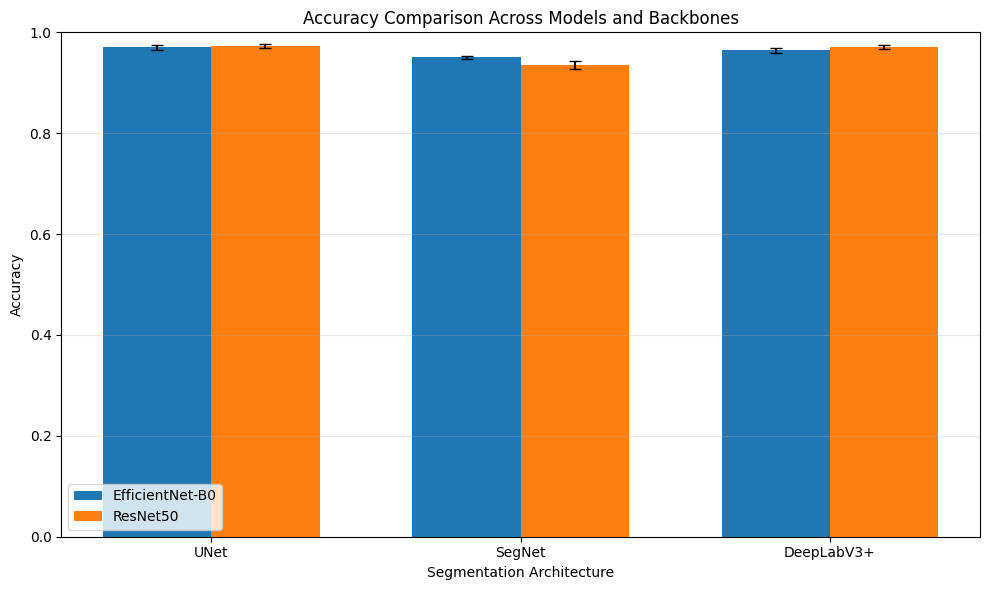

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/accuracy_comparison.png


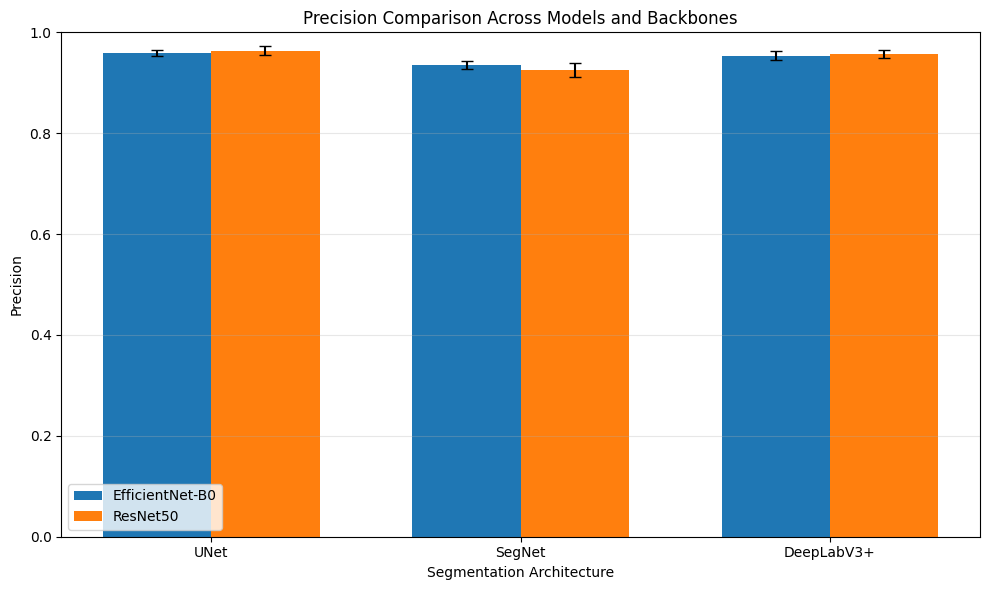

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/precision_comparison.png


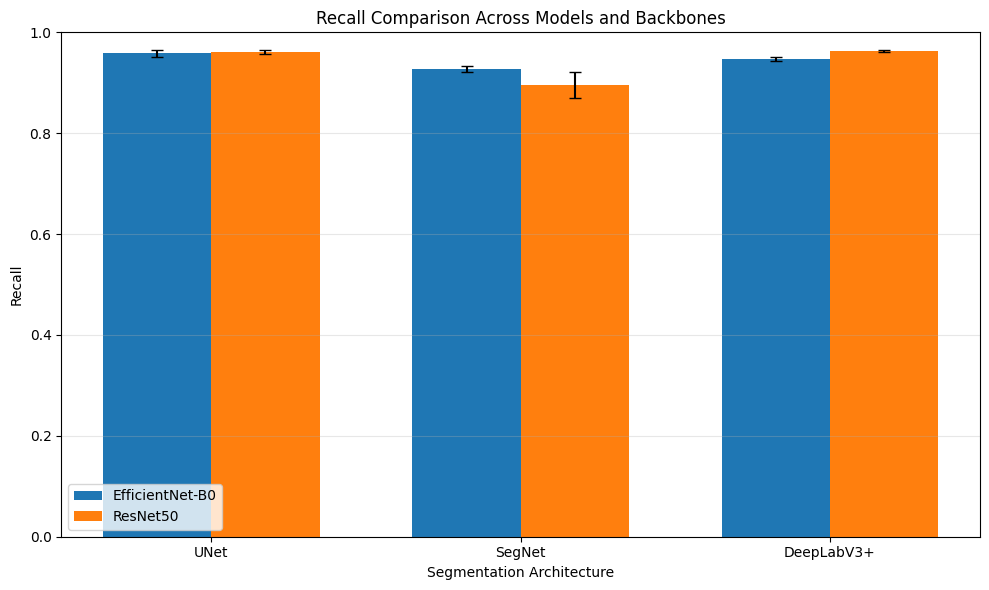

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/recall_comparison.png


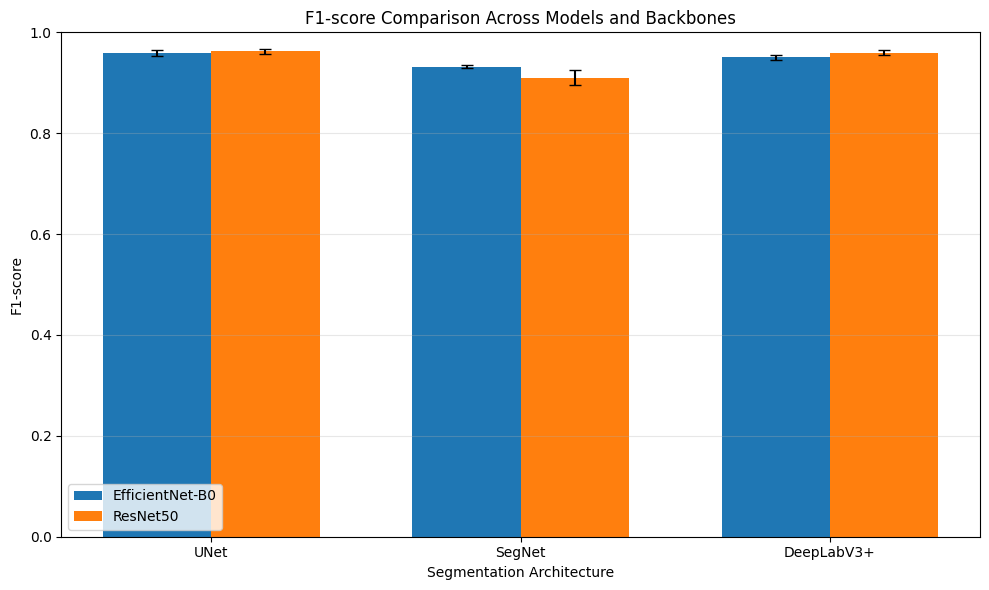

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/f1_comparison.png


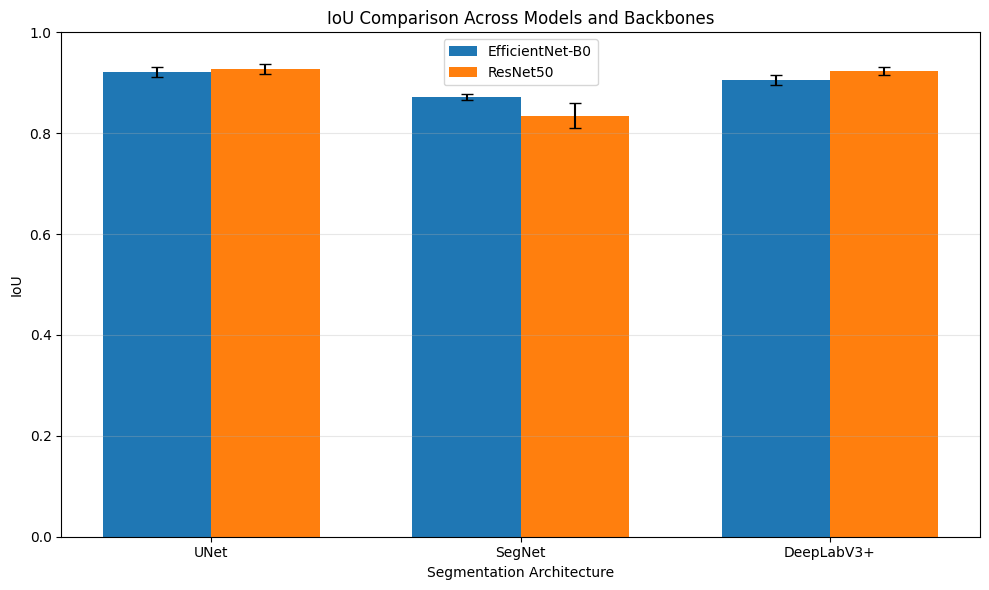

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/iou_comparison.png


In [ ]:
MODEL_ORDER = ["UNet", "SegNet", "DeepLabV3+"]
BACKBONE_ORDER = ["efficientnet-b0", "resnet50"]

BACKBONE_LABELS = {
    "efficientnet-b0": "EfficientNet-B0",
    "resnet50": "ResNet50"
}


def save_and_show_plot(filename):
    path = os.path.join(PLOT_DIR, filename)
    plt.tight_layout()
    plt.savefig(path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", path)


def plot_metric_comparison(metric, ylabel, filename):
    summary = (
        fold_df
        .groupby(["model", "backbone"])[metric]
        .agg(["mean", "std"])
        .reset_index()
    )

    x = np.arange(len(MODEL_ORDER))
    width = 0.35

    plt.figure(figsize=(10, 6))

    for i, backbone in enumerate(BACKBONE_ORDER):
        means = []
        stds = []

        for model_name in MODEL_ORDER:
            row = summary[
                (summary["model"] == model_name) &
                (summary["backbone"] == backbone)
            ]

            if len(row) == 0:
                means.append(np.nan)
                stds.append(0)
            else:
                means.append(row["mean"].values[0])
                stds.append(row["std"].values[0])

        offset = (i - 0.5) * width

        plt.bar(
            x + offset,
            means,
            width,
            yerr=stds,
            capsize=4,
            label=BACKBONE_LABELS[backbone]
        )

    plt.xticks(x, MODEL_ORDER)
    plt.ylabel(ylabel)
    plt.xlabel("Segmentation Architecture")
    plt.title(f"{ylabel} Comparison Across Models and Backbones")
    plt.ylim(0, 1.0)
    plt.legend()
    plt.grid(axis="y", alpha=0.3)

    save_and_show_plot(filename)


plot_metric_comparison("accuracy", "Accuracy", "accuracy_comparison.png")
plot_metric_comparison("precision", "Precision", "precision_comparison.png")
plot_metric_comparison("recall", "Recall", "recall_comparison.png")
plot_metric_comparison("f1", "F1-score", "f1_comparison.png")
plot_metric_comparison("iou", "IoU", "iou_comparison.png")

### 16. Runtime comparison plots

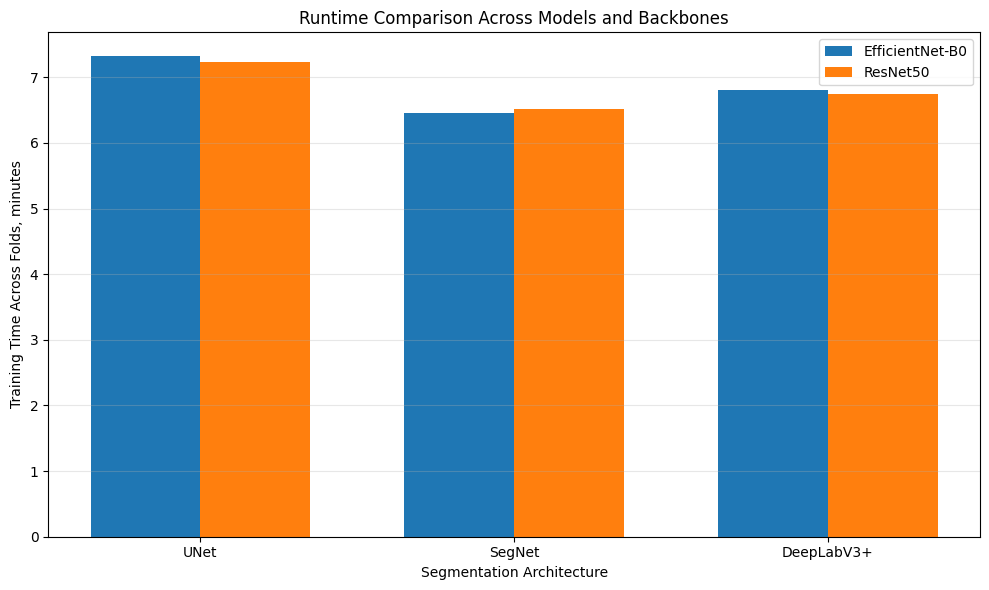

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/runtime_comparison.png


In [ ]:
runtime_summary = (
    fold_df
    .groupby(["model", "backbone"])["fold_seconds"]
    .sum()
    .reset_index()
)

runtime_summary["runtime_minutes"] = runtime_summary["fold_seconds"] / 60.0

x = np.arange(len(MODEL_ORDER))
width = 0.35

plt.figure(figsize=(10, 6))

for i, backbone in enumerate(BACKBONE_ORDER):
    runtimes = []

    for model_name in MODEL_ORDER:
        row = runtime_summary[
            (runtime_summary["model"] == model_name) &
            (runtime_summary["backbone"] == backbone)
        ]

        if len(row) == 0:
            runtimes.append(np.nan)
        else:
            runtimes.append(row["runtime_minutes"].values[0])

    offset = (i - 0.5) * width

    plt.bar(
        x + offset,
        runtimes,
        width,
        label=BACKBONE_LABELS[backbone]
    )

plt.xticks(x, MODEL_ORDER)
plt.ylabel("Training Time Across Folds, minutes")
plt.xlabel("Segmentation Architecture")
plt.title("Runtime Comparison Across Models and Backbones")
plt.legend()
plt.grid(axis="y", alpha=0.3)

save_and_show_plot("runtime_comparison.png")

### 17.IoU and F1 training curves

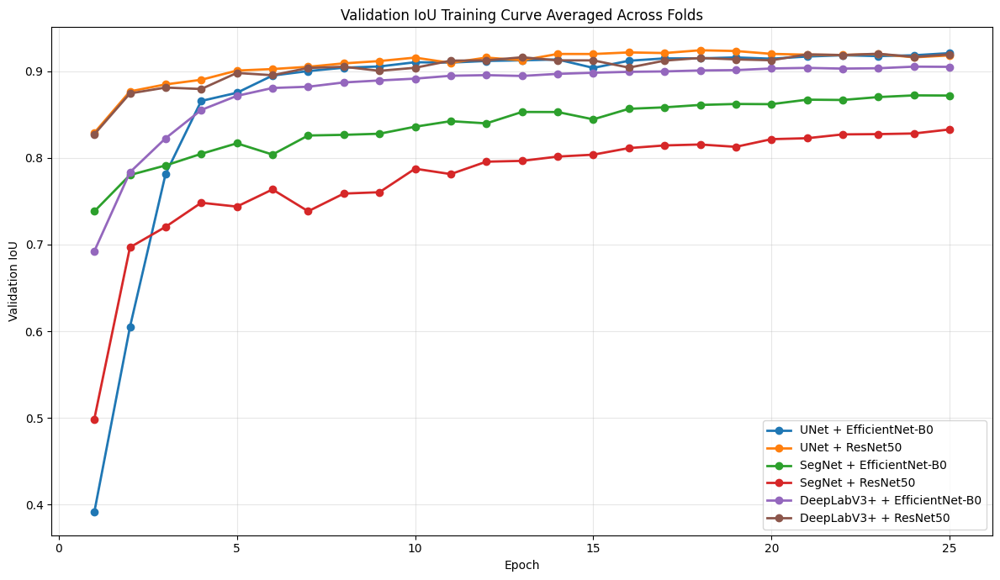

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/iou_training_curves.png


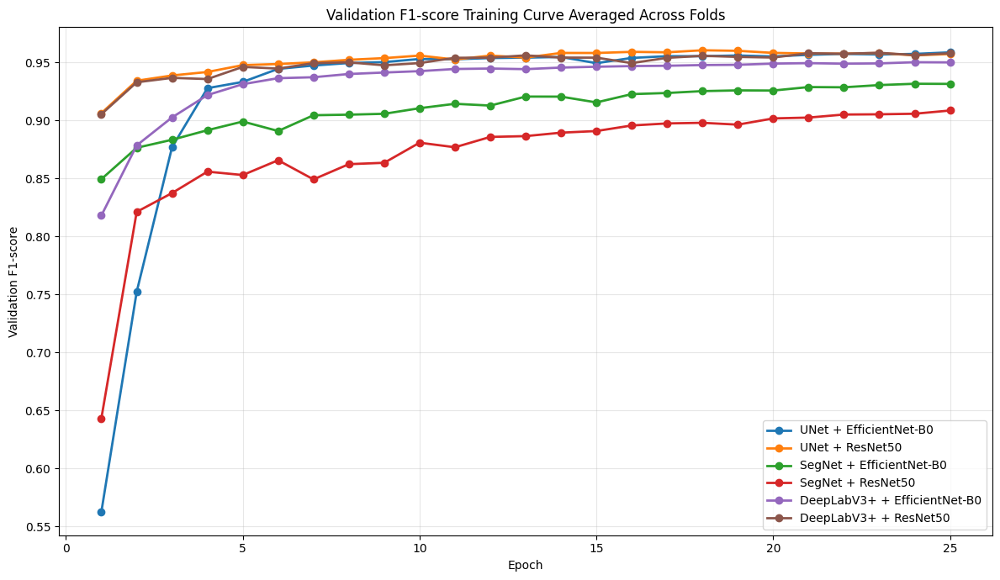

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/f1_training_curves.png


In [ ]:
history_path = os.path.join(OUTPUT_DIR, "training_history.csv")
history_df = pd.read_csv(history_path)


def plot_training_curve(metric, ylabel, filename):
    curve_df = (
        history_df
        .groupby(["model", "backbone", "epoch"])[metric]
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(12, 7))

    for model_name in MODEL_ORDER:
        for backbone in BACKBONE_ORDER:
            subset = curve_df[
                (curve_df["model"] == model_name) &
                (curve_df["backbone"] == backbone)
            ].sort_values("epoch")

            if len(subset) == 0:
                continue

            label = f"{model_name} + {BACKBONE_LABELS[backbone]}"

            plt.plot(
                subset["epoch"],
                subset[metric],
                marker="o",
                linewidth=2,
                label=label
            )

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(f"{ylabel} Training Curve Averaged Across Folds")
    plt.legend()
    plt.grid(alpha=0.3)

    save_and_show_plot(filename)


plot_training_curve("iou", "Validation IoU", "iou_training_curves.png")
plot_training_curve("f1", "Validation F1-score", "f1_training_curves.png")

### 18. Loss curves

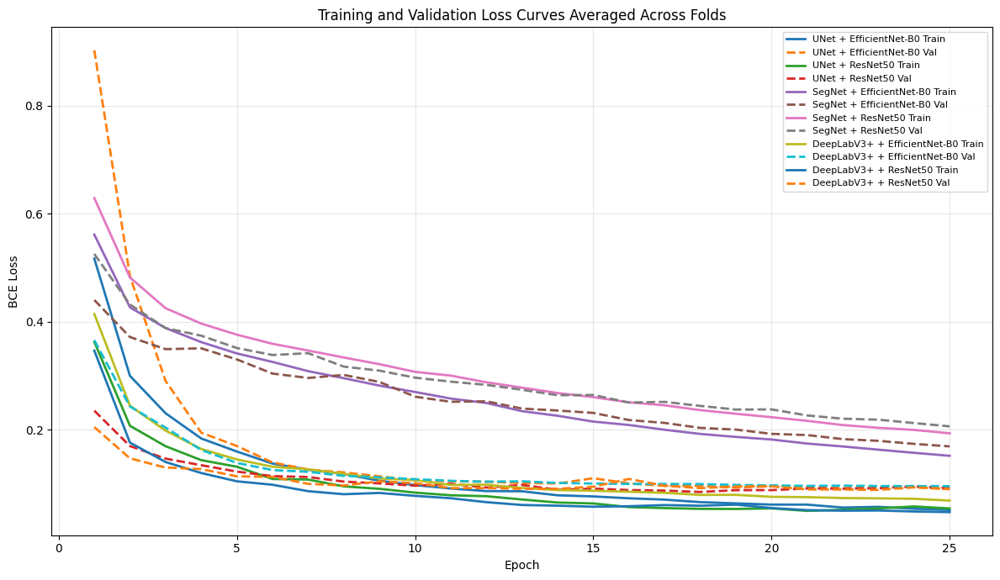

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/loss_training_curves.png


In [ ]:
loss_curve_df = (
    history_df
    .groupby(["model", "backbone", "epoch"])[["train_loss", "val_loss"]]
    .mean()
    .reset_index()
)

plt.figure(figsize=(12, 7))

for model_name in MODEL_ORDER:
    for backbone in BACKBONE_ORDER:
        subset = loss_curve_df[
            (loss_curve_df["model"] == model_name) &
            (loss_curve_df["backbone"] == backbone)
        ].sort_values("epoch")

        if len(subset) == 0:
            continue

        label_train = f"{model_name} + {BACKBONE_LABELS[backbone]} Train"
        label_val = f"{model_name} + {BACKBONE_LABELS[backbone]} Val"

        plt.plot(
            subset["epoch"],
            subset["train_loss"],
            linestyle="-",
            linewidth=2,
            label=label_train
        )

        plt.plot(
            subset["epoch"],
            subset["val_loss"],
            linestyle="--",
            linewidth=2,
            label=label_val
        )

plt.xlabel("Epoch")
plt.ylabel("BCE Loss")
plt.title("Training and Validation Loss Curves Averaged Across Folds")
plt.legend(fontsize=8)
plt.grid(alpha=0.3)

save_and_show_plot("loss_training_curves.png")

### 19. All models on one random image

Random sample index: 114
Image path: /content/flood_dataset_unzipped/dataset/train/images/HS115.png
Mask path: /content/flood_dataset_unzipped/dataset/train/labels/HS115.png


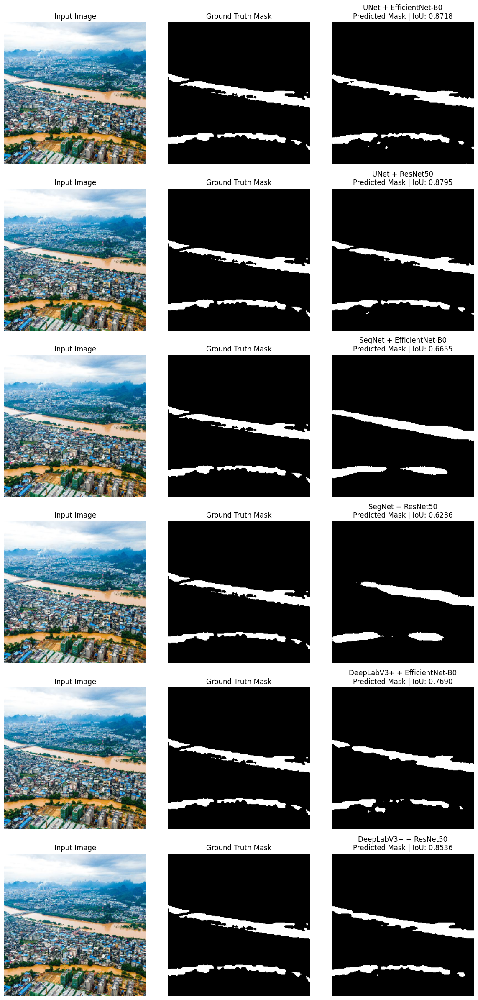

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/all_models_random_sample_predictions.png


In [ ]:
RESULTS_PATH = os.path.join(OUTPUT_DIR, "fold_best_results.csv")
fold_df = pd.read_csv(RESULTS_PATH)

def safe_torch_load(checkpoint_path):
    try:
        return torch.load(checkpoint_path, map_location=DEVICE, weights_only=False)
    except TypeError:
        return torch.load(checkpoint_path, map_location=DEVICE)

# Pick the best checkpoint for each model-backbone pair based on IoU
best_model_rows = (
    fold_df
    .sort_values("iou", ascending=False)
    .groupby(["model", "backbone"], as_index=False)
    .first()
)

MODEL_ORDER = ["UNet", "SegNet", "DeepLabV3+"]
BACKBONE_ORDER = ["efficientnet-b0", "resnet50"]

BACKBONE_LABELS = {
    "efficientnet-b0": "EfficientNet-B0",
    "resnet50": "ResNet50"
}

# Choose one random image from the full dataset
RANDOM_SAMPLE_INDEX = random.randint(0, len(image_paths) - 1)

print("Random sample index:", RANDOM_SAMPLE_INDEX)
print("Image path:", image_paths[RANDOM_SAMPLE_INDEX])
print("Mask path:", mask_paths[RANDOM_SAMPLE_INDEX])


def build_model_for_inference(model_name, backbone_name):
    """
    Builds the same architecture but avoids loading ImageNet weights again.
    We only need the structure because checkpoint weights will be loaded.
    """

    if model_name == "UNet":
        model = smp.Unet(
            encoder_name=backbone_name,
            encoder_weights=None,
            in_channels=3,
            classes=1,
            activation="sigmoid"
        )

    elif model_name == "DeepLabV3+":
        model = smp.DeepLabV3Plus(
            encoder_name=backbone_name,
            encoder_weights=None,
            in_channels=3,
            classes=1,
            activation="sigmoid"
        )

    elif model_name == "SegNet":
        timm_name_map = {
            "efficientnet-b0": "efficientnet_b0",
            "resnet50": "resnet50"
        }

        model = SegNetTimm(
            encoder_name=timm_name_map[backbone_name],
            pretrained=False,
            classes=1
        )

    else:
        raise ValueError(f"Unknown model name: {model_name}")

    return model


def load_trained_model_for_inference(checkpoint_path):
    checkpoint = safe_torch_load(checkpoint_path)

    model_name = checkpoint["model_name"]
    backbone_name = checkpoint["backbone_name"]

    model = build_model_for_inference(model_name, backbone_name)
    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(DEVICE)
    model.eval()

    return model


def get_single_sample(index):
    dataset = FloodDataset(
        [image_paths[index]],
        [mask_paths[index]],
        transform=val_transform
    )

    image_tensor, mask_tensor = dataset[0]

    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
    image_np = np.clip(image_np, 0, 1)

    mask_np = mask_tensor.squeeze().cpu().numpy()

    return image_tensor, image_np, mask_np


def predict_single_mask(model, image_tensor):
    input_tensor = image_tensor.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        output = model(input_tensor)

    pred_mask = (output.squeeze().cpu().numpy() > THRESHOLD).astype(np.float32)

    return pred_mask


def calculate_single_image_iou(pred_mask, true_mask):
    pred = pred_mask > 0.5
    true = true_mask > 0.5

    tp = np.logical_and(pred, true).sum()
    fp = np.logical_and(pred, np.logical_not(true)).sum()
    fn = np.logical_and(np.logical_not(pred), true).sum()

    iou = tp / (tp + fp + fn + 1e-7)

    return iou


image_tensor, image_np, true_mask = get_single_sample(RANDOM_SAMPLE_INDEX)

num_models = len(best_model_rows)

plt.figure(figsize=(12, 4 * num_models))

plot_row = 0

for model_name in MODEL_ORDER:
    for backbone_name in BACKBONE_ORDER:
        row = best_model_rows[
            (best_model_rows["model"] == model_name) &
            (best_model_rows["backbone"] == backbone_name)
        ]

        if len(row) == 0:
            continue

        row = row.iloc[0]
        checkpoint_path = row["checkpoint"]

        model = load_trained_model_for_inference(checkpoint_path)

        pred_mask = predict_single_mask(model, image_tensor)
        sample_iou = calculate_single_image_iou(pred_mask, true_mask)

        display_name = f"{model_name} + {BACKBONE_LABELS[backbone_name]}"

        plt.subplot(num_models, 3, plot_row * 3 + 1)
        plt.imshow(image_np)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(num_models, 3, plot_row * 3 + 2)
        plt.imshow(true_mask, cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")

        plt.subplot(num_models, 3, plot_row * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title(f"{display_name}\nPredicted Mask | IoU: {sample_iou:.4f}")
        plt.axis("off")

        plot_row += 1

        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

plt.tight_layout()

comparison_prediction_path = os.path.join(
    PLOT_DIR,
    "all_models_random_sample_predictions.png"
)

plt.savefig(comparison_prediction_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", comparison_prediction_path)

### 20. Best model predictions

Best checkpoint: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/checkpoints/UNet_resnet50_fold_1.pth
Best model: UNet
Best backbone: resnet50
Best fold: 1
Best IoU: 0.9368508440448324


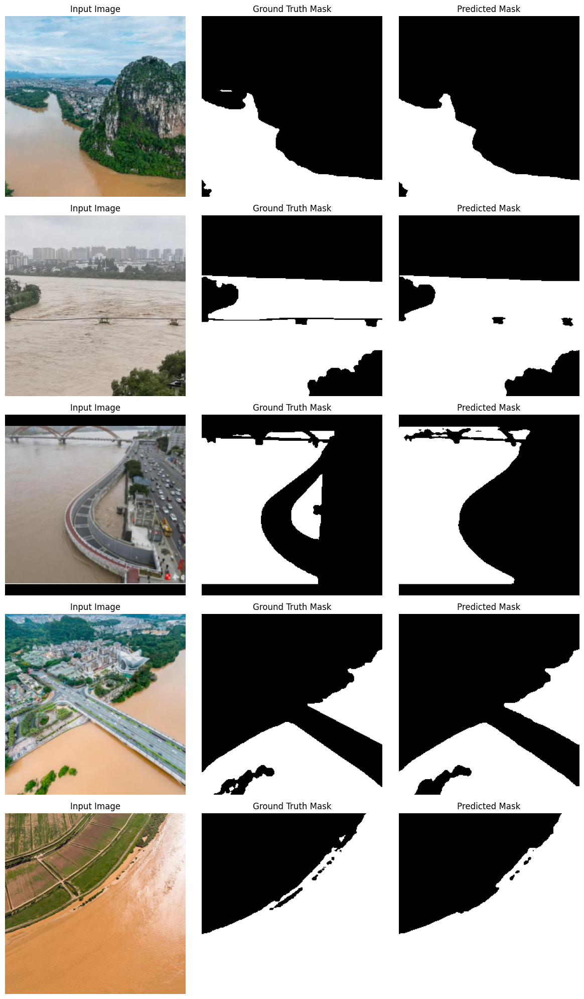

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/sample_predictions_best_model.png


In [ ]:
def load_checkpoint_model(checkpoint_path):
    checkpoint = safe_torch_load(checkpoint_path)

    model_name = checkpoint["model_name"]
    backbone_name = checkpoint["backbone_name"]

    model = build_model(model_name, backbone_name)
    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(DEVICE)
    model.eval()

    return model, checkpoint


best_row = fold_df.sort_values("iou", ascending=False).iloc[0]

best_checkpoint_path = best_row["checkpoint"]
best_fold = int(best_row["fold"])

print("Best checkpoint:", best_checkpoint_path)
print("Best model:", best_row["model"])
print("Best backbone:", best_row["backbone"])
print("Best fold:", best_fold)
print("Best IoU:", best_row["iou"])

best_model, best_checkpoint = load_checkpoint_model(best_checkpoint_path)


kf_for_prediction = KFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=SEED
)

splits = list(kf_for_prediction.split(image_paths))
_, best_val_idx = splits[best_fold - 1]

best_val_images = [image_paths[i] for i in best_val_idx]
best_val_masks = [mask_paths[i] for i in best_val_idx]

prediction_dataset = FloodDataset(
    best_val_images,
    best_val_masks,
    transform=val_transform
)


def predict_sample(model, dataset, index):
    image_tensor, mask_tensor = dataset[index]

    input_tensor = image_tensor.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        output = model(input_tensor)

    pred_mask = (output.squeeze().cpu().numpy() > THRESHOLD).astype(np.float32)
    true_mask = mask_tensor.squeeze().cpu().numpy()

    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
    image_np = np.clip(image_np, 0, 1)

    return image_np, true_mask, pred_mask


num_samples = min(5, len(prediction_dataset))

plt.figure(figsize=(12, 4 * num_samples))

for i in range(num_samples):
    image_np, true_mask, pred_mask = predict_sample(best_model, prediction_dataset, i)

    plt.subplot(num_samples, 3, i * 3 + 1)
    plt.title("Input Image")
    plt.imshow(image_np)
    plt.axis("off")

    plt.subplot(num_samples, 3, i * 3 + 2)
    plt.title("Ground Truth Mask")
    plt.imshow(true_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(num_samples, 3, i * 3 + 3)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap="gray")
    plt.axis("off")

plt.tight_layout()

sample_prediction_path = os.path.join(PLOT_DIR, "sample_predictions_best_model.png")
plt.savefig(sample_prediction_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", sample_prediction_path)

### 21. All model overlay comparison

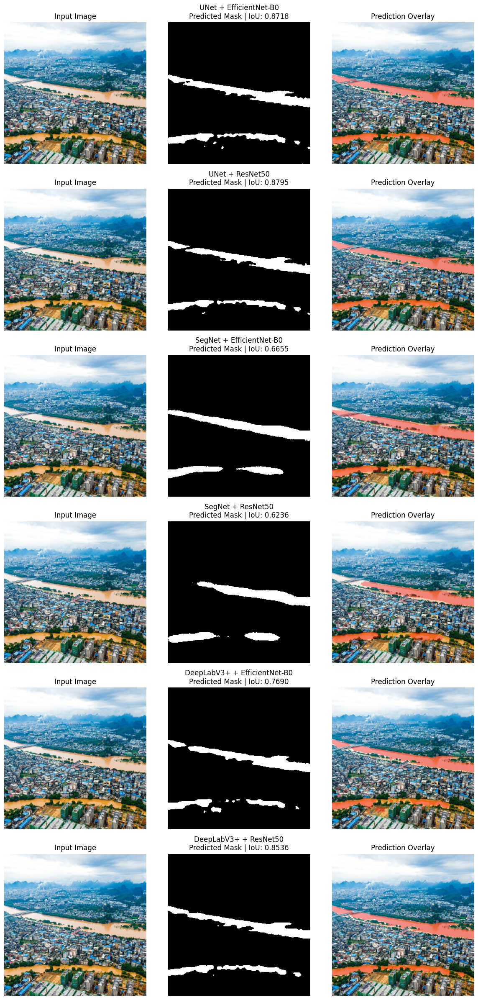

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/all_models_random_sample_overlays.png


In [ ]:
image_tensor, image_np, true_mask = get_single_sample(RANDOM_SAMPLE_INDEX)

num_models = len(best_model_rows)

plt.figure(figsize=(12, 4 * num_models))

plot_row = 0

for model_name in MODEL_ORDER:
    for backbone_name in BACKBONE_ORDER:
        row = best_model_rows[
            (best_model_rows["model"] == model_name) &
            (best_model_rows["backbone"] == backbone_name)
        ]

        if len(row) == 0:
            continue

        row = row.iloc[0]
        checkpoint_path = row["checkpoint"]

        model = load_trained_model_for_inference(checkpoint_path)

        pred_mask = predict_single_mask(model, image_tensor)
        sample_iou = calculate_single_image_iou(pred_mask, true_mask)

        overlay = image_np.copy()
        overlay[pred_mask > 0.5] = [1.0, 0.0, 0.0]

        blended = 0.65 * image_np + 0.35 * overlay
        blended = np.clip(blended, 0, 1)

        display_name = f"{model_name} + {BACKBONE_LABELS[backbone_name]}"

        plt.subplot(num_models, 3, plot_row * 3 + 1)
        plt.imshow(image_np)
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(num_models, 3, plot_row * 3 + 2)
        plt.imshow(pred_mask, cmap="gray")
        plt.title(f"{display_name}\nPredicted Mask | IoU: {sample_iou:.4f}")
        plt.axis("off")

        plt.subplot(num_models, 3, plot_row * 3 + 3)
        plt.imshow(blended)
        plt.title("Prediction Overlay")
        plt.axis("off")

        plot_row += 1

        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

plt.tight_layout()

comparison_overlay_path = os.path.join(
    PLOT_DIR,
    "all_models_random_sample_overlays.png"
)

plt.savefig(comparison_overlay_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", comparison_overlay_path)

### 22. Best model overall


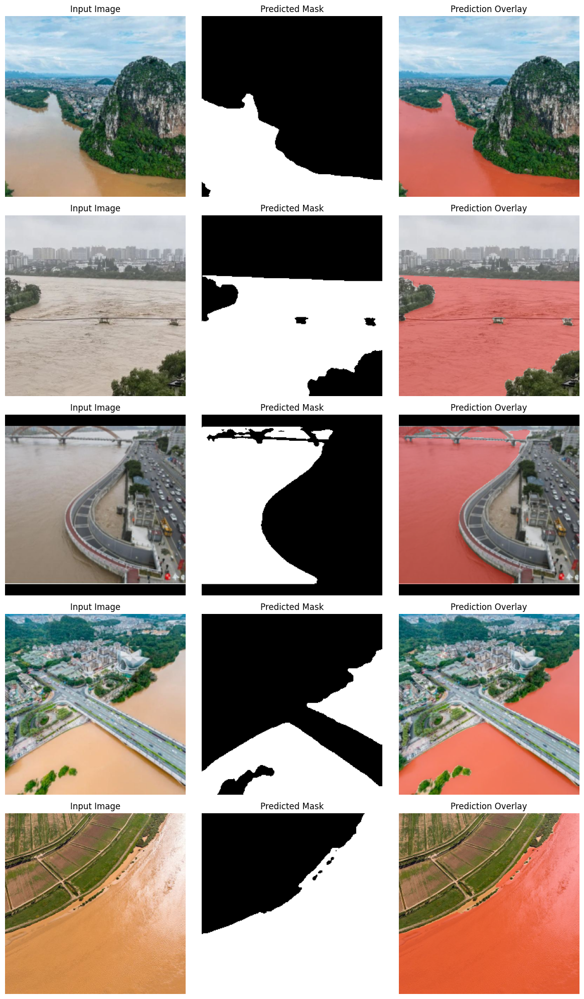

Saved: /content/drive/MyDrive/DL_Project/outputs/final_4fold_25epochs/plots/sample_prediction_overlays_best_model.png


In [ ]:
num_samples = min(5, len(prediction_dataset))

plt.figure(figsize=(12, 4 * num_samples))

for i in range(num_samples):
    image_np, true_mask, pred_mask = predict_sample(best_model, prediction_dataset, i)

    overlay = image_np.copy()
    overlay[pred_mask > 0.5] = [1.0, 0.0, 0.0]

    blended = 0.65 * image_np + 0.35 * overlay
    blended = np.clip(blended, 0, 1)

    plt.subplot(num_samples, 3, i * 3 + 1)
    plt.title("Input Image")
    plt.imshow(image_np)
    plt.axis("off")

    plt.subplot(num_samples, 3, i * 3 + 2)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap="gray")
    plt.axis("off")

    plt.subplot(num_samples, 3, i * 3 + 3)
    plt.title("Prediction Overlay")
    plt.imshow(blended)
    plt.axis("off")

plt.tight_layout()

overlay_path = os.path.join(PLOT_DIR, "sample_prediction_overlays_best_model.png")
plt.savefig(overlay_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", overlay_path)